# 1. Functions and imports

In [13]:
import os, sys, obspy
import numpy as np
import matplotlib.pyplot as plt
import pickle
LIBpath = os.path.join( os.getenv('HOME'),'src','kitchensinkGT', 'LIB')
sys.path.append(LIBpath)
from libseisGT import inventory2traceid, get_FDSN_inventory, clean_trace, \
    attach_station_coordinates_from_inventory
from obspy.clients.fdsn import Client
#from obspy.core.util import AttribDict
from obspy.geodetics import locations2degrees, degrees2kilometers

def get_fdsn_identifier(fdsnURL):
    prepend=''
    if 'iris' in fdsnURL:
        prepend='iris_'
    if 'shake' in fdsnURL:
        prepend='rboom_'
    if 'geonet' in fdsnURL:
        prepend='nz_'  
    return prepend

def get_inventory_and_waveforms(fdsnClient, searchRadiusDeg, olat, olon, startt, endt, chanstring, data_root, overwrite=False):
    fdsnClient = Client(fdsnURL)  
    if not os.path.isdir(data_root):
        print('No such directory %s' % data_root)
        return None, None
    
    # STEP 1 - FIND STATIONS BY REQUESTING AN INVENTORY
    prepend = get_fdsn_identifier(fdsnURL)
    stationXmlFile = os.path.join(data_root, '%s%s_within_%.0f_degrees.xml' % (prepend, chanstring, searchRadiusDeg))
    mseedfile = stationXmlFile.replace('.xml','.mseed')
    print(stationXmlFile, mseedfile)
    
    if os.path.exists(stationXmlFile) and overwrite==False:
        inv = obspy.read_inventory(stationXmlFile)
    else:
        inv = get_FDSN_inventory(fdsnClient, startt, stationXmlFile, '*', olat, olon, \
            searchRadiusDeg, 0, endt - startt, channel = chanstring ) # get all low rate, outside barometers
    trace_ids = inventory2traceid(inv)
    print(trace_ids)
    
    # STEP 2 - LOAD CORRESPONDING WAVEFORM DATA
    if os.path.exists(mseedfile) and overwrite==False:
        st = obspy.core.read(mseedfile)
    else:
        st = obspy.core.Stream()
        for trace_id in trace_ids:
            try:
                net, sta, loc, cha = trace_id.split('.')
            except:
                net, sta, cha = trace_id.split('.')
                loc = '*'
            try:
                st0 = fdsnClient.get_waveforms(net, sta, loc, cha, startt, endt)
                print('waveform downloaded for ', trace_id)
                if len(st0)==1:
                    st.append(st0[0])
                else:
                    print('More than 1 Trace')
                    last_id = ''
                    for tr0 in st0:
                        if tr0.id != last_id:
                            st.append(tr0)
                        else:
                            st.remove(st[-1])
            except:
                print('failed to download waveform for ', trace_id)
            
        # save waveform data
        if len(st)>0:
            st.write(stationXmlFile.replace('.xml','.mseed'))
        
    return st, inv

def reconstitute_stream(st, inv, fmin=0.0001):
    T=1.0/fmin
    
    # deal with multiple traces with same trace ID, by appending and merging one at a time,
    # and removing any time there is a fail.
    st2 = obspy.core.Stream()
    for tr_original in st:
        tr = tr_original.copy()
        st2 = st2.append(tr)
        try:
            st2.merge(method=1, fill_value=0)
        except:
            st2.remove(tr)
            pass
        
    # reconstitute as many traces as possible, and return them
    reconstituted = obspy.core.Stream()
    failed_ids = []
    for tr_original in st2:
        tr = tr_original.copy()
        
        # remove gappy Trace objects, filled with 0 above (threshold 10%)
        n = np.count_nonzero(tr.data==0)
        if n/len(tr.data) > 0.1:
            st2.remove(tr_original)
            continue
            
        # high pass filter    
        tr.detrend('linear')
        duration = tr.stats.endtime - tr.stats.starttime
        tr.taper(T/duration)
        tr.stats['maxamp_raw'] = np.max(np.abs(tr.data))
        tr.filter("highpass", freq=fmin, corners=2)
        
        # remove response
        try:
            tr.remove_response(inventory=inv)
            reconstituted.append(tr)
            #print(tr.id, ' reconstituted')
        except:
            #print(tr.id, ' NOT reconstituted')
            failed_ids.append(tr.id)
            pass
        tr.detrend('linear')
        tr.stats['maxamp_corrected'] = np.max(np.abs(tr.data))
    print('Failed to reconstitute: ', failed_ids)

    #reconstituted.plot(equal_scale=True);
    
    return reconstituted


def attach_station_coordinates_from_inventory(inventory, st):
    """ attach_station_coordinates_from_inventory """
    for tr in st:
        for netw in inventory.networks:
            for sta in netw.stations:
                if tr.stats.station == sta.code and netw.code == tr.stats.network:
                    for cha in sta.channels:
                        if tr.stats.location == cha.location_code:
                            tr.stats.coordinates = obspy.core.util.AttribDict({
                                'latitude':cha.latitude,
                                'longitude':cha.longitude,
                                'elevation':cha.elevation})
                            
def attach_distance_to_stream(st, olat, olon):
    for tr in st:
        try:
            alat = tr.stats['coordinates']['latitude']
            alon = tr.stats['coordinates']['longitude']
            distdeg = locations2degrees(olat, olon, alat, alon)
            distkm = degrees2kilometers(distdeg)
            tr.stats['distance'] =  distkm * 1000
        except:
            print('cannot compute distance for %s' % tr.id)
            
def remove_outliers(a, f=100):
    m = np.median(a)
    bad_indices = []
    for i, v in enumerate(a):
        if v > m * f:
            bad_indices.append(i)
        if v * f < m:
            bad_indices.append(i)            
    #print(bad_indices)
    if len(bad_indices)>0:
        for i in bad_indices:
            a[i]=np.NaN 
    return a
    
def plot_amplitude_versus_distance(st, units):
    r = []
    a = []
    for tr in st:
        r.append(tr.stats.distance)
        #a.append(tr.stats.maxamp_corrected)
        a.append(np.max(np.abs(tr.data)))
    r = np.array(r)/1000 # convert to km
    remove_outliers(a, f=30)     
    fig = plt.figure(figsize=(12,12))
    ax = fig.add_subplot(1,1,1)
    ax.scatter(r/1000, a)
    ax.set_ylabel('Maximum amplitude (%s)' % units)
    ax.set_xlabel('Distance (km)')
    plt.show()
    
def plot_reduced_pressure(st, units):
    r = []
    a = []
    for tr in st:
        r.append(tr.stats.distance)
        #a.append(tr.stats.maxamp_corrected * np.sqrt(tr.stats.distance_in_km))
        a.append(np.max(np.abs(tr.data))* np.sqrt(tr.stats.distance))
    r = np.array(r)/1000 # convert to km    
    remove_outliers(a, f=30)    
    fig = plt.figure(figsize=(12,12))
    ax = fig.add_subplot(1,1,1)
    ax.scatter(r/1000, a)
    ax.set_ylabel('Reduced Pressure (%s)' % units)
    ax.set_xlabel('Distance (km)')
    plt.show()
    
def yes_or_no(question):
    while "the answer is invalid":
        reply = str(input(question+' (y/n): ')).lower().strip()
        if reply[:1] == 'y':
            return True
        if reply[:1] == 'n':
            return False
        
def manually_select_good_traces(st, trim_mins=30):
    stkeep = obspy.core.Stream()
    for tr in st:
        startt = tr.stats.starttime + trim_mins * 60
        endt = tr.stats.endtime - trim_mins + 60      
        if endt > startt:
            tr.trim(starttime=startt, endtime=endt)
            tr.plot()
            print('max = ', np.max(np.abs(tr.data)))
            if yes_or_no('keep this trace? '):
                stkeep.append(tr.copy())
    return stkeep

def select_previously_manually_selected_traces(st, good_ids):
    stkeep = obspy.core.Stream()
    for tr in st:
        if tr.id in good_ids:
            stkeep.append(tr.copy())
    return stkeep

def analyze_clientchan(fdsnClient, chanstring, fmin=0.001):
    T = np.round(1/fmin,0)
    
    this_stream, this_inventory = get_inventory_and_waveforms(fdsnClient, searchRadiusDeg, olat, olon, startt, endt, chanstring, DATA_ROOT, overwrite=False)

    prepend = get_fdsn_identifier(fdsnClient)
    this_reconstituted = reconstitute_stream(this_stream, this_inventory, fmin=fmin)
    reconfile = os.path.join(DATA_ROOT, '%s%s_reconstituted_%.0f.mseed' % (prepend, chanstring, T))    
    #if chanstring[0]!='L':
    #    median_downsample_to_1Hz(this_reconstituted)
    #    reconfile = os.path.join(DATA_ROOT, '%s%s_reconstituted_%.0f_downsampled.mseed' % (prepend, chanstring, T))
    if not os.path.exists(reconfile):
        this_reconstituted.write(reconfile)
    
    good_ids_pickle = os.path.join(DATA_ROOT, '%sgood_%s_ids_within_%.0f_degrees.pkl' % (prepend, chanstring, searchRadiusDeg))
    if os.path.exists(good_ids_pickle):
        with open(good_ids_pickle, 'rb') as f:
            good_ids = pickle.load(f)        
        this_good = select_previously_manually_selected_traces(this_reconstituted, good_ids)
    else:
        this_good = manually_select_good_traces(this_reconstituted)
        good_ids = []
        for tr in this_good:
            good_ids.append(tr.id)
        print(good_ids)
        print(len(good_ids))
        with open(good_ids_pickle, 'wb') as f:
            pickle.dump(good_ids, f)    
        this_good.write(os.path.join(DATA_ROOT, '%s%s_good.mseed' % (prepend, chanstring)))   
        
    attach_station_coordinates_from_inventory(this_inventory, this_good)
    attach_distance_to_stream(this_good, olat, olon)

    this_trimmed = this_good.copy()
    this_trimmed.trim(starttime=startt+T, endtime=startt+T+18*3600) # just examine first pulse
    
    plot_amplitude_versus_distance(this_trimmed, 'Pa')
    plot_reduced_pressure(this_trimmed, 'Pa')
    
    good_inv = subset_inv(this_inventory, this_stream, this_good)
    plot_inv(good_inv)
    
    return this_good, good_inv

def subset_inv(inv, st, st_subset):
    # subset an inventory based on a stream object which is a subset of another
    try:
        inv_new = inv.copy() # got an error here once that Inventory has no copy(), but it does
        for tr in st:
            if len(st_subset.select(id=tr.id))==0:
                inv_new = inv_new.remove(network=tr.stats.network, station=tr.stats.station, location=tr.stats.location, channel=tr.stats.channel)
        return inv_new
    except:
        print('Failed to subset inventory. Returning unchanged')
        return inv

def plot_inv(inv):
    inv.plot(water_fill_color=[0.0, 0.5, 0.8], continent_fill_color=[0.1, 0.6, 0.1], size=30);
    
def medfilt(x, k):
    """Apply a length-k median filter to a 1D array x.
    Boundaries are extended by repeating endpoints.
    """
    assert k % 2 == 1, "Median filter length must be odd."
    assert x.ndim == 1, "Input must be one-dimensional."
    k2 = (k - 1) // 2
    y = np.zeros ((len (x), k), dtype=x.dtype)
    y[:,k2] = x
    for i in range (k2):
        j = k2 - i
        y[j:,i] = x[:-j]
        y[:j,i] = x[0]
        y[:-j,-(i+1)] = x[j:]
        y[-j:,-(i+1)] = x[-1]
    return np.median(y, axis=1)


def median_downsample_to_1Hz(st, winlec_sec=1.0):
    for tr in st:
        y = medfilt(tr.data, np.round(winlen_secs / tr.stats.delta,0) )
        fs = np.round(tr.stats.sampling_rate,0)
        if fs>=2.0:
            fs_new = tr.stats.sampling_rate/fs
            tr.data = y[0::fs]
            tr.stats.sampling_rate=fs_new
        
        

# 2. Parameters

In [ ]:
DATA_ROOT = os.path.join(os.getenv('HOME'), 'DATA', 'Tonga_eruption_analysis')
if not os.path.isdir(DATA_ROOT):
    os.makedirs(DATA_ROOT)
searchRadiusDeg = 180
fmin = 0.0001
T = 1.0/fmin

# location of Hunga-Tonga Hunga-Ha'apai
olat = -(20 + 34/60 + 12 /3600) 
olon = -(175 + 22/60 + 48/3600)
otime = obspy.core.UTCDateTime('2022-01-15T04:14:45.000000Z') # main eruption time - on day 2

startt =  obspy.core.UTCDateTime('2022-01-13T00:00:00.000000Z') - T*2
endt = obspy.core.UTCDateTime('2022-01-20T00:00:00.000000Z') + T*2 # get 34 hours of data, since this is approximate time for sound waves to circle the earth

# 3. Run for infrasound channels

/home/thompsong/DATA/Tonga_eruption_analysis/iris_LDF_within_180_degrees.xml /home/thompsong/DATA/Tonga_eruption_analysis/iris_LDF_within_180_degrees.mseed
['AE.214A.LDF', 'AK.A19K.LDF', 'AK.A21K.LDF', 'AK.A22K.LDF', 'AK.B18K.LDF', 'AK.B20K.LDF', 'AK.B22K.LDF', 'AK.C16K.LDF', 'AK.C18K.LDF', 'AK.C19K.LDF', 'AK.C21K.LDF', 'AK.C23K.LDF', 'AK.C26K.LDF', 'AK.C27K.LDF', 'AK.CAPN.LDF', 'AK.CHUM.LDF', 'AK.COLD.LDF', 'AK.CUT.LDF', 'AK.D17K.LDF', 'AK.D20K.LDF', 'AK.D22K.LDF', 'AK.D24K.LDF', 'AK.D25K.LDF', 'AK.E18K.LDF', 'AK.E19K.LDF', 'AK.E21K.LDF', 'AK.E22K.LDF', 'AK.E24K.LDF', 'AK.E25K.LDF', 'AK.E27K.LDF', 'AK.F15K.LDF', 'AK.F18K.LDF', 'AK.F20K.LDF', 'AK.F21K.LDF', 'AK.G17K.LDF', 'AK.G19K.LDF', 'AK.G23K.LDF', 'AK.G24K.LDF', 'AK.G27K.LDF', 'AK.H16K.LDF', 'AK.H17K.LDF', 'AK.H20K.LDF', 'AK.H21K.LDF', 'AK.H22K.LDF', 'AK.H23K.LDF', 'AK.H24K.LDF', 'AK.HARP.LDF', 'AK.HDA.LDF', 'AK.HOM.LDF', 'AK.I21K.LDF', 'AK.I23K.LDF', 'AK.I26K.LDF', 'AK.I27K.LDF', 'AK.J17K.LDF', 'AK.J19K.LDF', 'AK.J20K.LDF', 'AK.J2

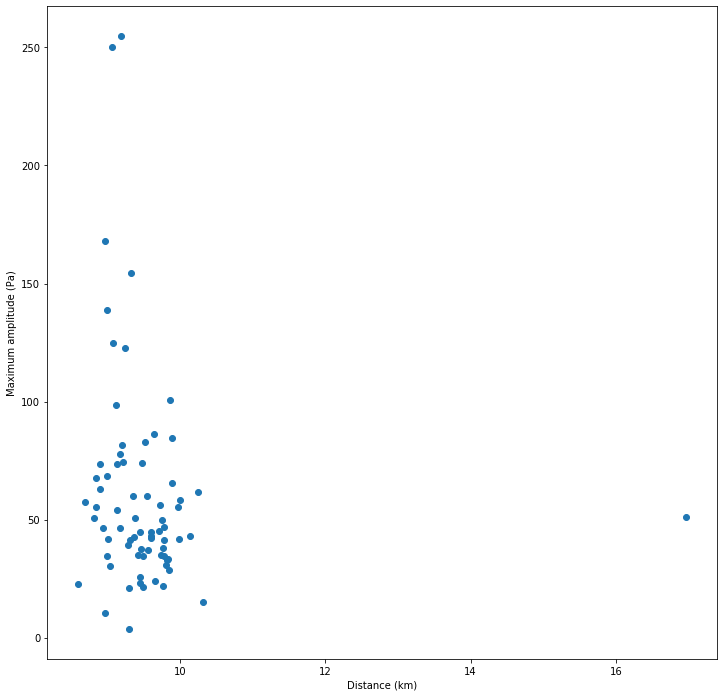

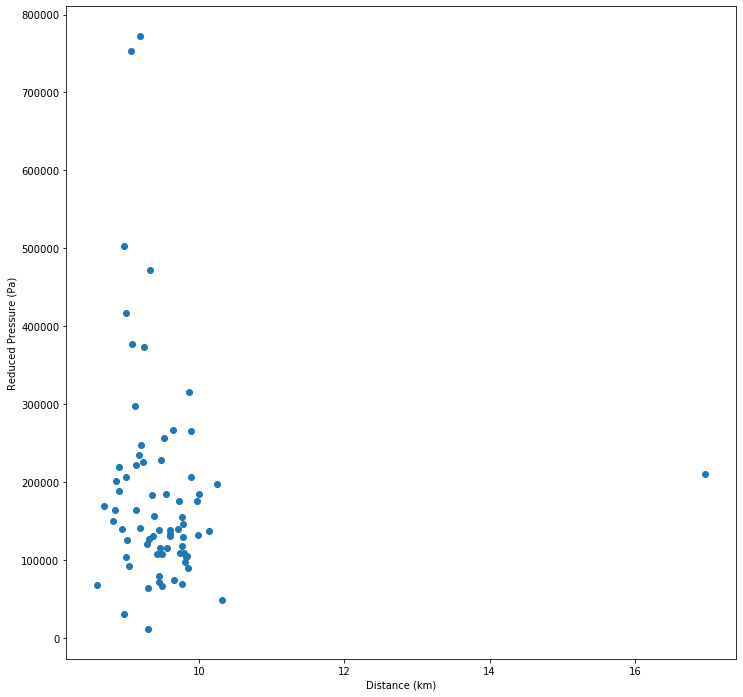

Failed to subset inventory. Returning unchanged


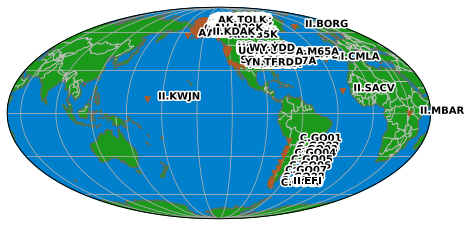

In [14]:
fdsnURL = "http://service.iris.edu"
chanstring = 'LDF'
st_ldf, inv_ldf = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)

# 4. Run for barometers outside (LDO)

In [ ]:
fdsnURL = "http://service.iris.edu"
chanstring = 'LDO'
st_ldo, inv_ldo = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)

/home/thompsong/DATA/Tonga_eruption_analysis/iris_LDO_within_180_degrees.xml /home/thompsong/DATA/Tonga_eruption_analysis/iris_LDO_within_180_degrees.mseed
Trying to load inventory from 2022/01/12 18:26 to 2022/01/20 05:33
inventory saved to /home/thompsong/DATA/Tonga_eruption_analysis/iris_LDO_within_180_degrees.xml
['AE.214A.LDO', 'AK.A19K.LDO', 'AK.A21K.LDO', 'AK.A22K.LDO', 'AK.B18K.LDO', 'AK.B20K.LDO', 'AK.B22K.LDO', 'AK.C16K.LDO', 'AK.C18K.LDO', 'AK.C19K.LDO', 'AK.C21K.LDO', 'AK.C23K.LDO', 'AK.C26K.LDO', 'AK.C27K.LDO', 'AK.CAPN.LDO', 'AK.CHUM.LDO', 'AK.COLD.LDO', 'AK.CUT.LDO', 'AK.D17K.LDO', 'AK.D20K.LDO', 'AK.D22K.LDO', 'AK.D24K.LDO', 'AK.D25K.LDO', 'AK.E18K.LDO', 'AK.E19K.LDO', 'AK.E21K.LDO', 'AK.E22K.LDO', 'AK.E24K.LDO', 'AK.E25K.LDO', 'AK.E27K.LDO', 'AK.F15K.LDO', 'AK.F18K.LDO', 'AK.F20K.LDO', 'AK.F21K.LDO', 'AK.G17K.LDO', 'AK.G19K.LDO', 'AK.G23K.LDO', 'AK.G24K.LDO', 'AK.G27K.LDO', 'AK.H16K.LDO', 'AK.H17K.LDO', 'AK.H20K.LDO', 'AK.H21K.LDO', 'AK.H22K.LDO', 'AK.H23K.LDO', 'AK.H2

failed to download waveform for  AE.214A.LDO
failed to download waveform for  AK.A19K.LDO
waveform downloaded for  AK.A21K.LDO
waveform downloaded for  AK.A22K.LDO
More than 1 Trace
waveform downloaded for  AK.B18K.LDO
More than 1 Trace
waveform downloaded for  AK.B20K.LDO
More than 1 Trace
waveform downloaded for  AK.B22K.LDO
More than 1 Trace
waveform downloaded for  AK.C16K.LDO
More than 1 Trace
failed to download waveform for  AK.C18K.LDO
waveform downloaded for  AK.C19K.LDO
More than 1 Trace
waveform downloaded for  AK.C21K.LDO
More than 1 Trace
waveform downloaded for  AK.C23K.LDO
waveform downloaded for  AK.C26K.LDO
More than 1 Trace
waveform downloaded for  AK.C27K.LDO
More than 1 Trace
waveform downloaded for  AK.CAPN.LDO
More than 1 Trace
waveform downloaded for  AK.CHUM.LDO
waveform downloaded for  AK.COLD.LDO
More than 1 Trace
waveform downloaded for  AK.CUT.LDO
waveform downloaded for  AK.D17K.LDO
waveform downloaded for  AK.D20K.LDO
More than 1 Trace
waveform downloaded f

waveform downloaded for  IU.CHTO.LDO
More than 1 Trace
waveform downloaded for  IU.COLA.LDO
More than 1 Trace
waveform downloaded for  IU.COLA.LDO
More than 1 Trace
waveform downloaded for  IU.COLA.LDO
More than 1 Trace
waveform downloaded for  IU.COR.LDO
More than 1 Trace
waveform downloaded for  IU.COR.LDO
More than 1 Trace
waveform downloaded for  IU.CTAO.LDO
More than 1 Trace
waveform downloaded for  IU.CTAO.LDO
More than 1 Trace
waveform downloaded for  IU.CTAO.LDO
More than 1 Trace
waveform downloaded for  IU.DAV.LDO
More than 1 Trace
waveform downloaded for  IU.DAV.LDO
More than 1 Trace
waveform downloaded for  IU.DWPF.LDO
More than 1 Trace
waveform downloaded for  IU.DWPF.LDO
More than 1 Trace
waveform downloaded for  IU.DWPF.LDO
More than 1 Trace
waveform downloaded for  IU.FUNA.LDO
More than 1 Trace
waveform downloaded for  IU.FUNA.LDO
More than 1 Trace
waveform downloaded for  IU.FURI.LDO
More than 1 Trace
waveform downloaded for  IU.FURI.LDO
More than 1 Trace
waveform downl

# 5. Run for Raspberry Booms

/Users/thompsong/DATA/Tonga202201/rboom_HDF_within_180_degrees.xml /Users/thompsong/DATA/Tonga202201/rboom_HDF_within_180_degrees.mseed
Trying to load inventory from 2022/01/15 04:14 to 2022/01/16 14:14
inventory saved to /Users/thompsong/DATA/Tonga202201/rboom_HDF_within_180_degrees.xml
['AM.RCB56.HDF', 'AM.RCDB6.HDF', 'AM.RC662.HDF', 'AM.RAEE3.HDF', 'AM.RE991.HDF', 'AM.R74D9.HDF', 'AM.R63E7.HDF', 'AM.R99EA.HDF', 'AM.R56C6.HDF', 'AM.R94AB.HDF', 'AM.R0352.HDF', 'AM.R3F75.HDF', 'AM.R5A2C.HDF', 'AM.RF082.HDF', 'AM.R79F9.HDF', 'AM.RC4FB.HDF', 'AM.R796B.HDF', 'AM.R6F55.HDF', 'AM.RC170.HDF', 'AM.R18EB.HDF', 'AM.RC865.HDF', 'AM.RAF39.HDF', 'AM.R75C2.HDF', 'AM.R74F2.HDF', 'AM.R44DC.HDF', 'AM.R2BFC.HDF', 'AM.R9D92.HDF', 'AM.S9E82.HDF', 'AM.RE1B7.HDF', 'AM.RB46B.HDF', 'AM.R25AC.HDF', 'AM.RD469.HDF', 'AM.R8A3D.HDF', 'AM.R3740.HDF', 'AM.R6936.HDF', 'AM.RA48E.HDF', 'AM.R489A.HDF', 'AM.R5C9B.HDF', 'AM.R167F.HDF', 'AM.R3412.HDF', 'AM.R266F.HDF', 'AM.R3333.HDF', 'AM.R5754.HDF', 'AM.R85CD.HDF', 'AM.R2

failed to download waveform for  AM.R44A9.HDF
waveform downloaded for  AM.RB6FC.HDF
More than 1 Trace
waveform downloaded for  AM.R10D3.HDF
More than 1 Trace
waveform downloaded for  AM.REAF3.HDF
More than 1 Trace
waveform downloaded for  AM.R8D5C.HDF
More than 1 Trace
waveform downloaded for  AM.R03EA.HDF
More than 1 Trace
waveform downloaded for  AM.R3A8A.HDF
More than 1 Trace
waveform downloaded for  AM.R3A9B.HDF
More than 1 Trace
waveform downloaded for  AM.R571C.HDF
More than 1 Trace
waveform downloaded for  AM.RCC6E.HDF
More than 1 Trace
waveform downloaded for  AM.R4A5A.HDF
More than 1 Trace
failed to download waveform for  AM.RE726.HDF
waveform downloaded for  AM.R9CDF.HDF
More than 1 Trace
waveform downloaded for  AM.RD44E.HDF
More than 1 Trace
waveform downloaded for  AM.R176D.HDF
More than 1 Trace
waveform downloaded for  AM.R7D64.HDF
More than 1 Trace
waveform downloaded for  AM.R9C27.HDF
More than 1 Trace
waveform downloaded for  AM.RD617.HDF
More than 1 Trace
waveform dow

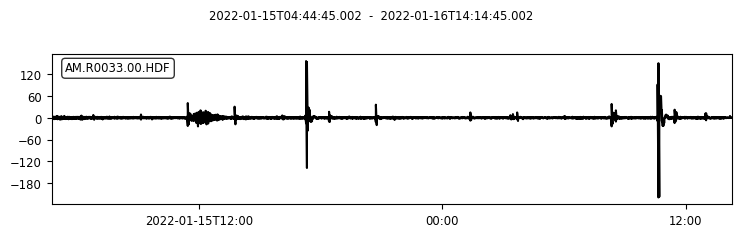

max =  219.266070512
keep this trace?  (y/n): n


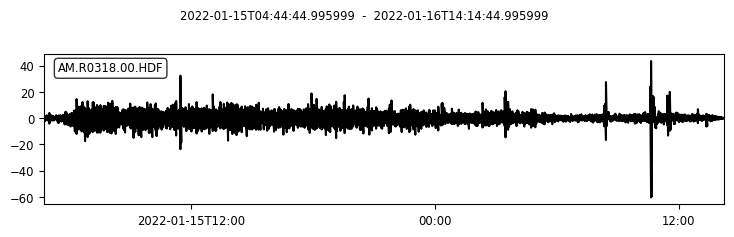

max =  60.3731331179
keep this trace?  (y/n): n


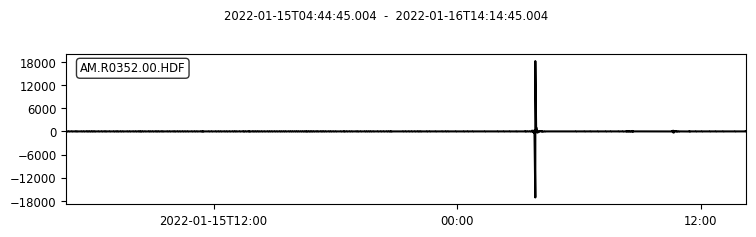

max =  18214.7012116
keep this trace?  (y/n): n


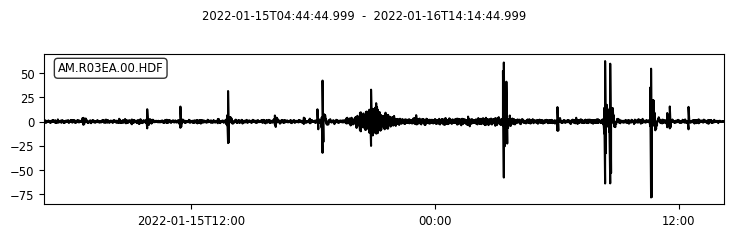

max =  78.5269159637
keep this trace?  (y/n): n


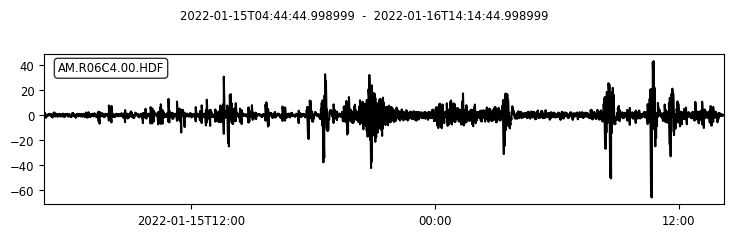

max =  65.9251309823
keep this trace?  (y/n): n


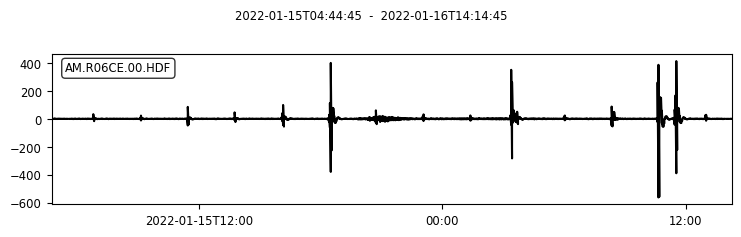

max =  563.065427541
keep this trace?  (y/n): n


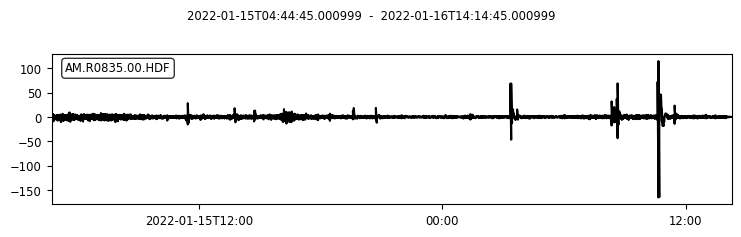

max =  165.248014512
keep this trace?  (y/n): n


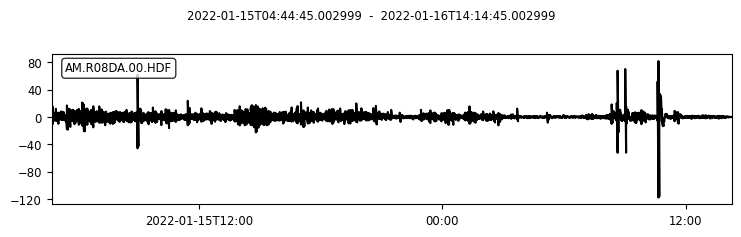

max =  117.775046017
keep this trace?  (y/n): n


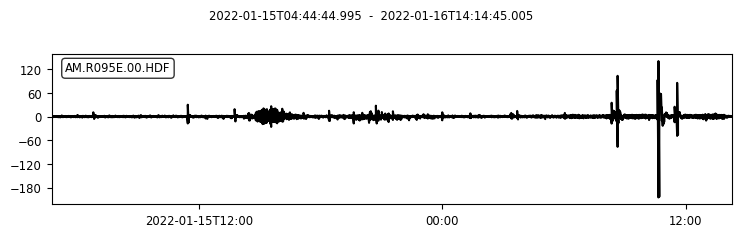

max =  204.609581383
keep this trace?  (y/n): n


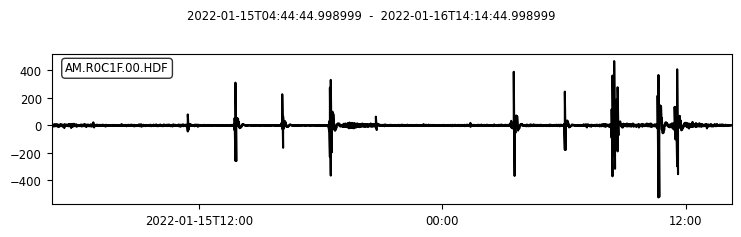

max =  524.195652101
keep this trace?  (y/n): n


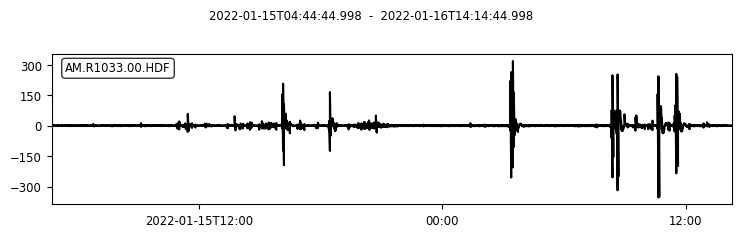

max =  353.779308859
keep this trace?  (y/n): n


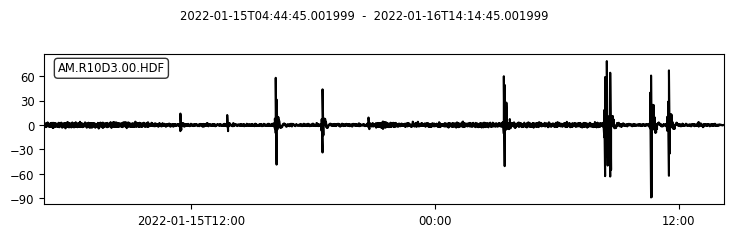

max =  88.9585744846
keep this trace?  (y/n): n


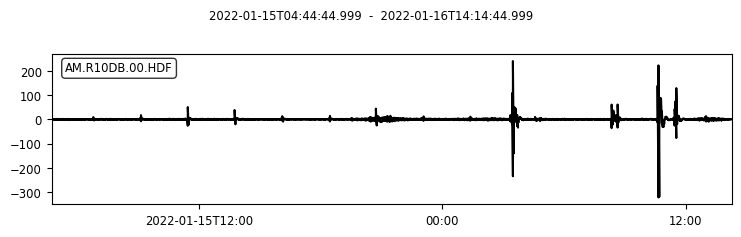

max =  322.438494118
keep this trace?  (y/n): n


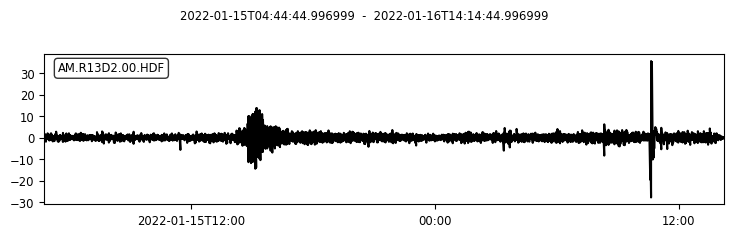

max =  35.6941126191
keep this trace?  (y/n): y


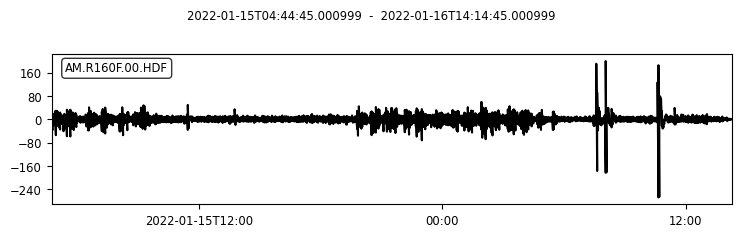

max =  267.809324393
keep this trace?  (y/n): n


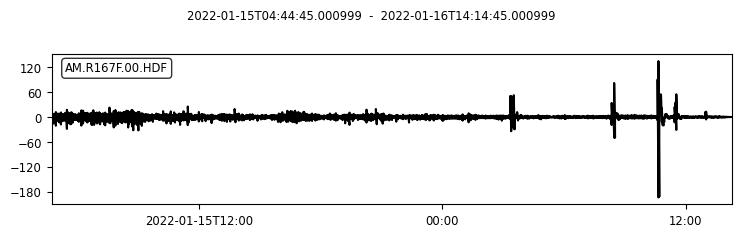

max =  194.401513256
keep this trace?  (y/n): n


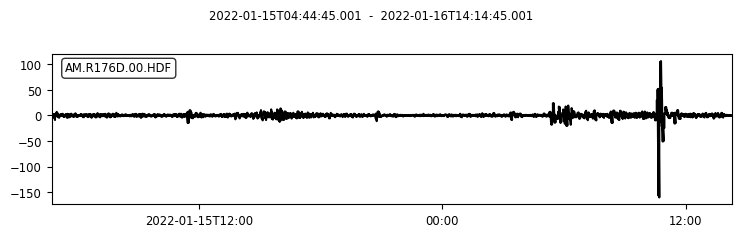

max =  160.274785451
keep this trace?  (y/n): n


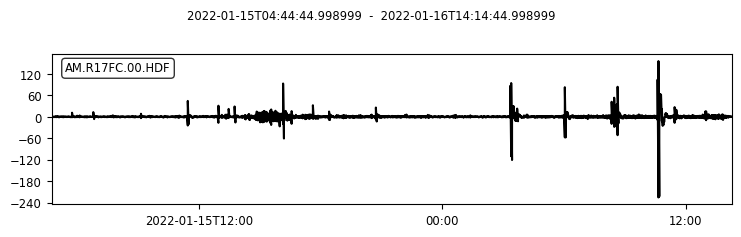

max =  225.256272385
keep this trace?  (y/n): n


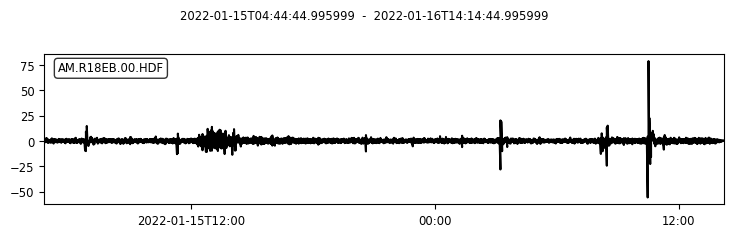

max =  78.800899691
keep this trace?  (y/n): n


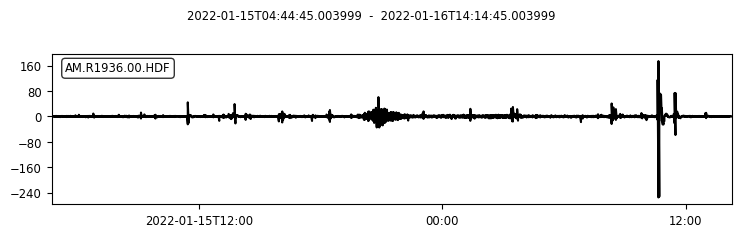

max =  254.837898779
keep this trace?  (y/n): n


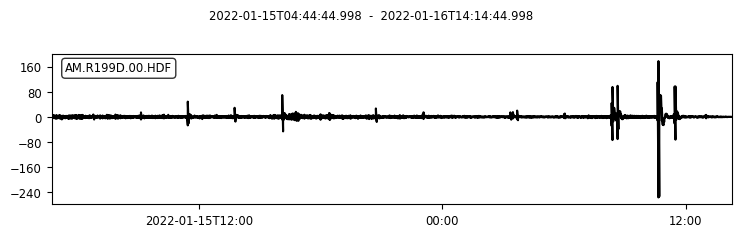

max =  256.91930863
keep this trace?  (y/n): n


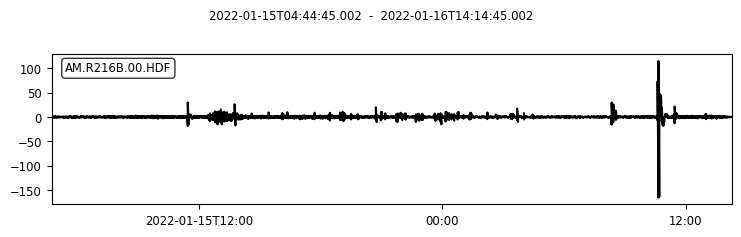

max =  164.995970442
keep this trace?  (y/n): n


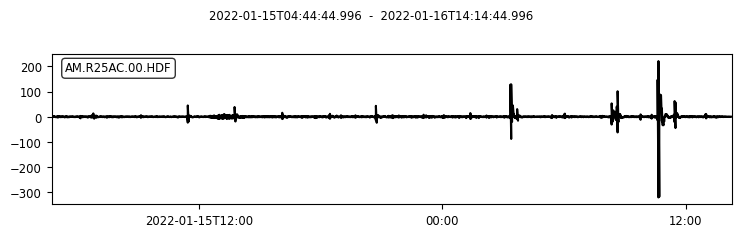

max =  320.103623492
keep this trace?  (y/n): n


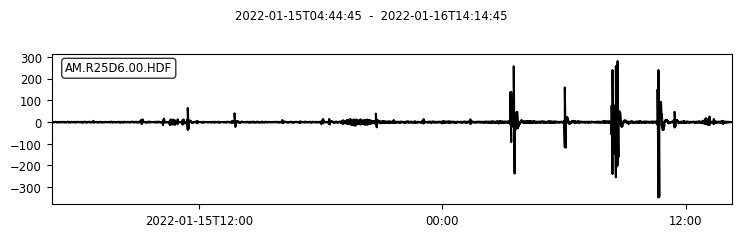

max =  347.483816961
keep this trace?  (y/n): n


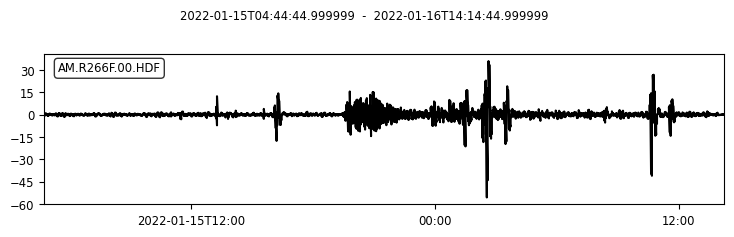

max =  55.5698234442
keep this trace?  (y/n): n


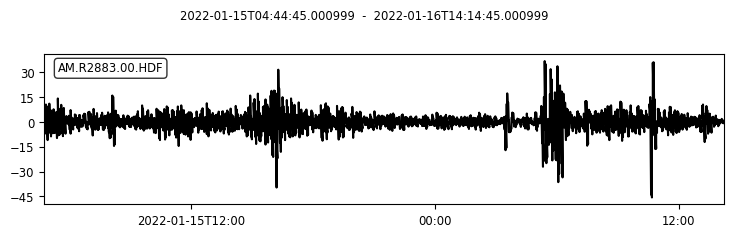

max =  45.5819929943
keep this trace?  (y/n): y


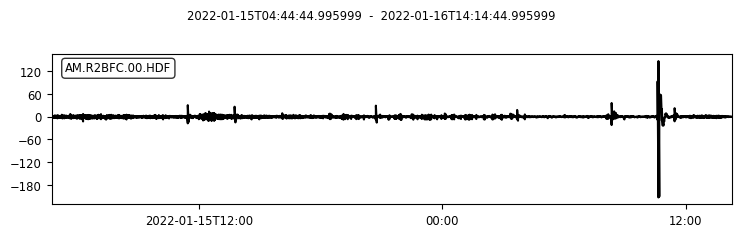

max =  213.311941587
keep this trace?  (y/n): n


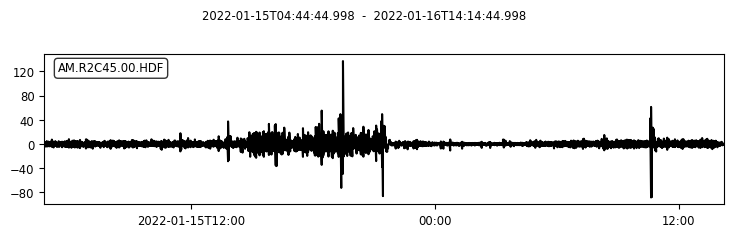

max =  137.18159979
keep this trace?  (y/n): n


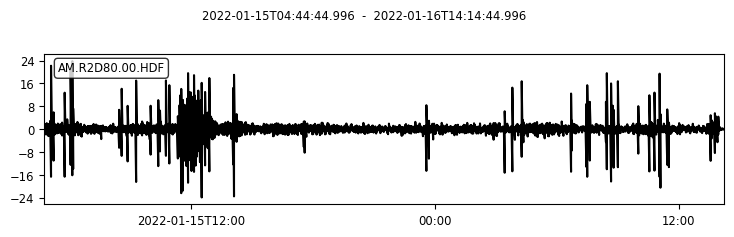

max =  23.9303024647
keep this trace?  (y/n): n


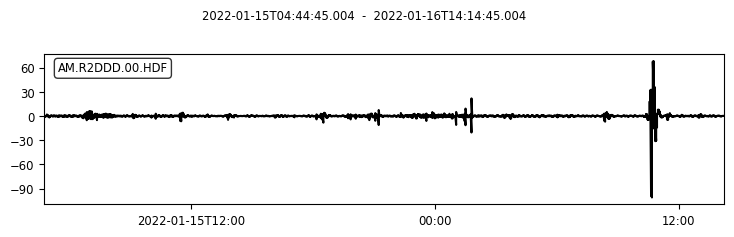

max =  100.819458316
keep this trace?  (y/n): n


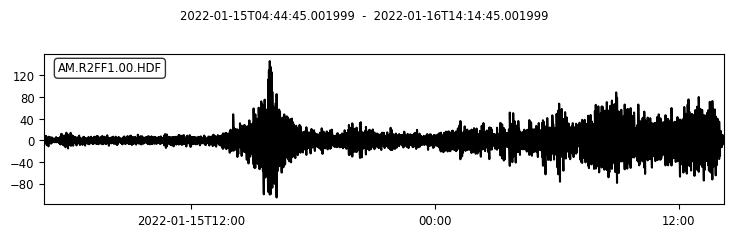

max =  146.604975857
keep this trace?  (y/n): y


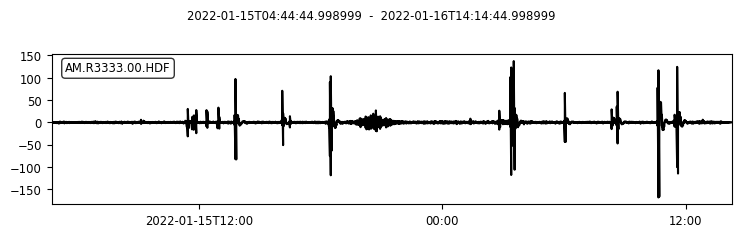

max =  168.042358396
keep this trace?  (y/n): n


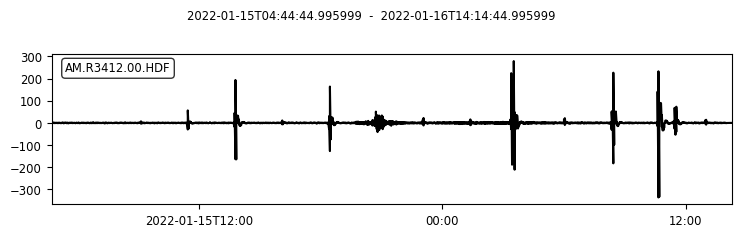

max =  335.90016253
keep this trace?  (y/n): n


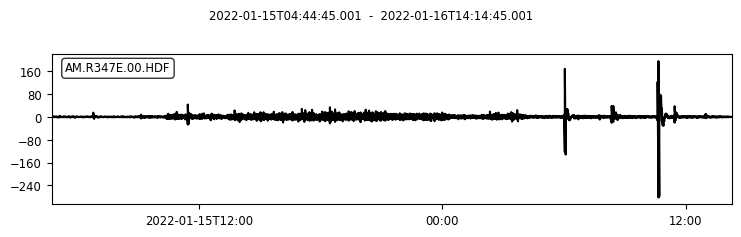

max =  281.861915992
keep this trace?  (y/n): n


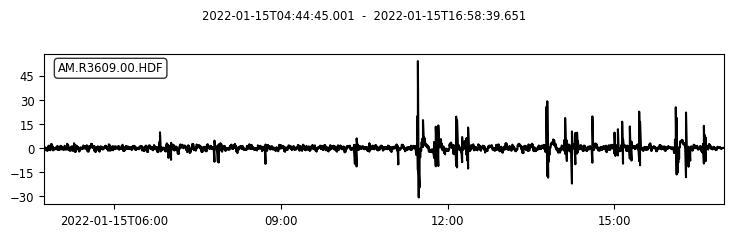

max =  54.1029110093
keep this trace?  (y/n): n


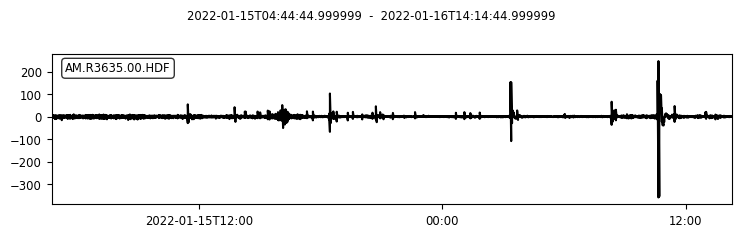

max =  359.604702289
keep this trace?  (y/n): n


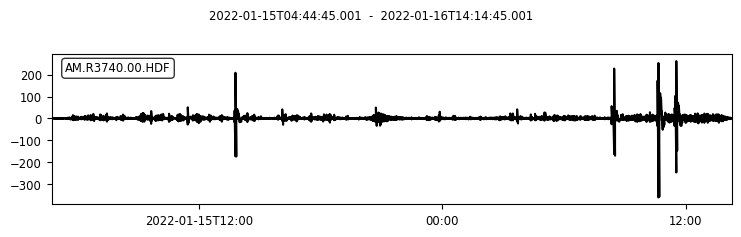

max =  361.933370951
keep this trace?  (y/n): n


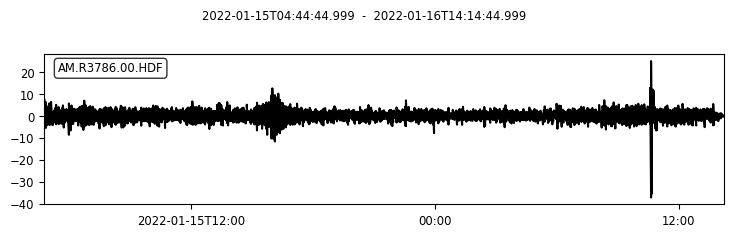

max =  37.1967917101
keep this trace?  (y/n): n


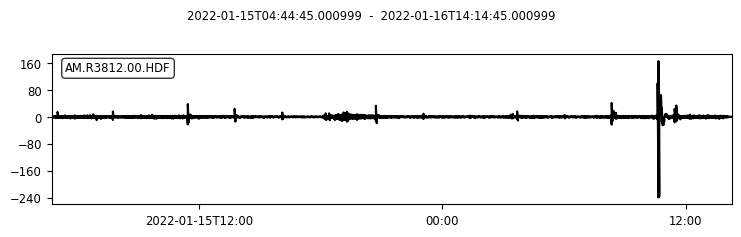

max =  239.775196457
keep this trace?  (y/n): n


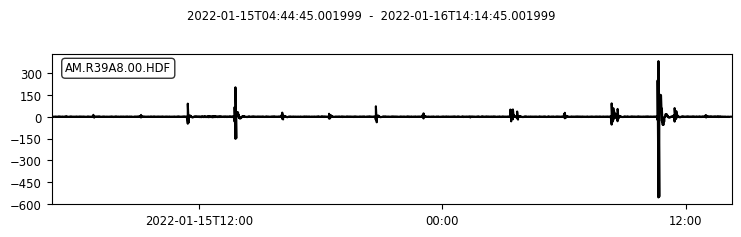

max =  555.46425486
keep this trace?  (y/n): n


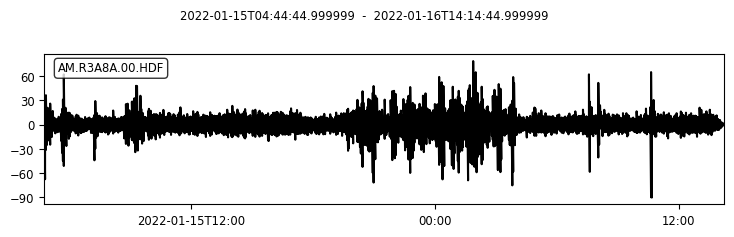

max =  89.9944616621
keep this trace?  (y/n): n


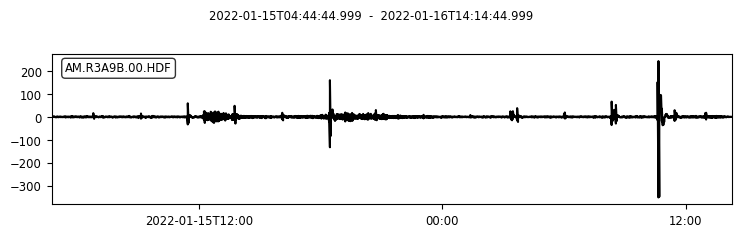

max =  351.257453321
keep this trace?  (y/n): n


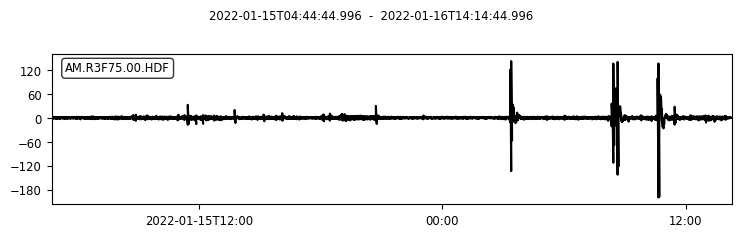

max =  199.292388654
keep this trace?  (y/n): n


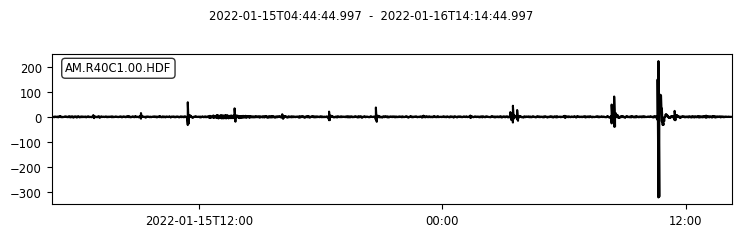

max =  322.567098728
keep this trace?  (y/n): n


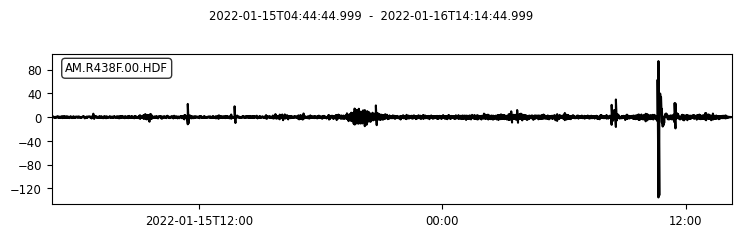

max =  135.603423395
keep this trace?  (y/n): n


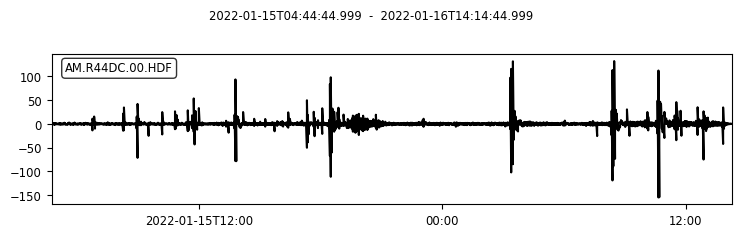

max =  154.826971575
keep this trace?  (y/n): n


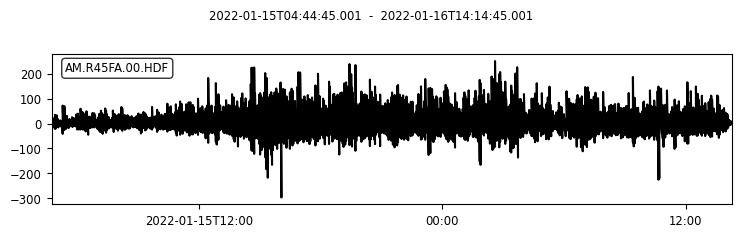

max =  296.355146544
keep this trace?  (y/n): n


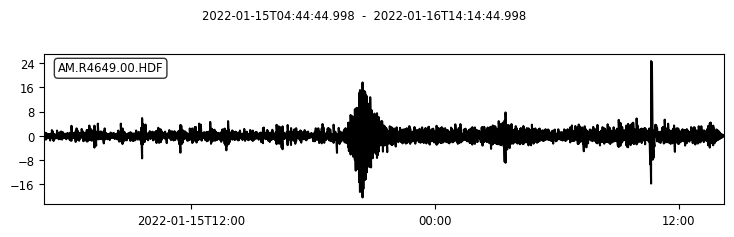

max =  24.7015518244
keep this trace?  (y/n): y


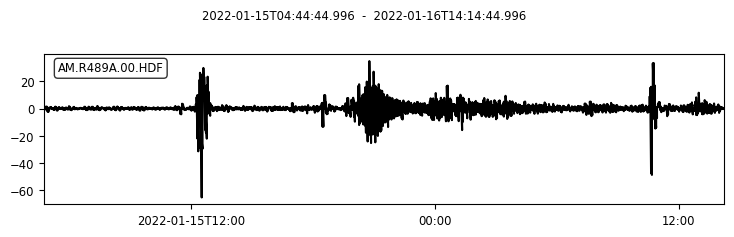

max =  65.141801738
keep this trace?  (y/n): y


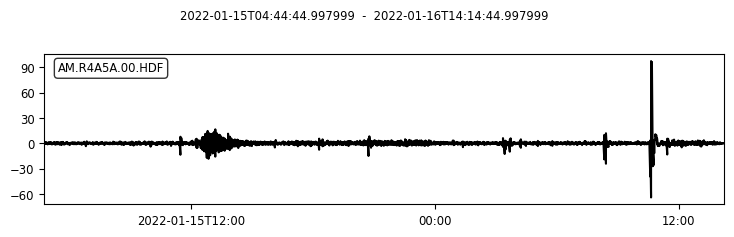

max =  97.5966180496
keep this trace?  (y/n): y


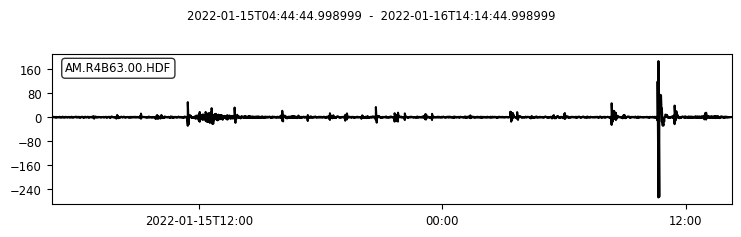

max =  267.022123555
keep this trace?  (y/n): n


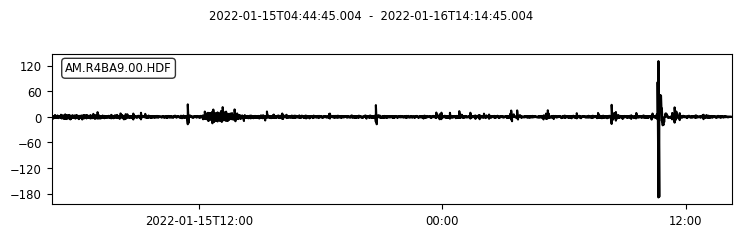

max =  188.64135254
keep this trace?  (y/n): n


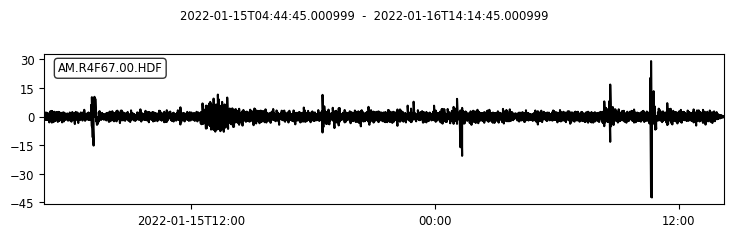

max =  42.4128627484
keep this trace?  (y/n): n


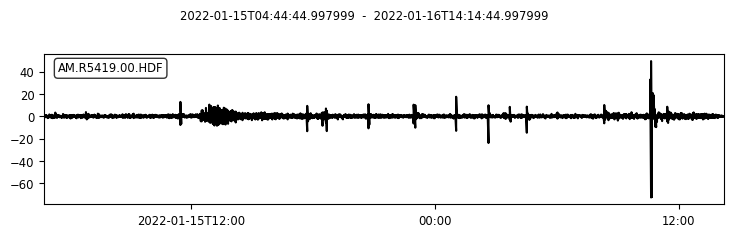

max =  72.9017933726
keep this trace?  (y/n): n


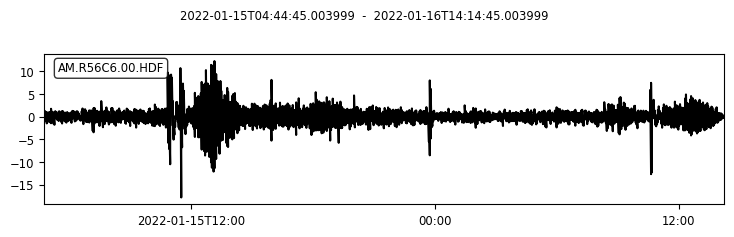

max =  17.8191285416
keep this trace?  (y/n): n


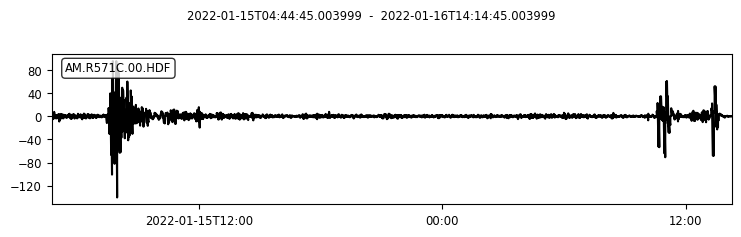

max =  140.285979403
keep this trace?  (y/n): y


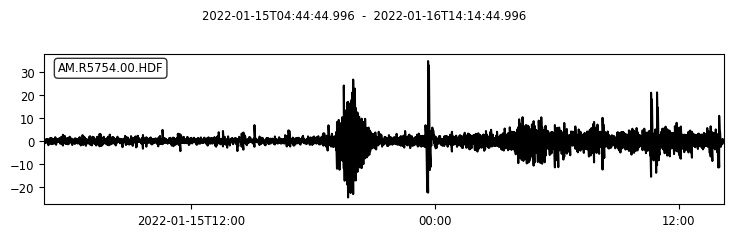

max =  34.7197431233
keep this trace?  (y/n): y


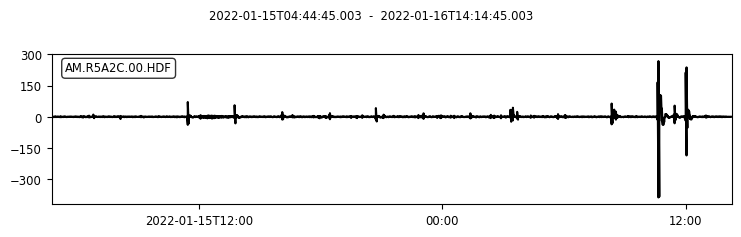

max =  387.752090068
keep this trace?  (y/n): n


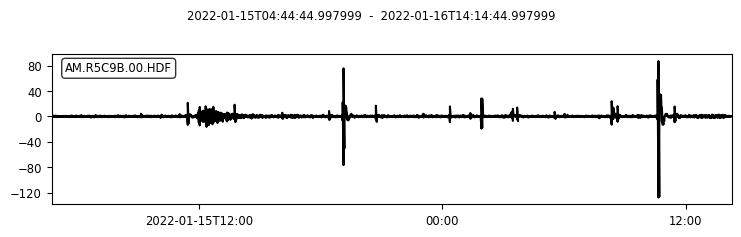

max =  127.715692979
keep this trace?  (y/n): n


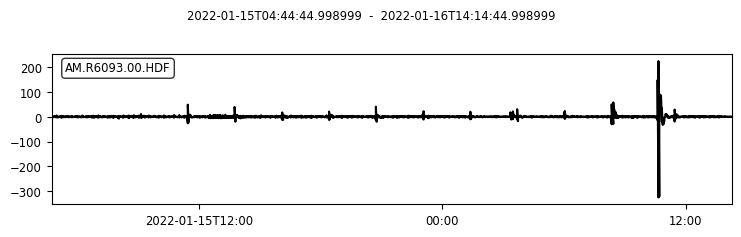

max =  325.741116084
keep this trace?  (y/n): n


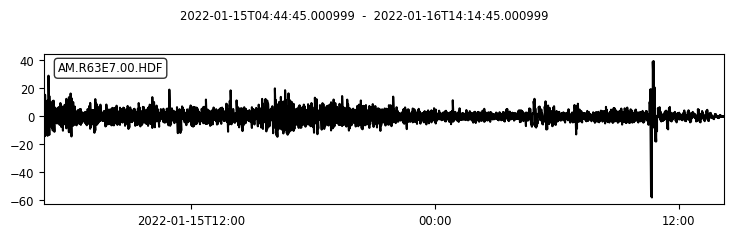

max =  57.8534026112
keep this trace?  (y/n): n


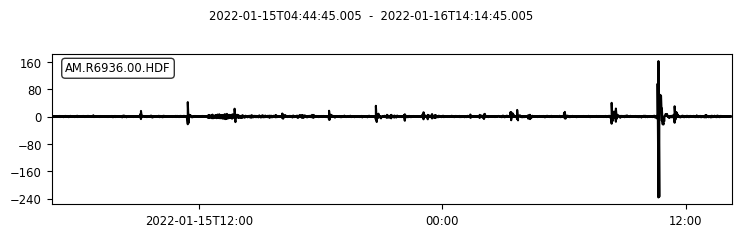

max =  236.938604749
keep this trace?  (y/n): n


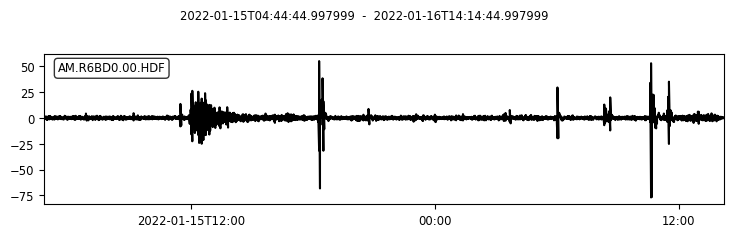

max =  76.9203728935
keep this trace?  (y/n): n


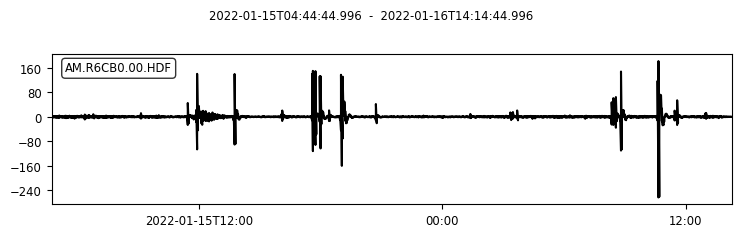

max =  263.410943709
keep this trace?  (y/n): n


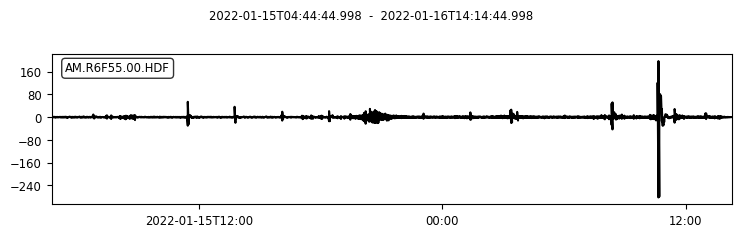

max =  282.672489037
keep this trace?  (y/n): n


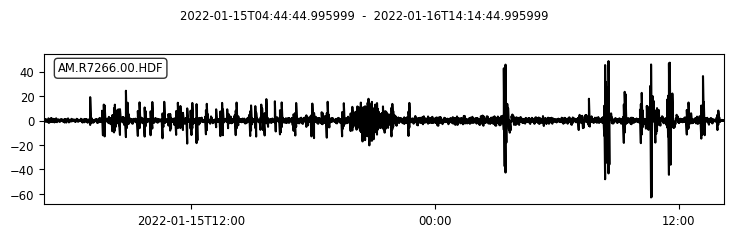

max =  62.8555527581
keep this trace?  (y/n): n


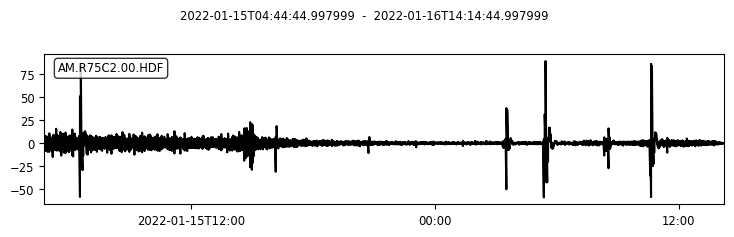

max =  88.7128383278
keep this trace?  (y/n): n


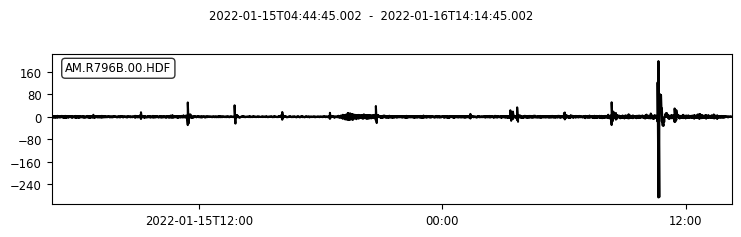

max =  286.937978969
keep this trace?  (y/n): n


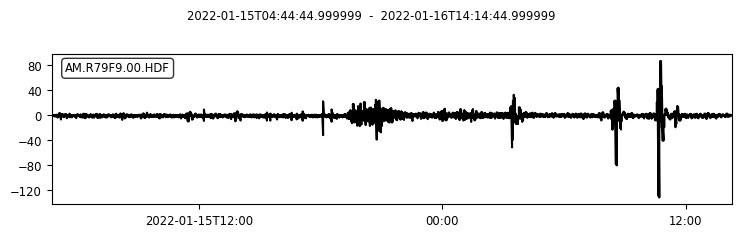

max =  131.165420064
keep this trace?  (y/n): n


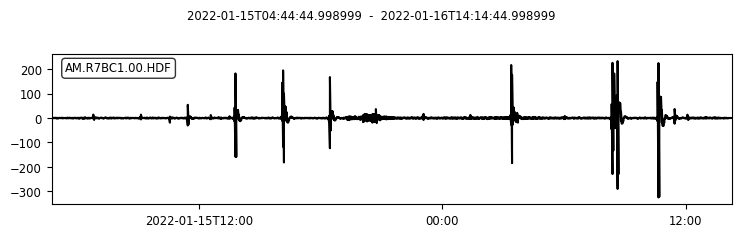

max =  325.234978556
keep this trace?  (y/n): n


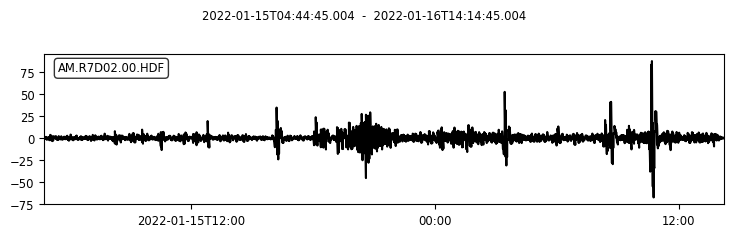

max =  87.2477467976
keep this trace?  (y/n): n


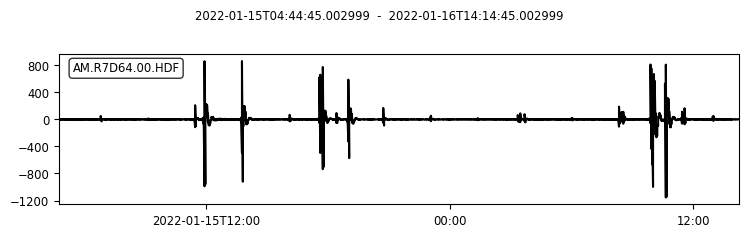

max =  1154.48945881
keep this trace?  (y/n): n


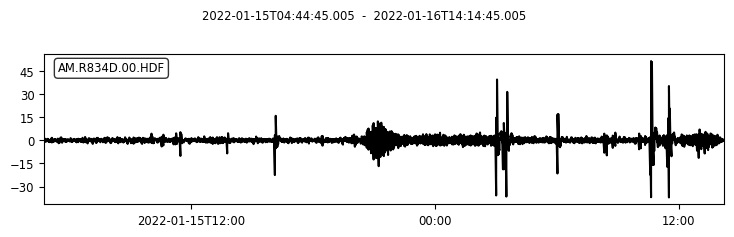

max =  51.4072607305
keep this trace?  (y/n): n


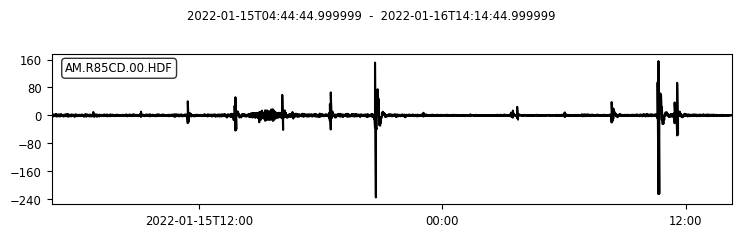

max =  235.392350215
keep this trace?  (y/n): n


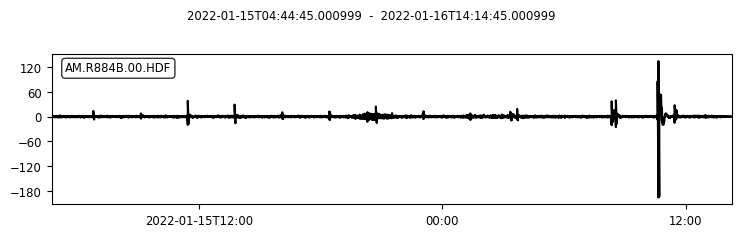

max =  195.954574319
keep this trace?  (y/n): n


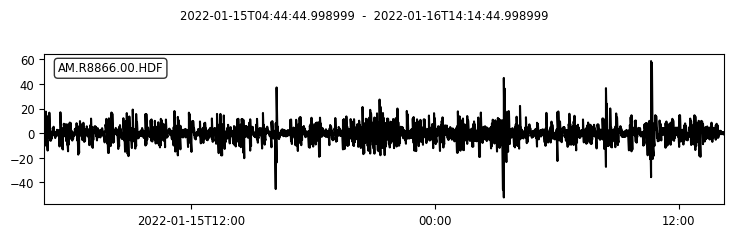

max =  58.6096478018
keep this trace?  (y/n): n


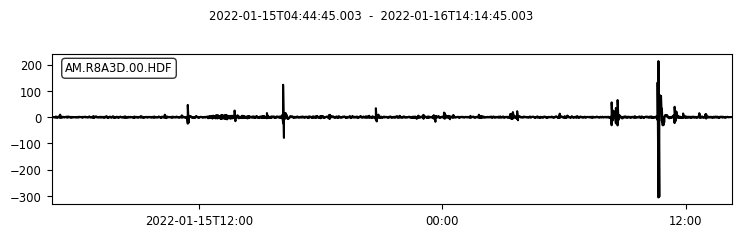

max =  306.296343553
keep this trace?  (y/n): n


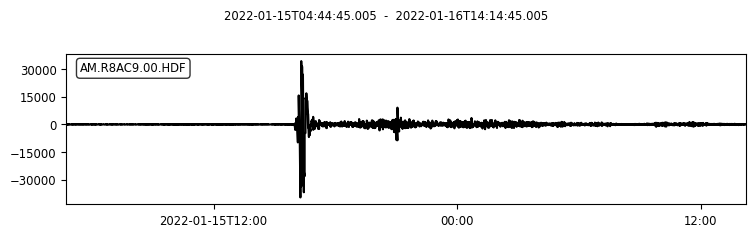

max =  39599.6823134
keep this trace?  (y/n): n


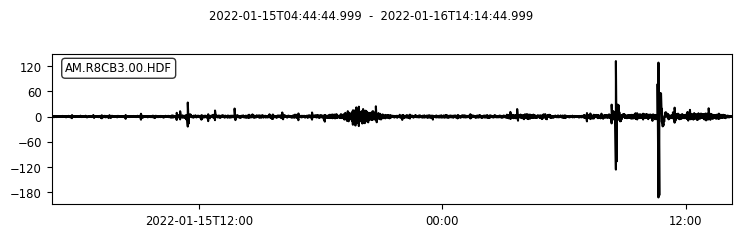

max =  192.605918703
keep this trace?  (y/n): n


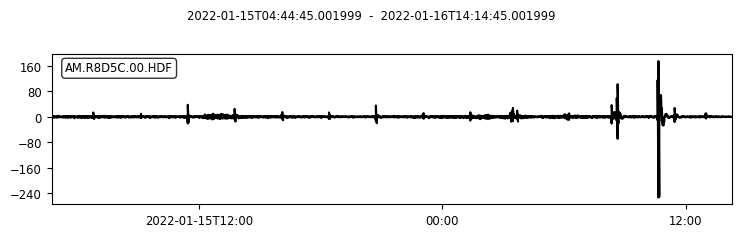

max =  252.778799723
keep this trace?  (y/n): n


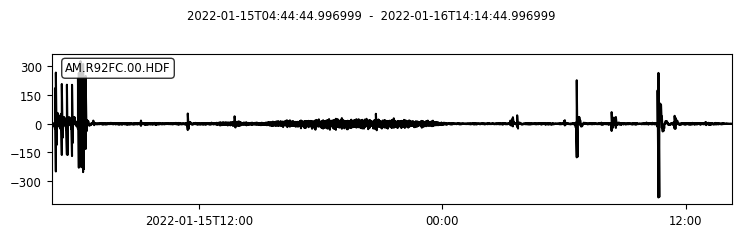

max =  385.457255086
keep this trace?  (y/n): n


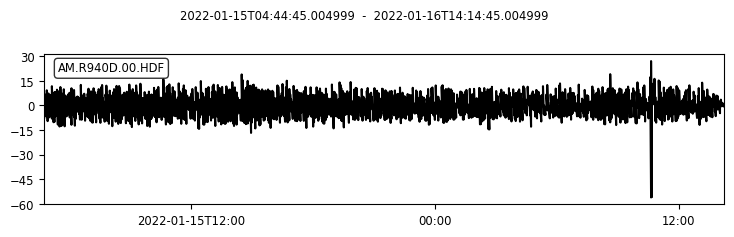

max =  56.05452656
keep this trace?  (y/n): n


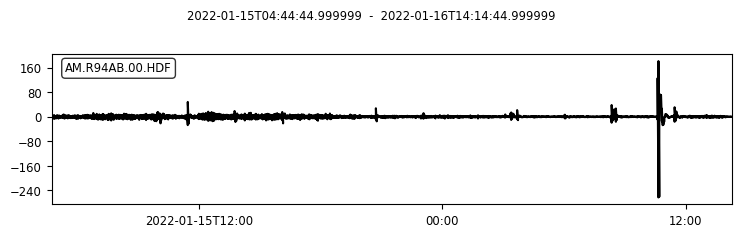

max =  262.966932395
keep this trace?  (y/n): n


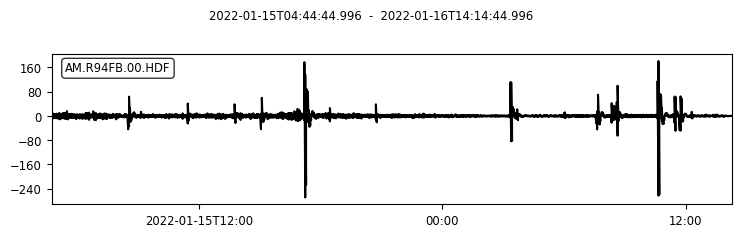

max =  268.745544615
keep this trace?  (y/n): n


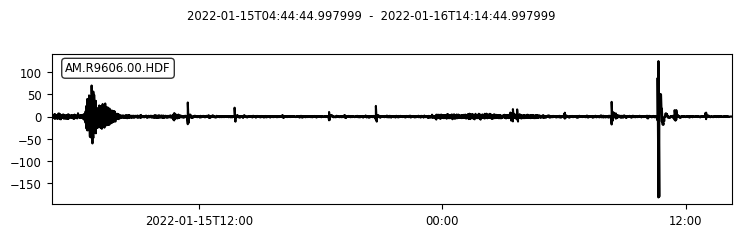

max =  181.894865481
keep this trace?  (y/n): y


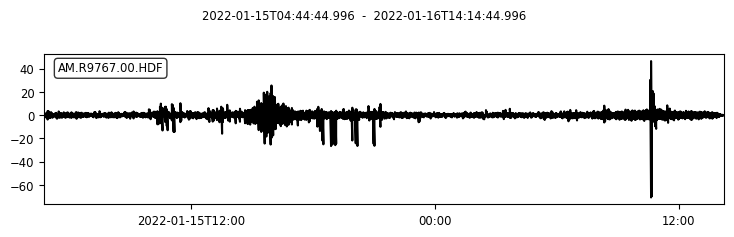

max =  70.7459318678
keep this trace?  (y/n): n


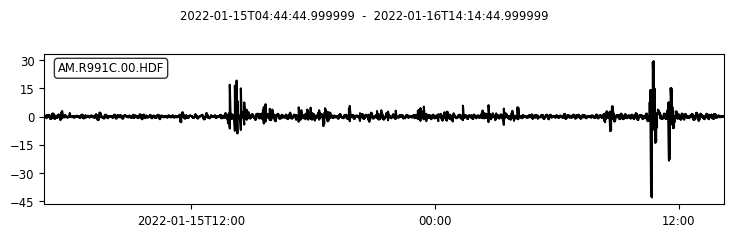

max =  43.0763666207
keep this trace?  (y/n): n


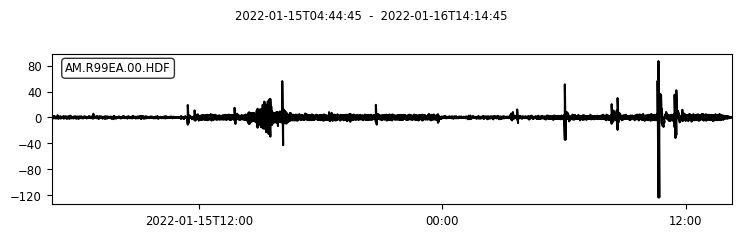

max =  123.899298724
keep this trace?  (y/n): n


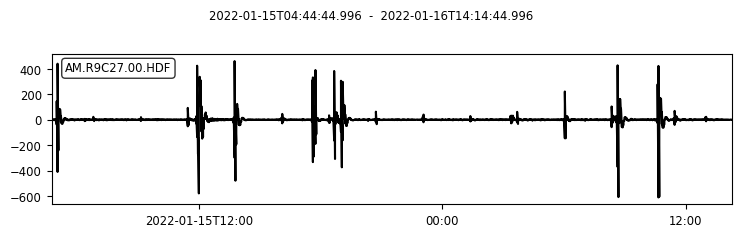

max =  611.339116926
keep this trace?  (y/n): n


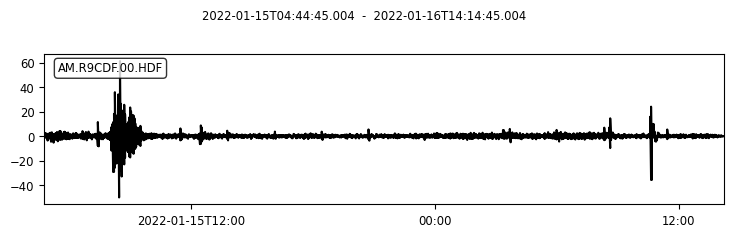

max =  61.2259173285
keep this trace?  (y/n): y


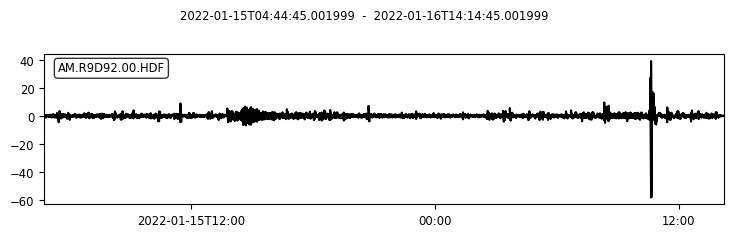

max =  58.2771658505
keep this trace?  (y/n): n


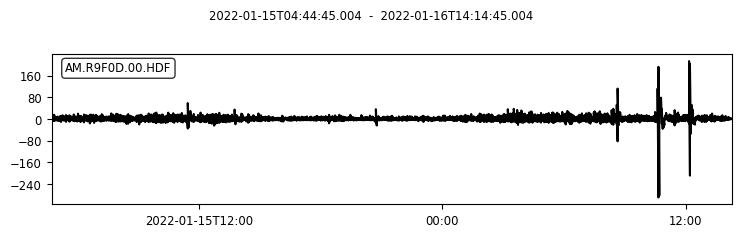

max =  288.891921535
keep this trace?  (y/n): n


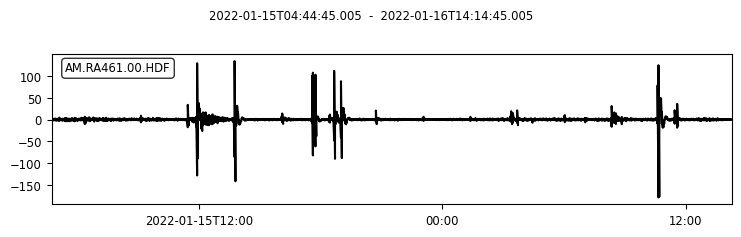

max =  178.954101369
keep this trace?  (y/n): n


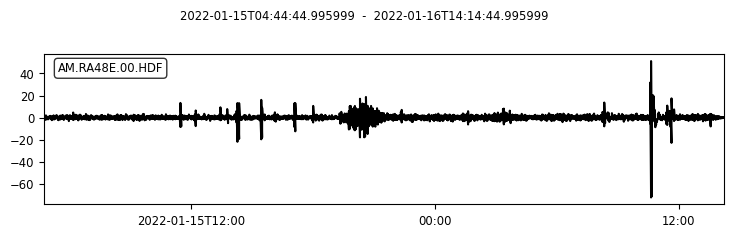

max =  72.5968962031
keep this trace?  (y/n): n


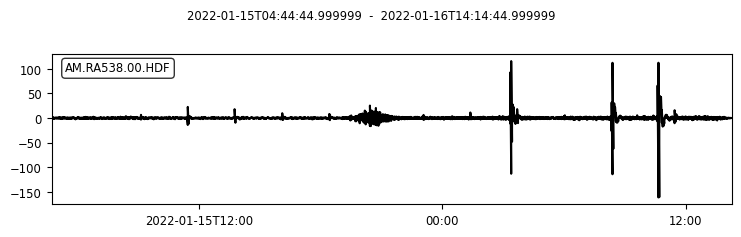

max =  161.190189673
keep this trace?  (y/n): n


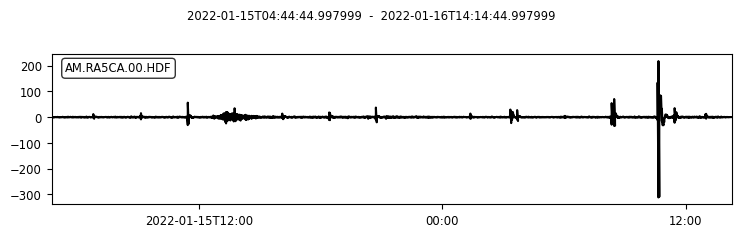

max =  312.491613119
keep this trace?  (y/n): n


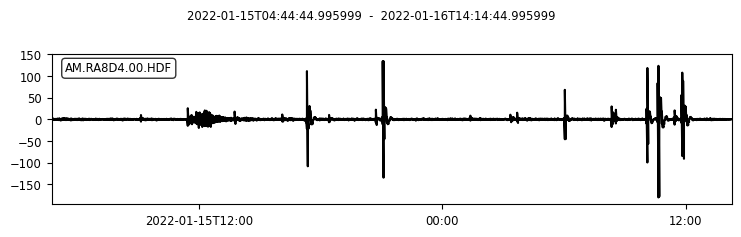

max =  180.406412953
keep this trace?  (y/n): n


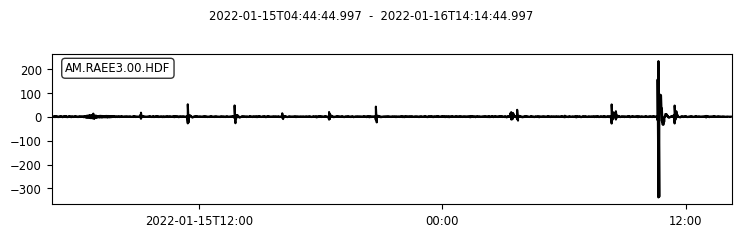

max =  337.652765957
keep this trace?  (y/n): n


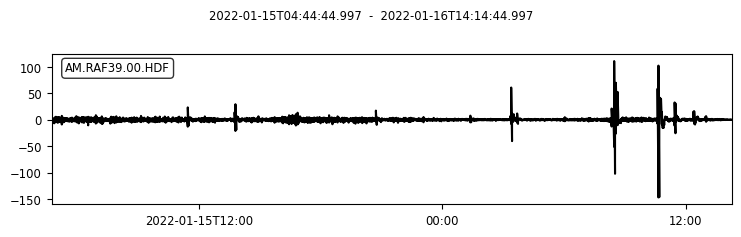

max =  146.977926057
keep this trace?  (y/n): n


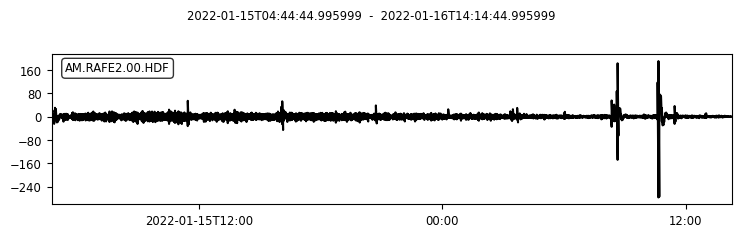

max =  276.910568646
keep this trace?  (y/n): n


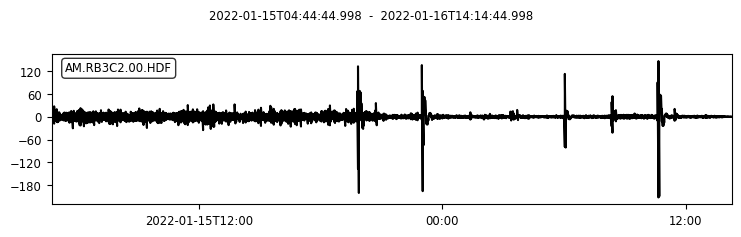

max =  212.707048958
keep this trace?  (y/n): n


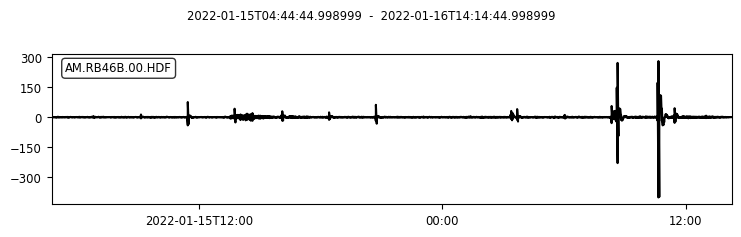

max =  399.421590604
keep this trace?  (y/n): n


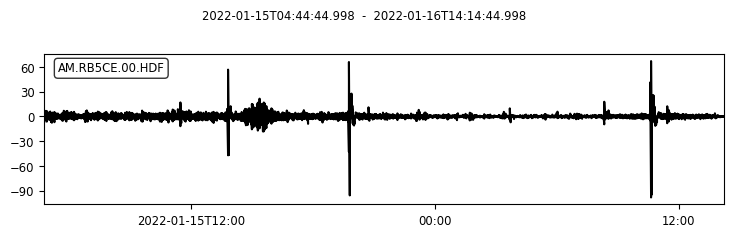

max =  98.3134208036
keep this trace?  (y/n): n


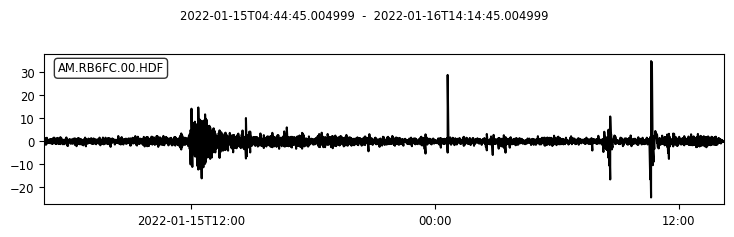

max =  34.9383249654
keep this trace?  (y/n): y


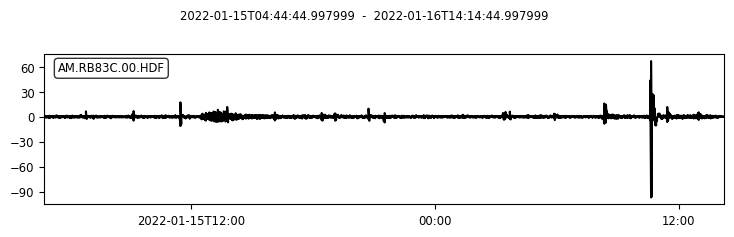

max =  97.0764088963
keep this trace?  (y/n): n


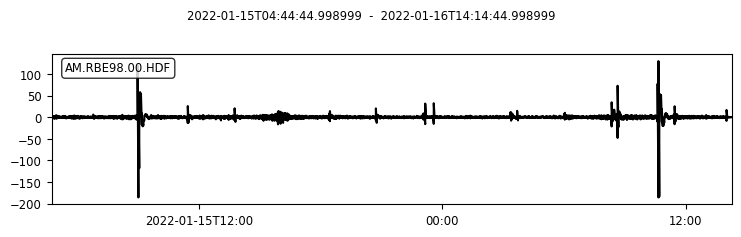

max =  185.496656311
keep this trace?  (y/n): n


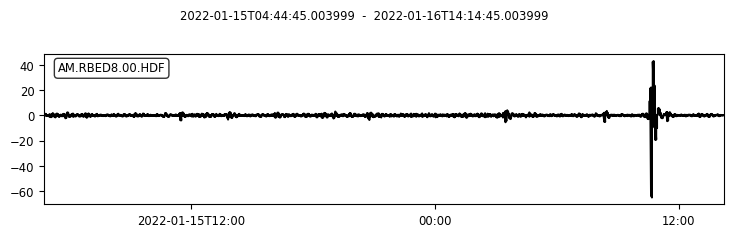

max =  65.0719128906
keep this trace?  (y/n): n


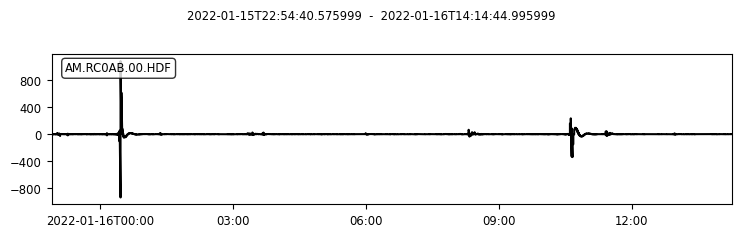

max =  1084.00113776
keep this trace?  (y/n): n


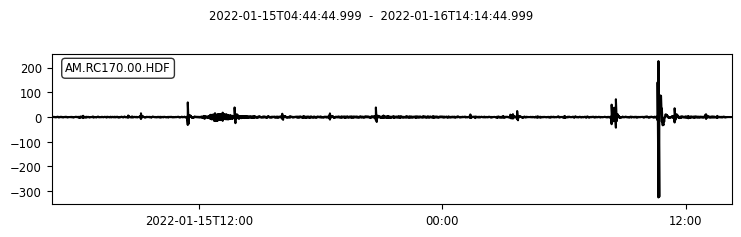

max =  325.26885153
keep this trace?  (y/n): n


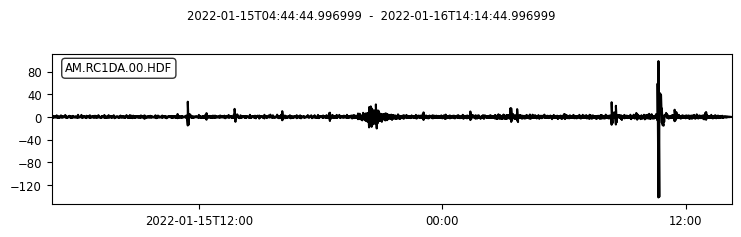

max =  142.276105311
keep this trace?  (y/n): n


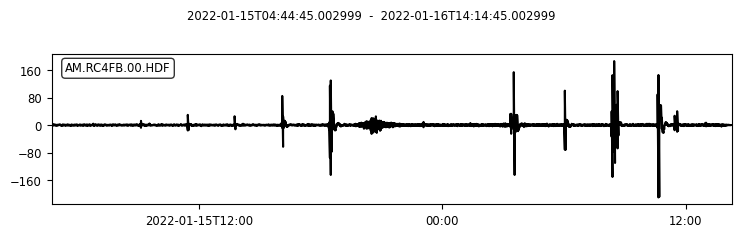

max =  210.148139112
keep this trace?  (y/n): n


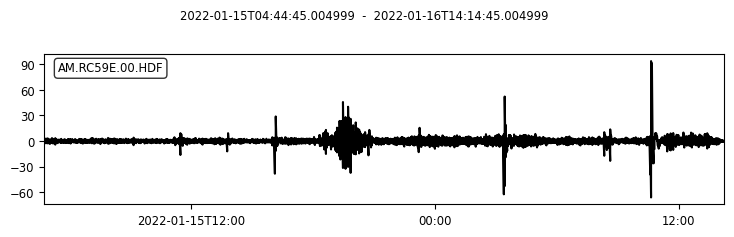

max =  93.6101074942
keep this trace?  (y/n): y


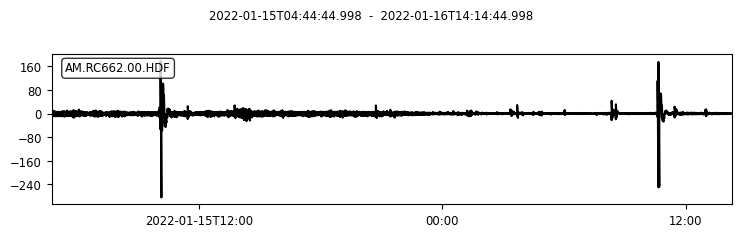

max =  283.879348885
keep this trace?  (y/n): n


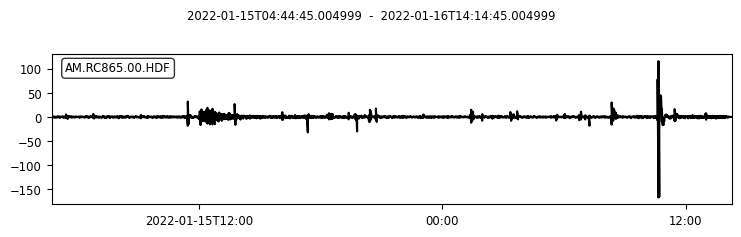

max =  166.875281385
keep this trace?  (y/n): n


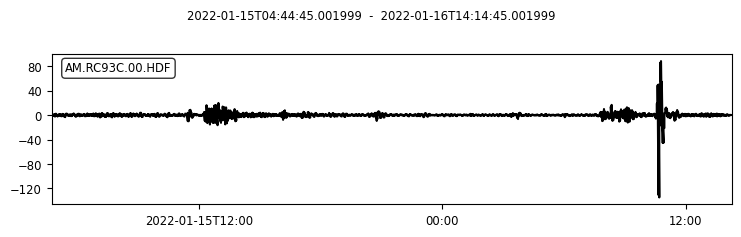

max =  134.928004649
keep this trace?  (y/n): y


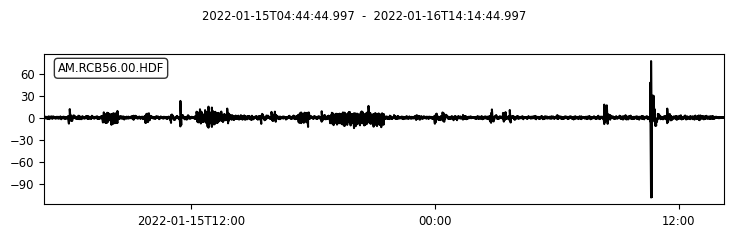

max =  108.844661286
keep this trace?  (y/n): n


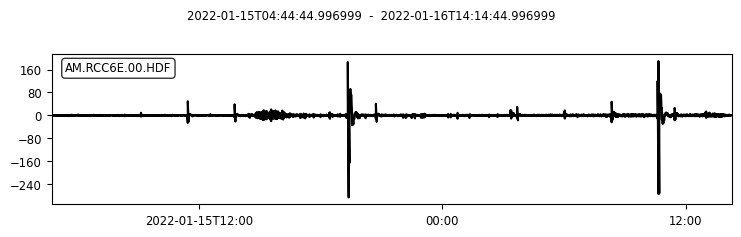

max =  286.477710558
keep this trace?  (y/n): n


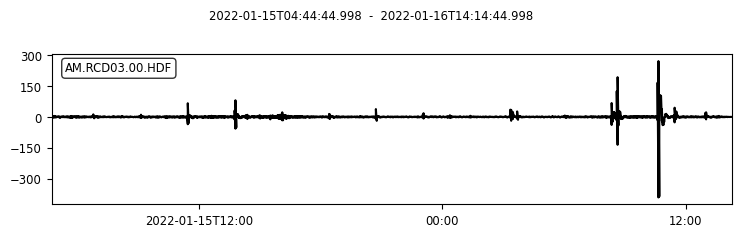

max =  391.741149755
keep this trace?  (y/n): n


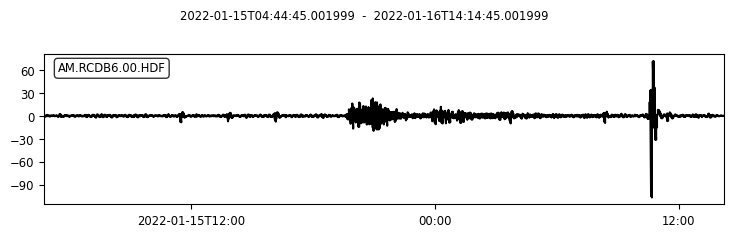

max =  106.858034529
keep this trace?  (y/n): y


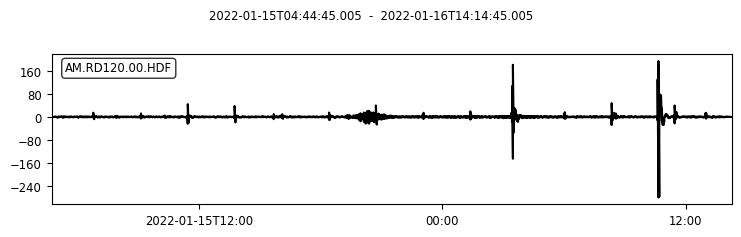

max =  279.352816169
keep this trace?  (y/n): n


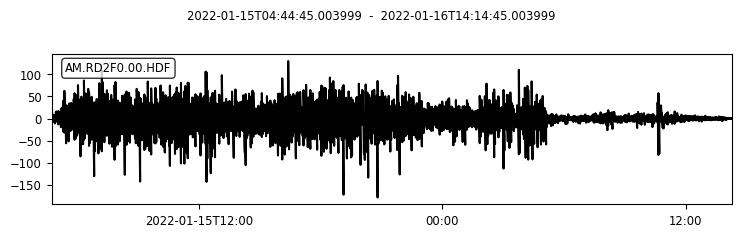

max =  178.975348406
keep this trace?  (y/n): n


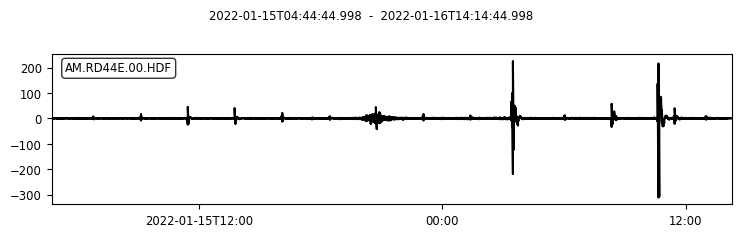

max =  310.752795421
keep this trace?  (y/n): n


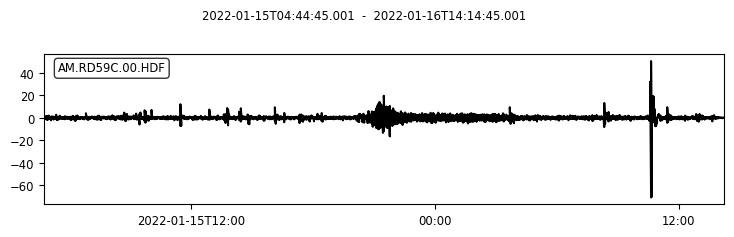

max =  70.7681114837
keep this trace?  (y/n): n


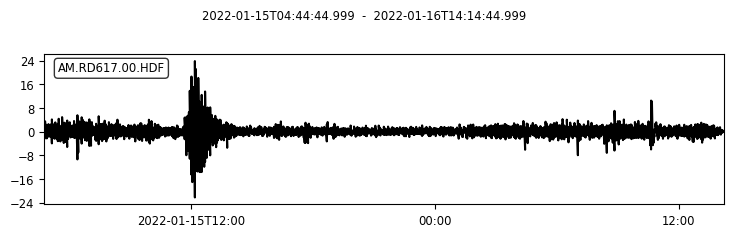

max =  23.8059768198
keep this trace?  (y/n): y


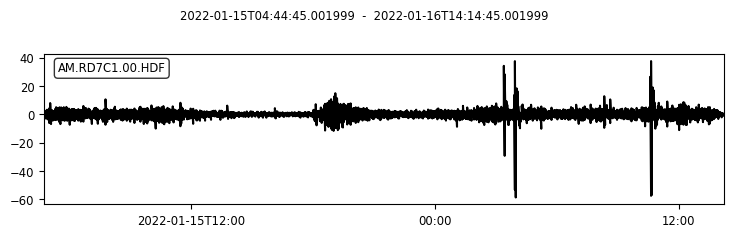

max =  58.723187475
keep this trace?  (y/n): y


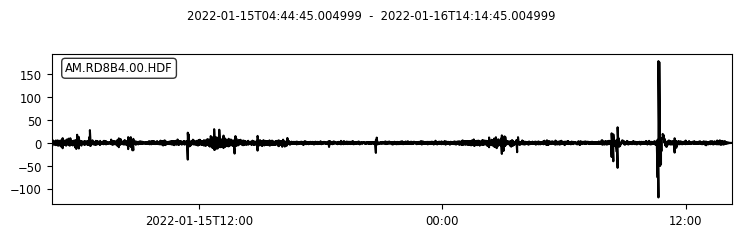

max =  179.275292098
keep this trace?  (y/n): n


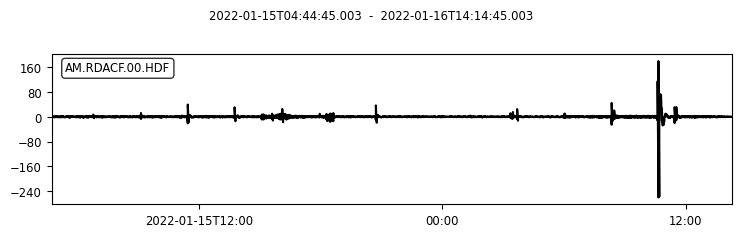

max =  260.162109205
keep this trace?  (y/n): n


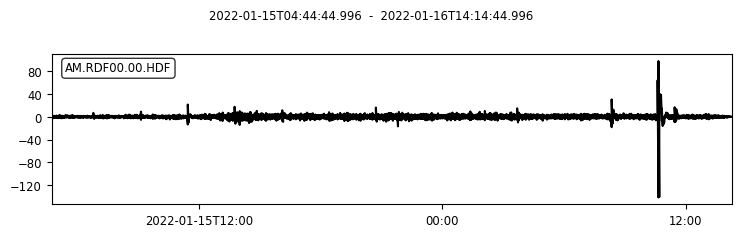

max =  141.682186328
keep this trace?  (y/n): n


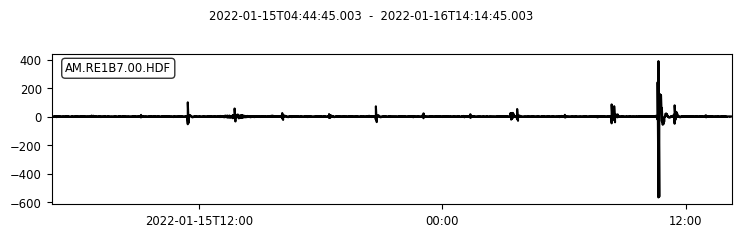

max =  568.104242515
keep this trace?  (y/n): n


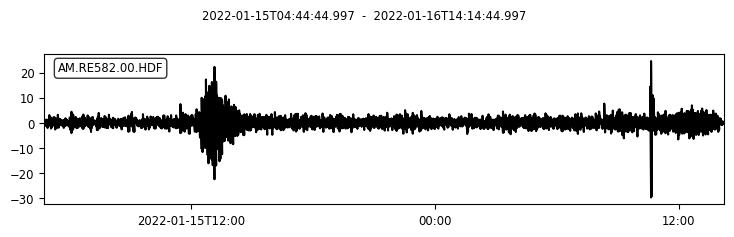

max =  29.7982478787
keep this trace?  (y/n): y


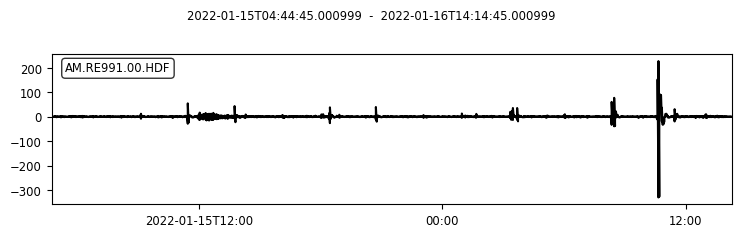

max =  330.783649458
keep this trace?  (y/n): n


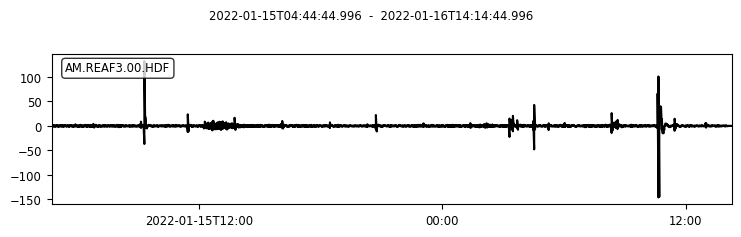

max =  146.237375637
keep this trace?  (y/n): n


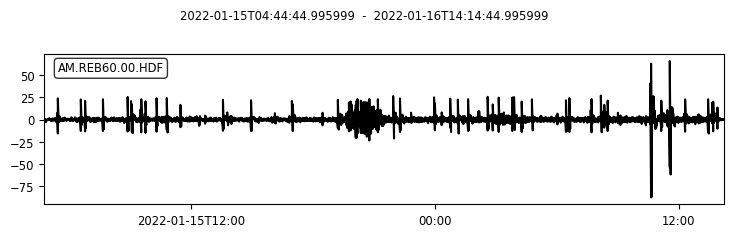

max =  87.7461194168
keep this trace?  (y/n): n


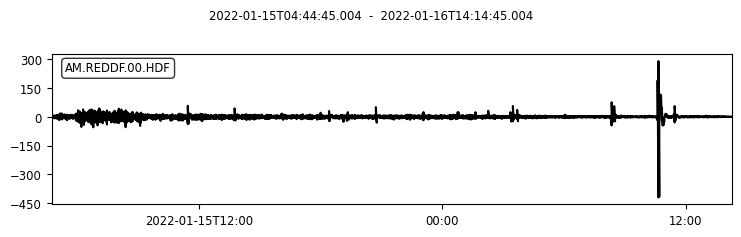

max =  420.040770807
keep this trace?  (y/n): n


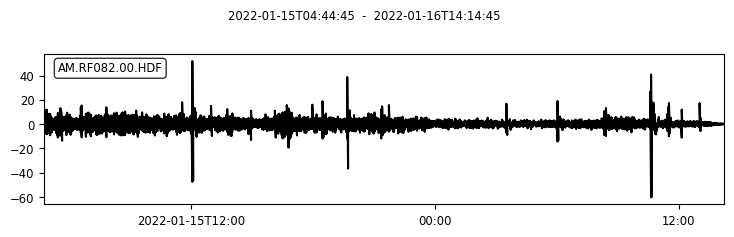

max =  60.5451875061
keep this trace?  (y/n): n


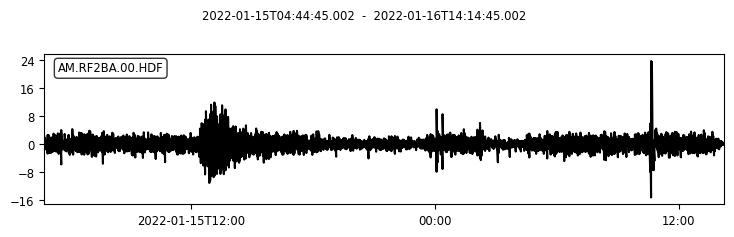

max =  23.726506731
keep this trace?  (y/n): y


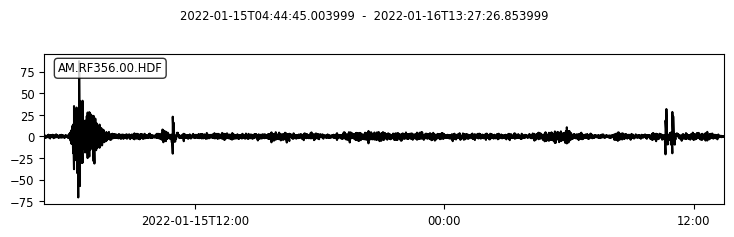

max =  87.1364052966
keep this trace?  (y/n): y


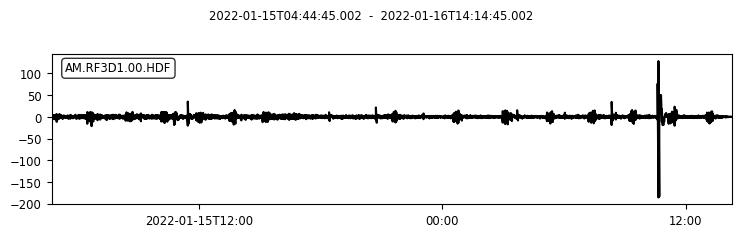

max =  185.816243352
keep this trace?  (y/n): n


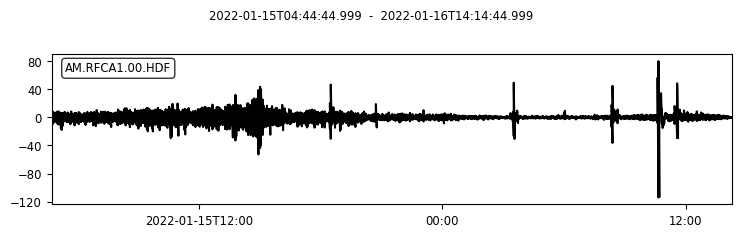

max =  114.010412202
keep this trace?  (y/n): n


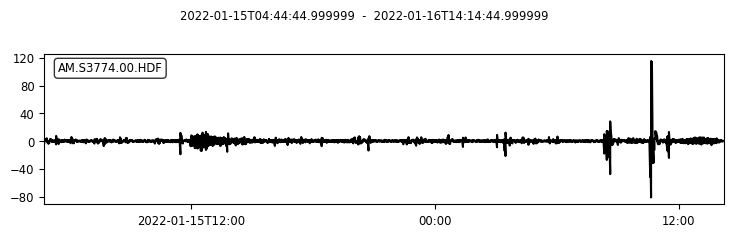

max =  115.185520397
keep this trace?  (y/n): n


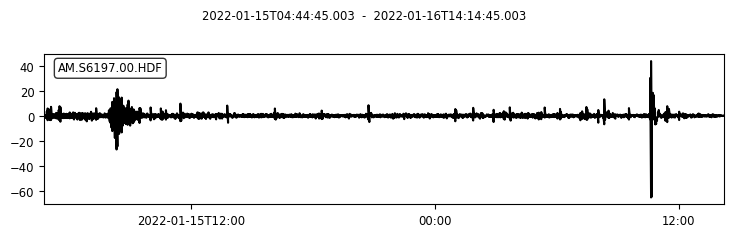

max =  65.2966388938
keep this trace?  (y/n): y


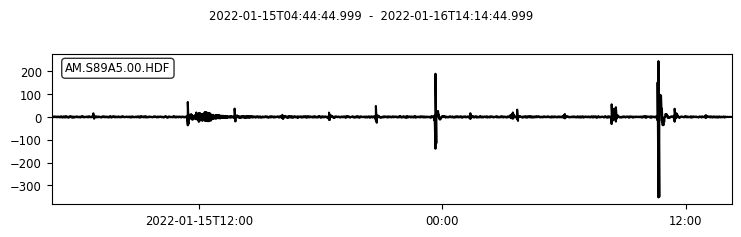

max =  352.970910027
keep this trace?  (y/n): n
['AM.R13D2.00.HDF', 'AM.R2883.00.HDF', 'AM.R2FF1.00.HDF', 'AM.R4649.00.HDF', 'AM.R489A.00.HDF', 'AM.R4A5A.00.HDF', 'AM.R571C.00.HDF', 'AM.R5754.00.HDF', 'AM.R9606.00.HDF', 'AM.R9CDF.00.HDF', 'AM.RB6FC.00.HDF', 'AM.RC59E.00.HDF', 'AM.RC93C.00.HDF', 'AM.RCDB6.00.HDF', 'AM.RD617.00.HDF', 'AM.RD7C1.00.HDF', 'AM.RE582.00.HDF', 'AM.RF2BA.00.HDF', 'AM.RF356.00.HDF', 'AM.S6197.00.HDF']
20


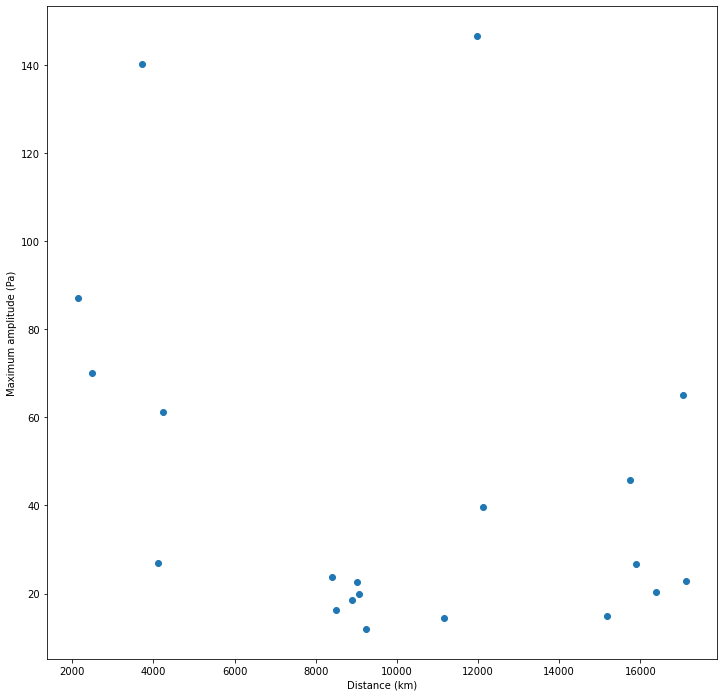

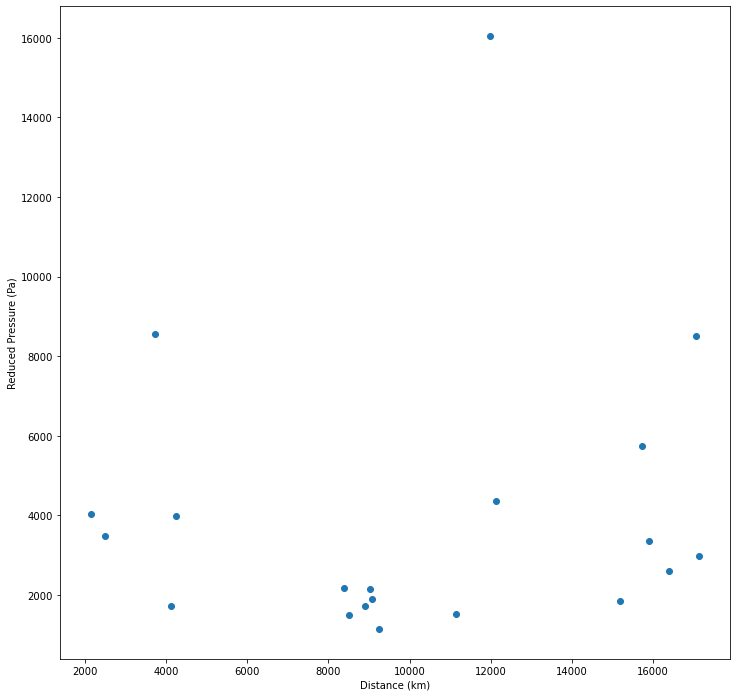

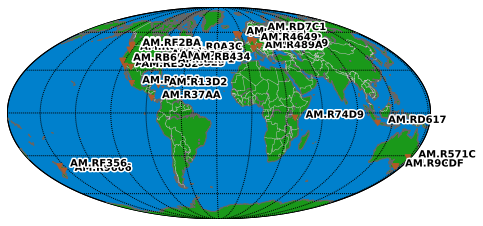

In [39]:
fdsnURL = "http://fdsnws.raspberryshakedata.com"
chanstring = 'HDF'
st_boom, inv_boom = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)

# 6. Combine results in single graph

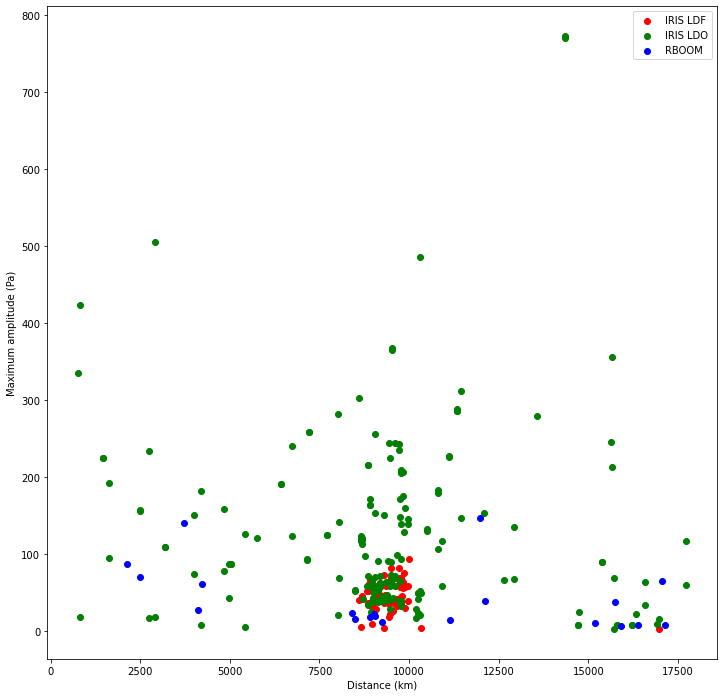

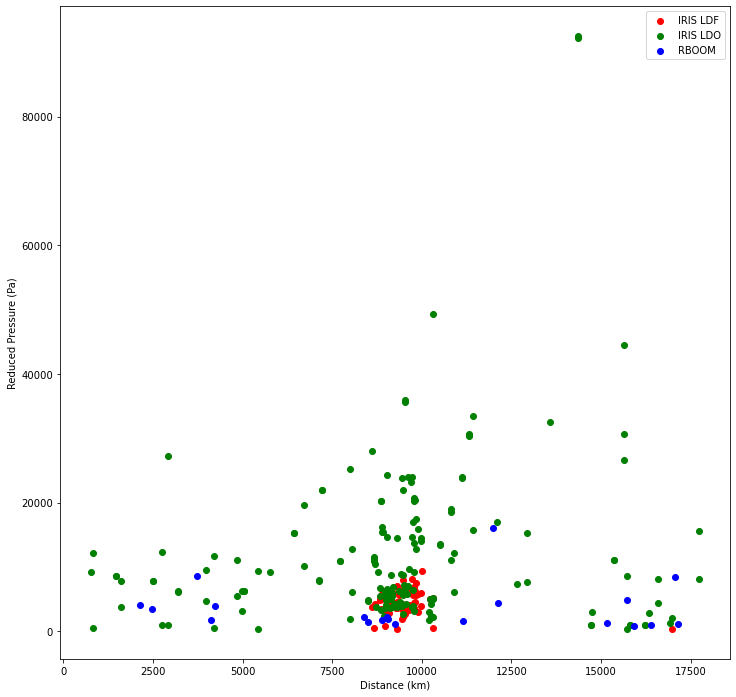

In [147]:
def plot_combined_versus_distance(st_list, inv_list, units, corrected=False):
    fig = plt.figure(figsize=(12,12))
    ax = fig.add_subplot(1,1,1)   
    cols = ['r','g','b']
    labels = ['IRIS LDF', 'IRIS LDO', 'RBOOM']
    for i, st_original in enumerate(st_list):
        st = st_original.copy()
        inv = inv_list[i]
        attach_station_coordinates_from_inventory(inv, st)
        attach_distance_to_stream(st, olat, olon)
        st.trim(starttime=startt+1*60, endtime=startt+18*3600) # just examine first pulse
        r = []
        a = []
        for tr in st:
            r.append(tr.stats.distance_in_km)
            #a.append(tr.stats.maxamp_corrected)
            if corrected:
                a.append(np.max(np.abs(tr.data))* np.sqrt(tr.stats.distance_in_km))
            else:
                a.append(np.max(np.abs(tr.data)))
        remove_outliers(a, f=100)     
        ax.scatter(r, a, c=cols[i], label=labels[i])
    if corrected:
        ax.set_ylabel('Reduced Pressure (%s)' % units)
    else:
        ax.set_ylabel('Maximum amplitude (%s)' % units)
    ax.set_xlabel('Distance (km)')
    ax.legend()
    plt.show()

st_list = [st_ldf, st_ldo, st_boom]
inv_list = [inv_ldf, inv_ldo, inv_boom]
units = 'Pa'
plot_combined_versus_distance(st_list, inv_list, units, corrected=False)
plot_combined_versus_distance(st_list, inv_list, units, corrected=True)

In [47]:
for st in st_list:
    print(len(st))

78
221
20


# Filtered at 10,000 seconds
To do:
- downsample H?? and B?? channels to 1 sample per second
- apply data quality metrics to remove bad channels
- extra steps to remove spikes?
- detect events?
- examine as a function of low-cut frequency
- make maps with pygmt, e.g. with radius contours, or amplitude contours

In [ ]:
fmin=1/10000

fdsnURL = "http://service.iris.edu"
chanstring = 'LDO'
st_ldo2, inv_ldo2 = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)

fdsnURL = "http://service.iris.edu"
chanstring = 'LDF'
st_ldf2, inv_ldf2 = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)

fdsnURL = "http://fdsnws.raspberryshakedata.com"
chanstring = 'HDF'
st_boom2, inv_boom2 = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)

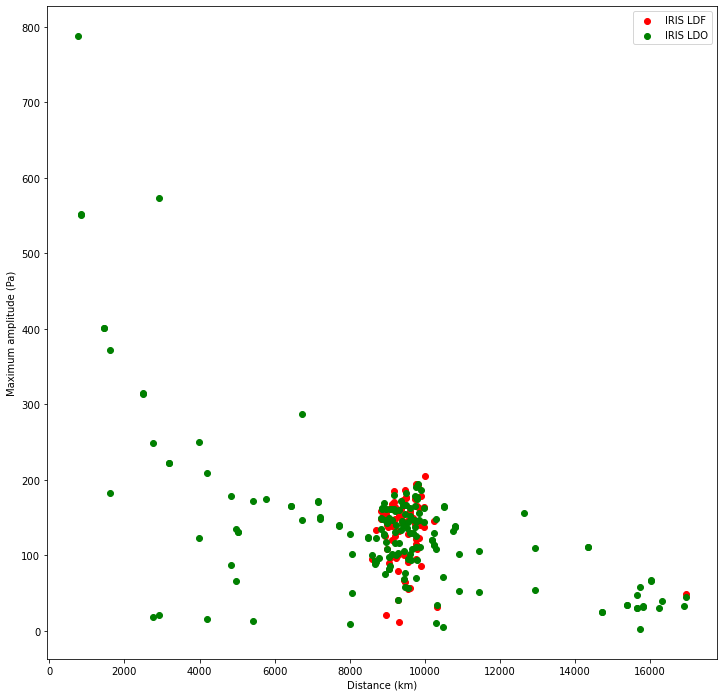

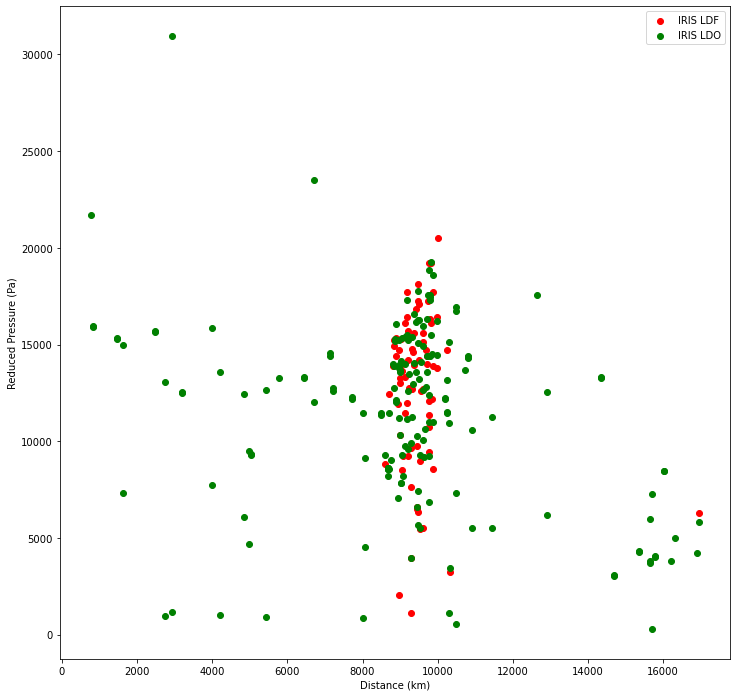

In [153]:
st_list = [st_ldf2, st_ldo2]
inv_list = [inv_ldf2, inv_ldo2]
units = 'Pa'
plot_combined_versus_distance(st_list, inv_list, units, corrected=False)
plot_combined_versus_distance(st_list, inv_list, units, corrected=True)

In [ ]:
# plot traces by distance - record section?
st = obspy.core.Stream()
for tr in st_ldo2:
    tr.stats['distance']=tr.stats.distance_in_km*1000.0
    tr.data=tr.data*10
    st.append(tr)
for tr in st_ldf2:
    tr.stats['distance']=tr.stats.distance_in_km*1000.0
    tr.data=tr.data*10
    st.append(tr)  
    

In [170]:
sectionpng = os.path.join(DATA_ROOT,'section.png')
st.plot(type='section',title='',dpi=75,scale=15.0,reftime=otime,norm_method='stream',fillcolors=['r','b'],outfile=sectionpng)

In [172]:
print(len(st_ldo2),len(st_ldf2),len(st))

179 78 257


# Investigate filter bandwidth needed to see signal fully

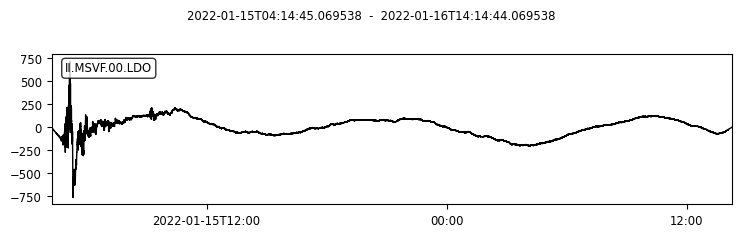

In [111]:
st = obspy.core.read(os.path.join(DATA_ROOT, 'iris_LDO_within_180_degrees.mseed'))
#st.select(station='MSVF').plot()
inv = obspy.read_inventory(os.path.join(DATA_ROOT, 'iris_LDO_within_180_degrees.xml'))
msvf = st.select(station='MSVF')
msvf2=msvf.copy()
msvf2.remove_response(inventory=inv)
msvf2.plot()
tr = msvf2[0]

[  4.41602443e-05   5.29922932e-05   6.35907518e-05   7.63089022e-05
   9.15706826e-05   1.09884819e-04   1.31861783e-04   1.58234140e-04
   1.89880967e-04   2.27857161e-04   2.73428593e-04   3.28114312e-04
   3.93737174e-04   4.72484609e-04   5.66981531e-04   6.80377837e-04
   8.16453404e-04   9.79744085e-04   1.17569290e-03   1.41083148e-03
   1.69299778e-03   2.03159733e-03   2.43791680e-03   2.92550016e-03
   3.51060019e-03   4.21272023e-03   5.05526428e-03   6.06631714e-03
   7.27958056e-03   8.73549668e-03   1.04825960e-02   1.25791152e-02
   1.50949383e-02   1.81139259e-02   2.17367111e-02   2.60840533e-02
   3.13008640e-02   3.75610368e-02   4.50732441e-02   5.40878929e-02
   6.49054715e-02   7.78865658e-02   9.34638790e-02   1.12156655e-01
   1.34587986e-01   1.61505583e-01   1.93806699e-01   2.32568039e-01
   2.79081647e-01   3.34897977e-01   4.01877572e-01   4.82253086e-01]


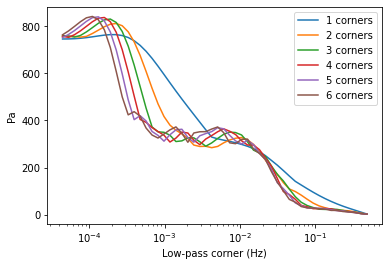

In [93]:
f = np.power(1.2,np.arange(-55,-1))
f = f[f<0.5]
plt.figure()
print(f)
for ncorners in range(6):
    a = []
    for fmin in f:
        tr2 = tr.copy()
        if fmin>0.0:
            #print(fmin)
            tr2.filter('highpass',freq=fmin,corners=ncorners+1)
        a.append(np.max(np.abs(tr2.data)))
    labstr = "%d corners" % (ncorners+1)
    plt.semilogx(f,a,label=labstr)
plt.ylabel('Pa')
plt.xlabel('Low-pass corner (Hz)')
plt.legend()
plt.show()



[  1.31861783e-04   1.58234140e-04   1.89880967e-04   2.27857161e-04
   2.73428593e-04   3.28114312e-04   3.93737174e-04   4.72484609e-04
   5.66981531e-04   6.80377837e-04   8.16453404e-04   9.79744085e-04
   1.17569290e-03   1.41083148e-03   1.69299778e-03   2.03159733e-03
   2.43791680e-03   2.92550016e-03   3.51060019e-03   4.21272023e-03
   5.05526428e-03   6.06631714e-03   7.27958056e-03   8.73549668e-03
   1.04825960e-02   1.25791152e-02   1.50949383e-02   1.81139259e-02
   2.17367111e-02   2.60840533e-02   3.13008640e-02   3.75610368e-02
   4.50732441e-02   5.40878929e-02   6.49054715e-02   7.78865658e-02
   9.34638790e-02   1.12156655e-01   1.34587986e-01   1.61505583e-01
   1.93806699e-01   2.32568039e-01   2.79081647e-01   3.34897977e-01
   4.01877572e-01   4.82253086e-01   1.00000000e+00]
6.103515625e-05


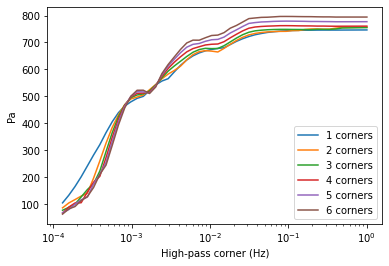

In [99]:
fmin = np.power(2.0,-14)
#f = np.power(2.0,np.arange(-13,-1))
f = np.power(1.2,np.arange(-55,-1))
f = f[f<=0.5]
f = f[f>fmin*2]
f = np.append(f,1.0)
print(f)
print(fmin)

plt.figure()
for ncorners in range(6):
    a = []
    for fmax in f:
        tr2 = tr.copy()
        if fmax<1.0:
            #print(fmin)
            tr2.filter('bandpass',freqmin=fmin, freqmax=fmax,corners=ncorners+1)
            
        else:
            tr2.filter('highpass',freq=fmin, corners=ncorners+1)
        a.append(np.max(np.abs(tr2.data)))
    labstr = "%d corners" % (ncorners+1)
    plt.semilogx(f,a,label=labstr)
plt.ylabel('Pa')
plt.xlabel('High-pass corner (Hz)')
plt.legend()
plt.show()

II.MSVF.00.LDO | 2022-01-15T04:14:45.069538Z - 2022-01-16T14:14:44.069538Z | 1.0 Hz, 122400 samples

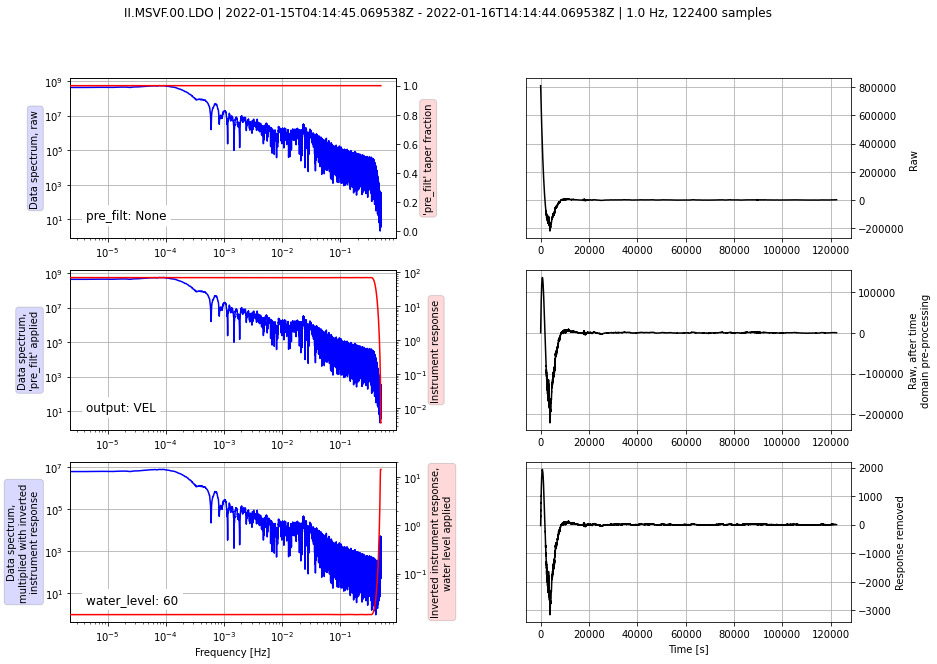

In [121]:
tr2=msvf[0].copy()
pre_filt = [0.0001, 0.0002, 0.5, 0.1]
tr2.filter('bandpass', freqmin=0.0001, freqmax=0.5, corners=2)
tr2.remove_response(inventory=inv, plot=True, water_level=60)
#tr2.plot()

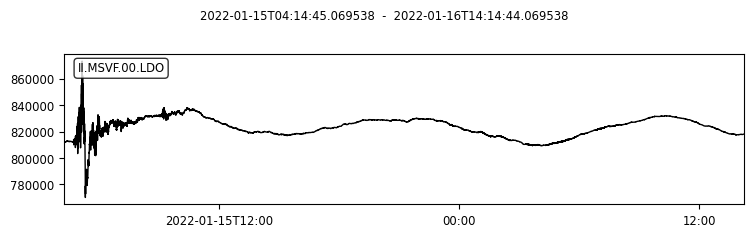

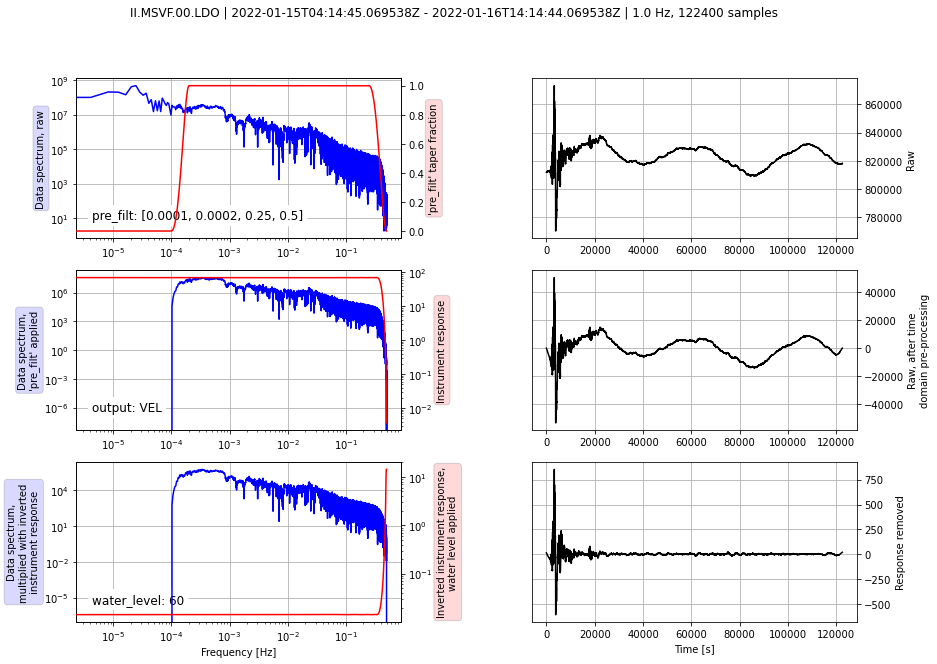

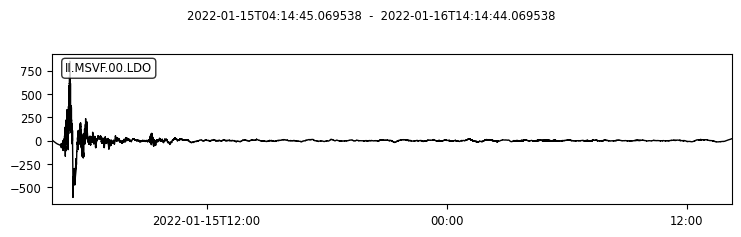

In [124]:
tr2=msvf[0].copy()
tr2.plot()
pre_filt = [0.0001, 0.0002, 0.25, 0.5]
#tr2.filter('pass', freq=0.0001, corners=2)
tr2.remove_response(inventory=inv, pre_filt=pre_filt, plot=True, water_level=60)
tr2.plot();

In [ ]:
mseedfile = os.path.join(DATA_ROOT, 'rboom_HDF_within_180_degrees.mseed')
inv = obspy.read_inventory(os.path.join(DATA_ROOT, 'rboom_HDF_within_180_degrees.xml'))
pre_filt = [0.0001, 0.0002, 0.25, 0.5]
N = 1000
count = 0
f = open(os.path.join(DATA_ROOT, 'rboom_good_HDF_ids_within_180_degrees.pkl'), "rb")
good_ids = pickle.load(f)
f.close()
good_st = obspy.core.Stream()
more_good = ['S89A5', 'R160F', 'RC93C', 'RA8D4', 'R9606', 'R40C1', 'R3A8A', 'R571C', 'R9CDF', 'RB83C', 'R0033']
for sta in more_good:
    good_ids.append('AM.%s.00.HDF' % sta)
import obspy
import io

reclen = 512
chunksize = 100000 * reclen # Around 50 MB

with io.open(mseedfile, "rb") as fh:
    while count<N:
        with io.BytesIO() as buf:
            c = fh.read(chunksize)
            if not c:
                break
            buf.write(c)
            buf.seek(0, 0)
            st = obspy.read(buf)
            count+=1
        # Do something useful!
        st.merge()
        for tr in st:
            if tr.id in good_ids:
                good_st.append(tr)
        #st.remove_response(inventory=inv, pre_filt=pre_filt, plot=True, water_level=60) 

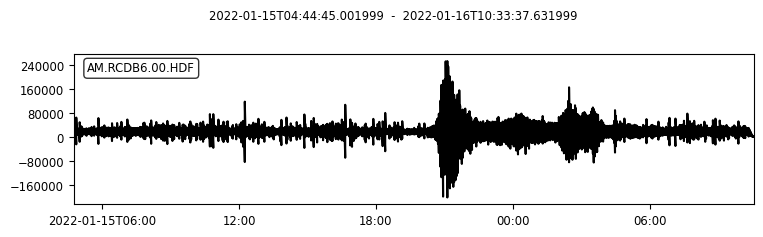

max =  252792.0
keep this trace?  (y/n): y


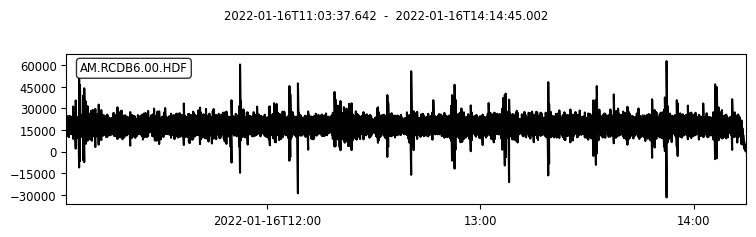

max =  62885.0
keep this trace?  (y/n): n


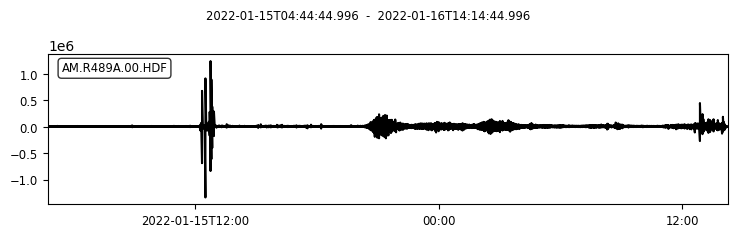

max =  1335520.0
keep this trace?  (y/n): n


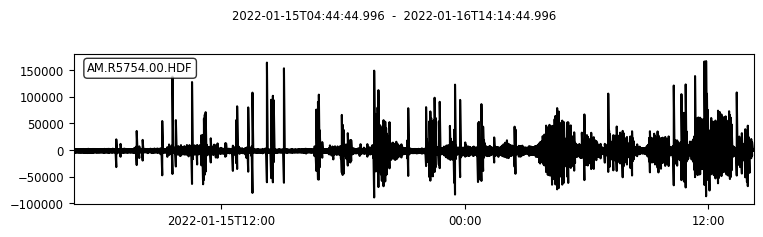

max =  166647.0
keep this trace?  (y/n): n


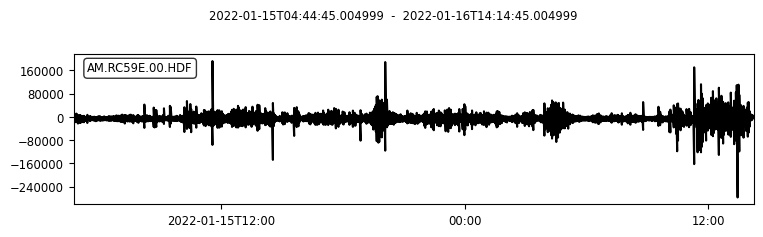

max =  276984.0
keep this trace?  (y/n): n


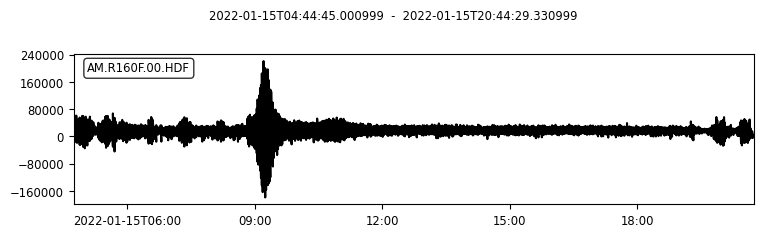

max =  221184.0
keep this trace?  (y/n): y


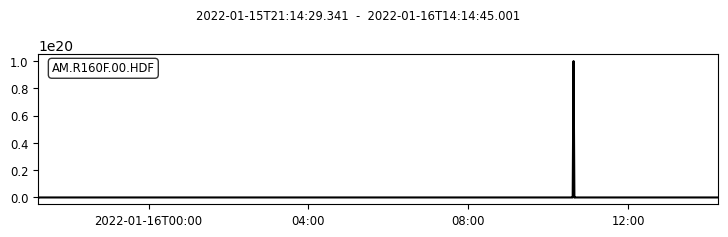

max =  79319.0
keep this trace?  (y/n): n


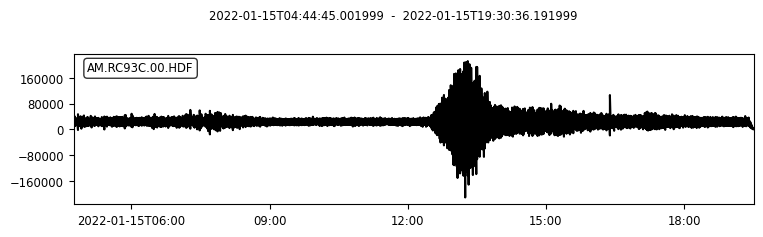

max =  212079.0
keep this trace?  (y/n): y


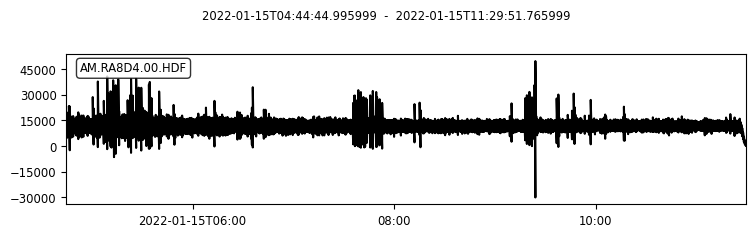

max =  49722.0
keep this trace?  (y/n): n


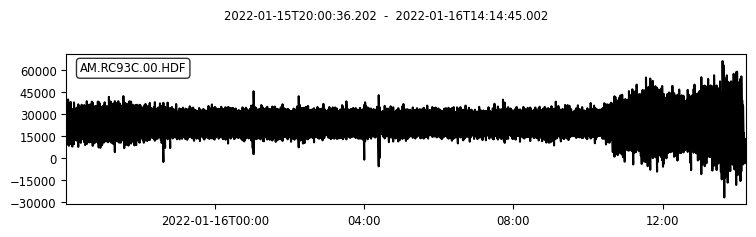

max =  65968.0
keep this trace?  (y/n): n


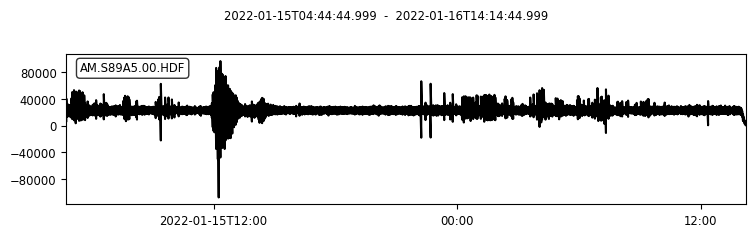

max =  107083.0
keep this trace?  (y/n): y


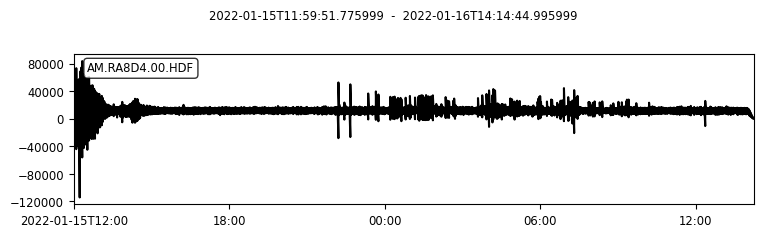

max =  114342.0
keep this trace?  (y/n): y


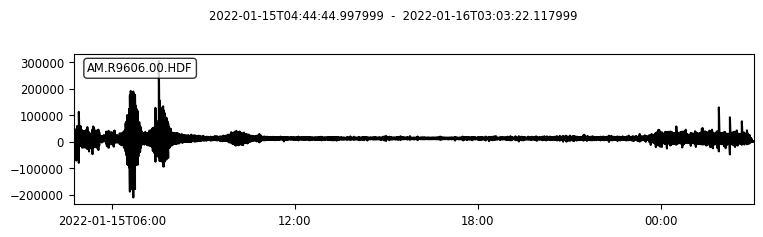

max =  304356.0
keep this trace?  (y/n): y


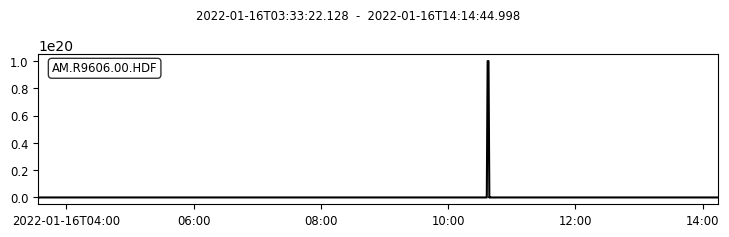

max =  147020.0
keep this trace?  (y/n): n


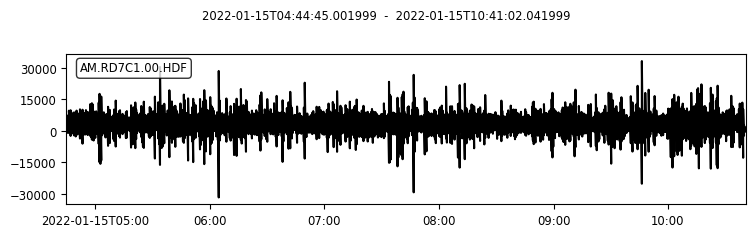

max =  33267.0
keep this trace?  (y/n): n


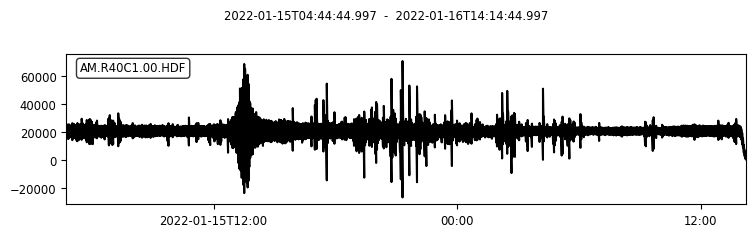

max =  70742.0
keep this trace?  (y/n): y


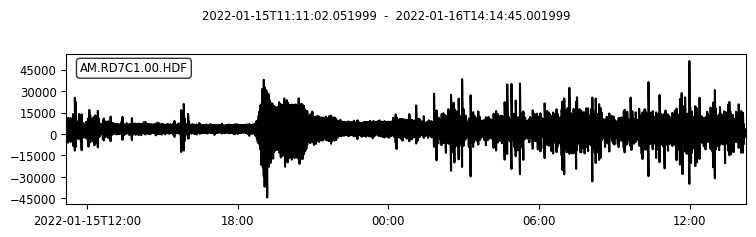

max =  50966.0
keep this trace?  (y/n): y


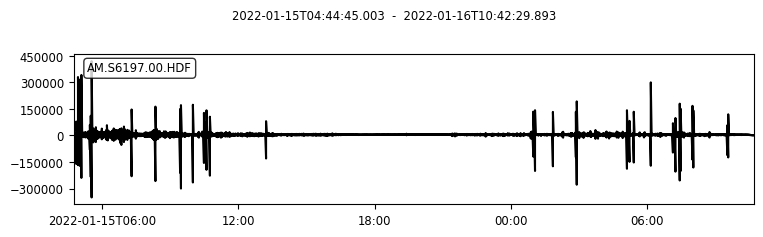

max =  420279.0
keep this trace?  (y/n): n


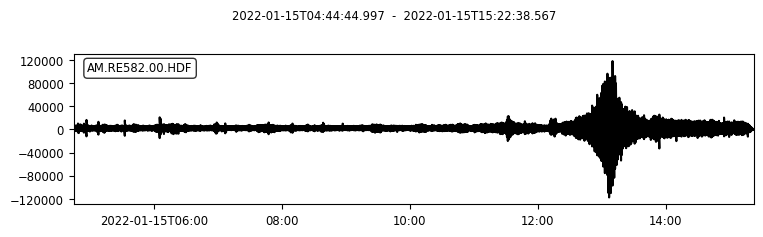

max =  118191.0
keep this trace?  (y/n): y


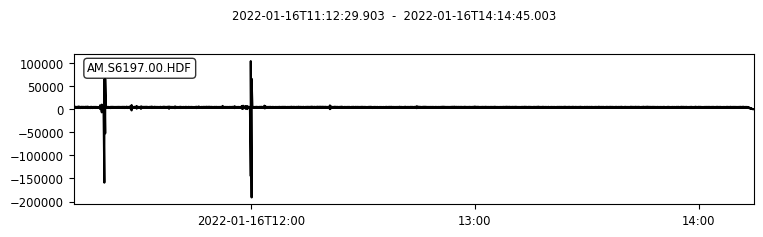

max =  191115.0
keep this trace?  (y/n): n


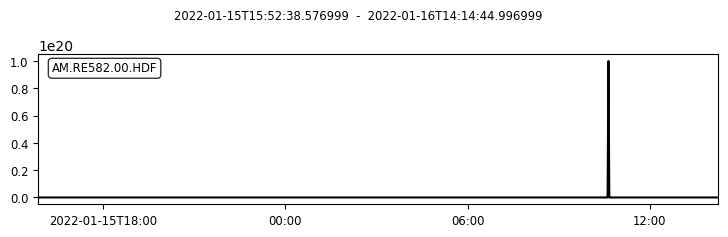

max =  40202.0
keep this trace?  (y/n): n


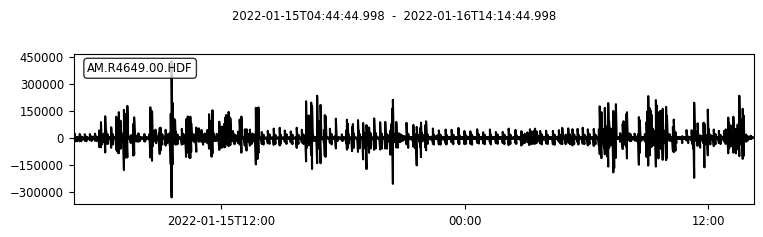

max =  425652.0
keep this trace?  (y/n): n


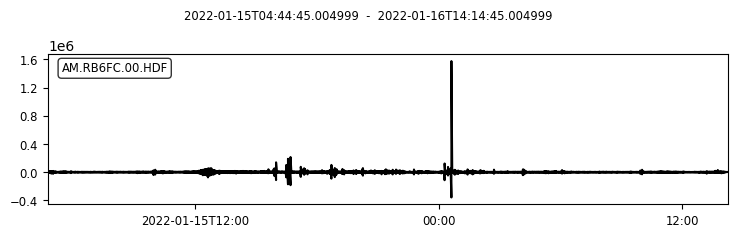

max =  1577293.0
keep this trace?  (y/n): n


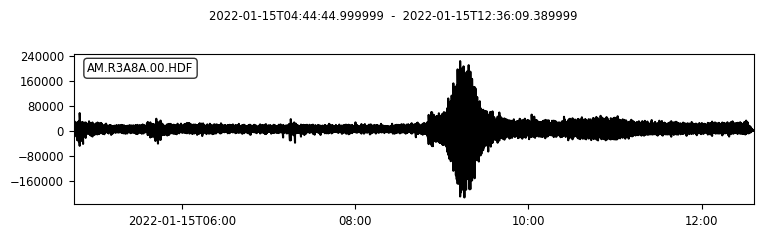

max =  222461.0
keep this trace?  (y/n): y


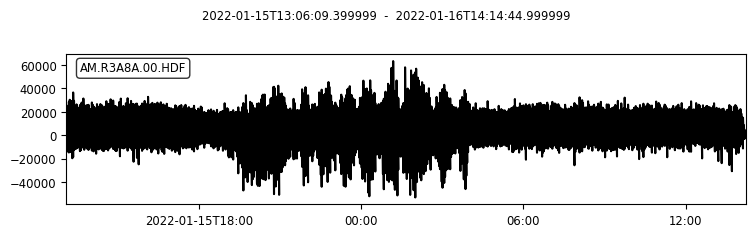

max =  63418.0
keep this trace?  (y/n): n


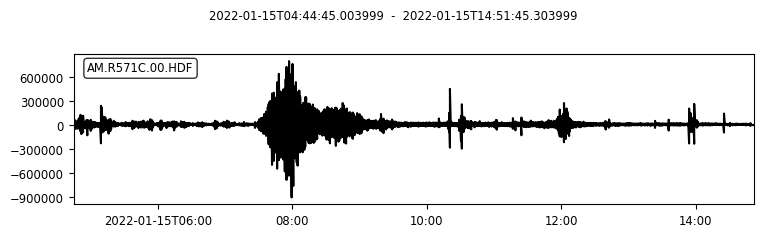

max =  908512.0
keep this trace?  (y/n): y


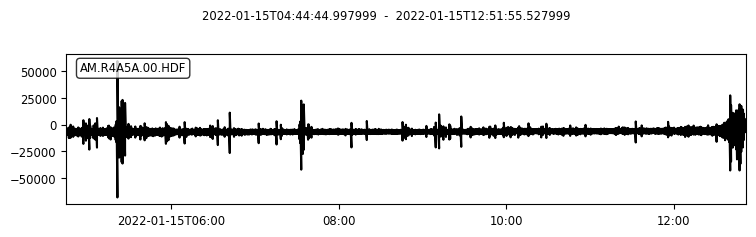

max =  68097.0
keep this trace?  (y/n): n


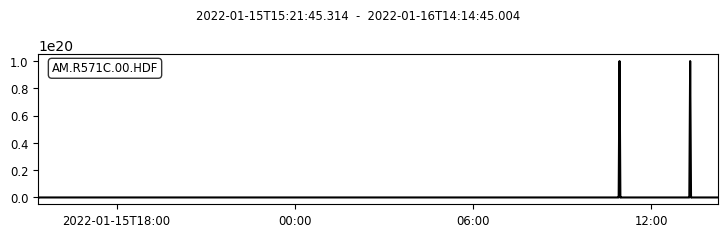

max =  954092.0
keep this trace?  (y/n): n


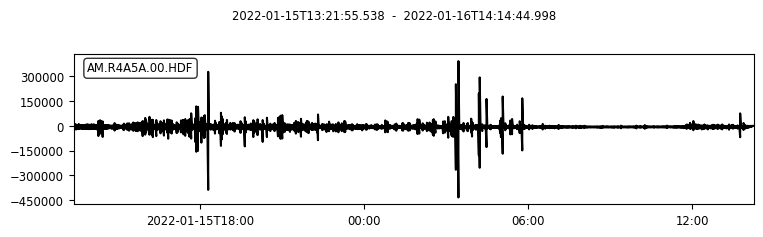

max =  434280.0
keep this trace?  (y/n): n


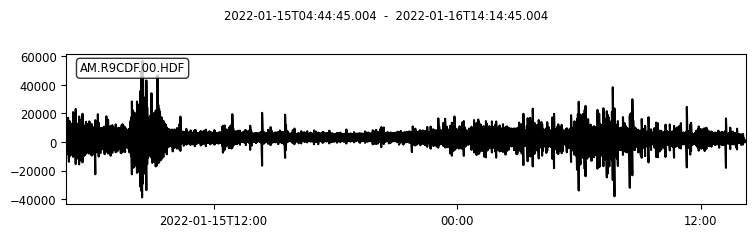

max =  56658.0
keep this trace?  (y/n): y


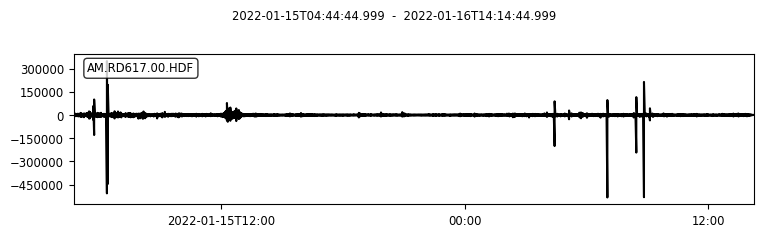

max =  533000.0
keep this trace?  (y/n): n


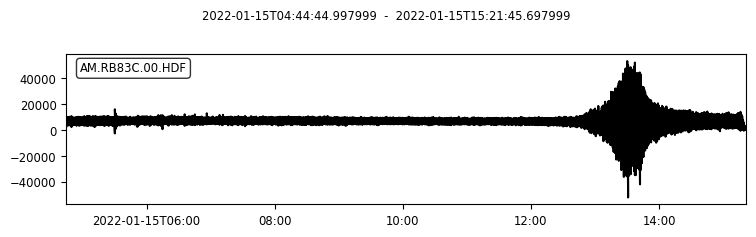

max =  52977.0
keep this trace?  (y/n): y


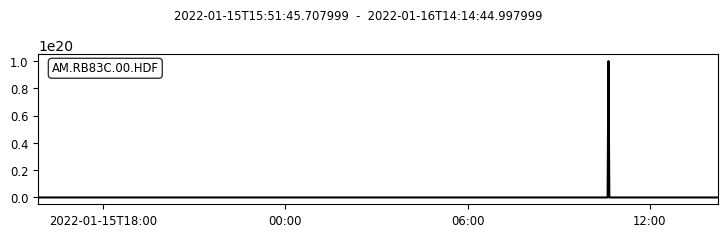

max =  21064.0
keep this trace?  (y/n): n


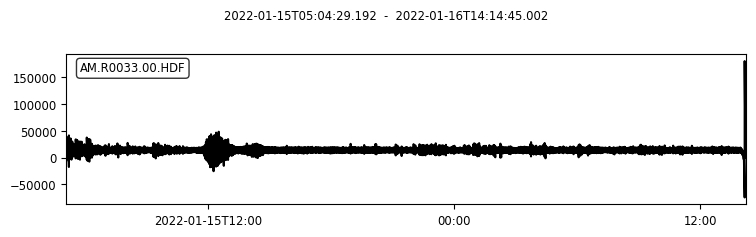

max =  180544.072163
keep this trace?  (y/n): y


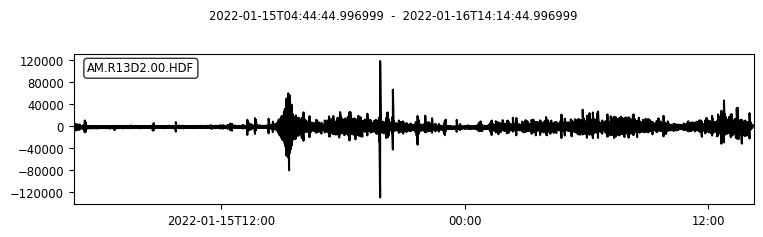

max =  130279.0
keep this trace?  (y/n): y


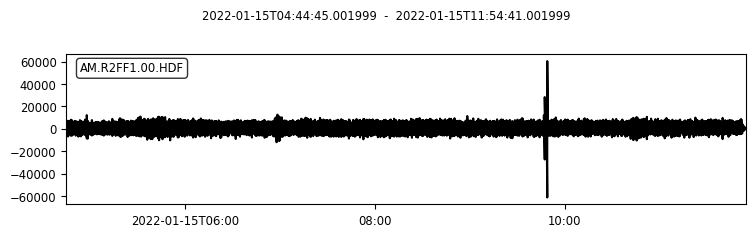

max =  61402.0
keep this trace?  (y/n): n


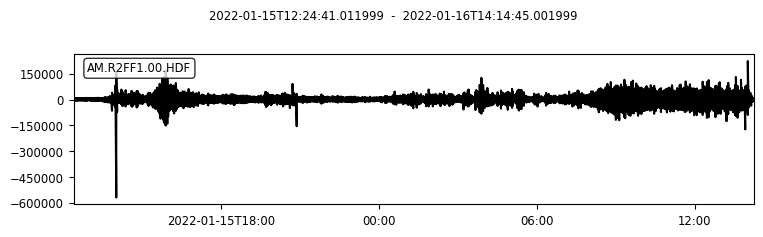

max =  569342.0
keep this trace?  (y/n): y


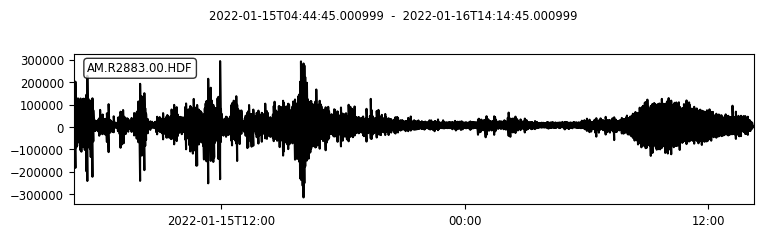

max =  315050.0
keep this trace?  (y/n): n


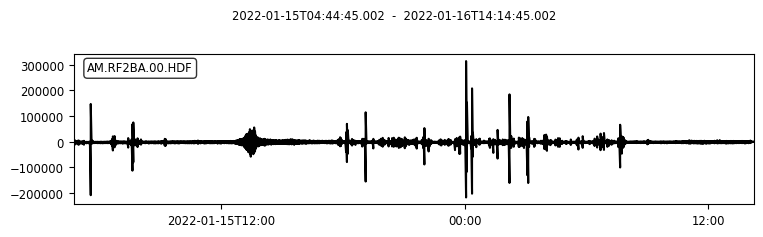

max =  314575.0
keep this trace?  (y/n): n


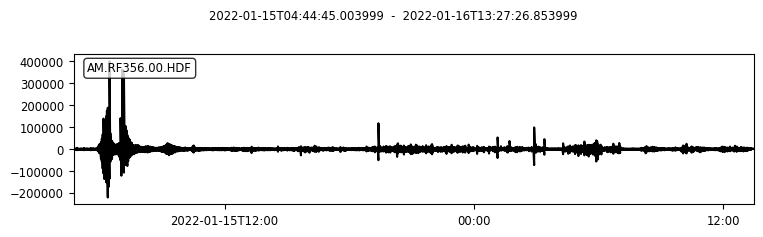

max =  399365.0
keep this trace?  (y/n): y


In [137]:
st_good = good_st.copy()
st_good.taper(0.01)
for tr in st_good:
    try:
        tr.filter('highpass', freq=0.0001, corners=2)
    except:
        pass
st_good = manually_select_good_traces(st_good) 

<Figure size 432x288 with 0 Axes>

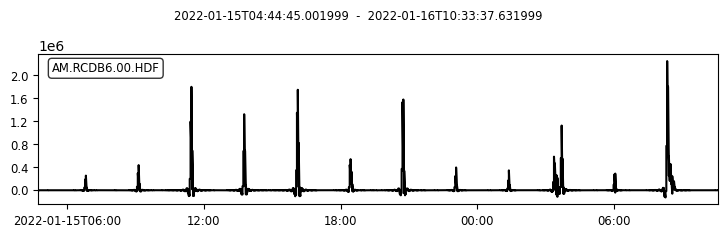

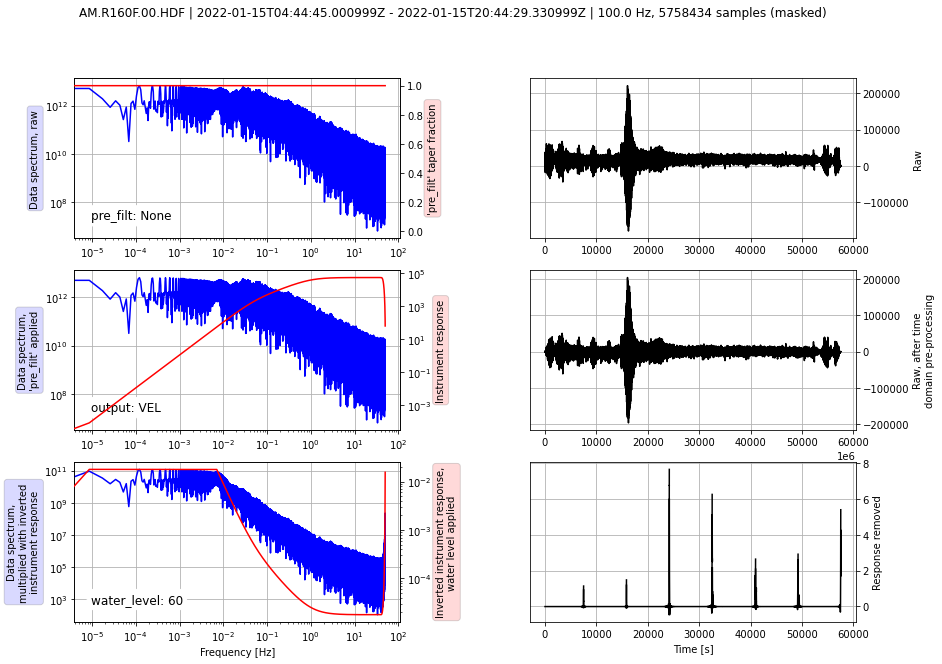

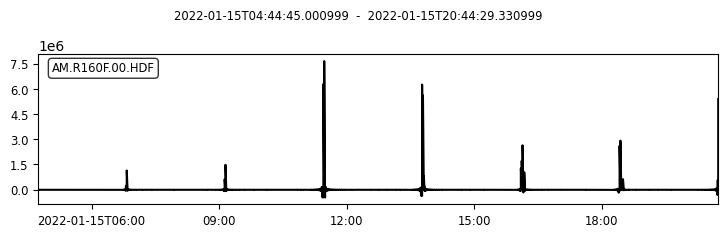

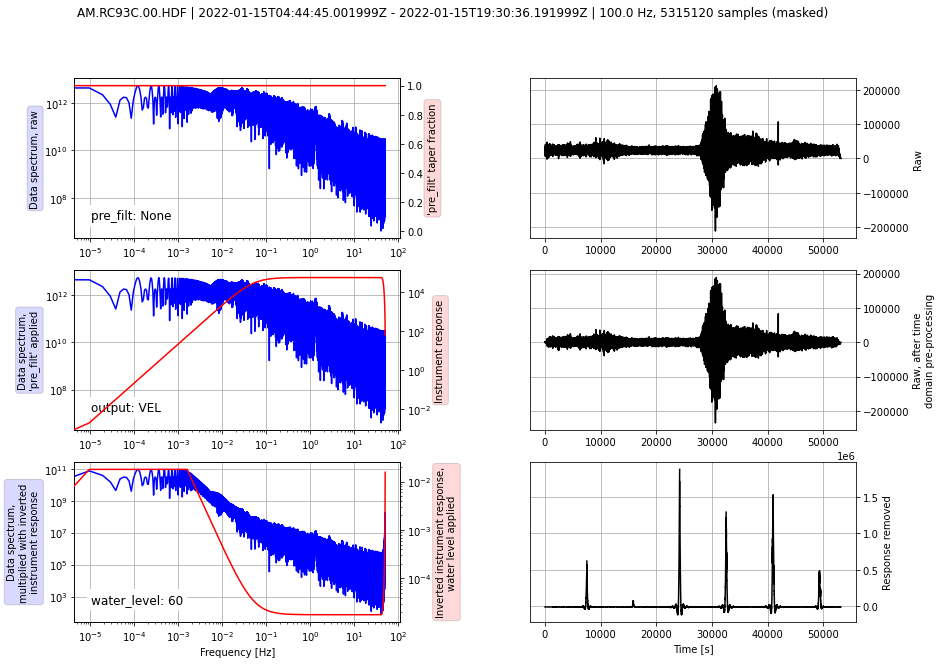

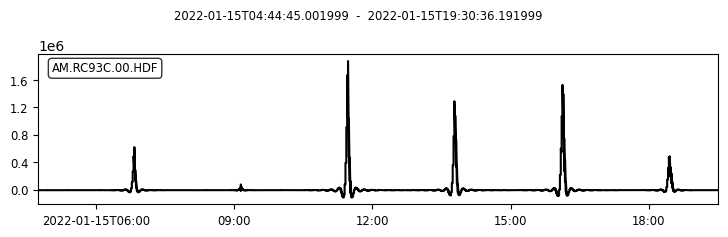

...

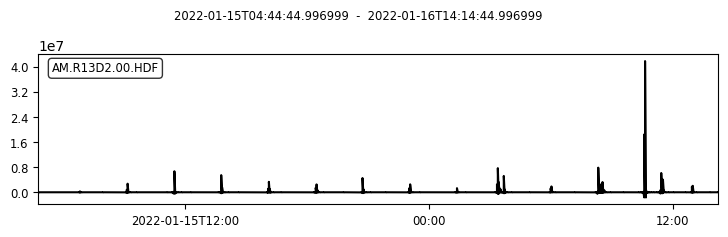

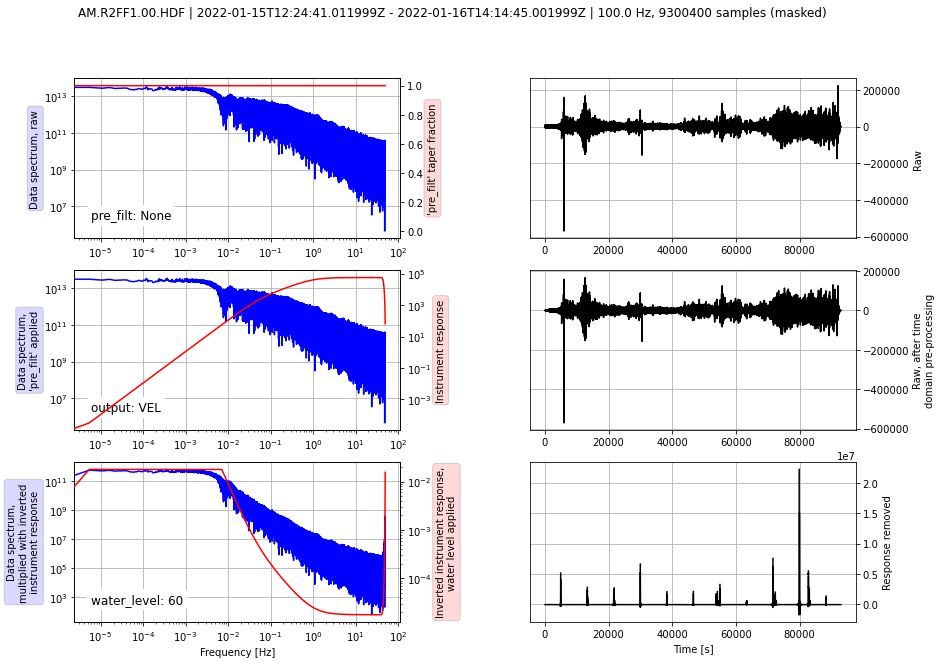

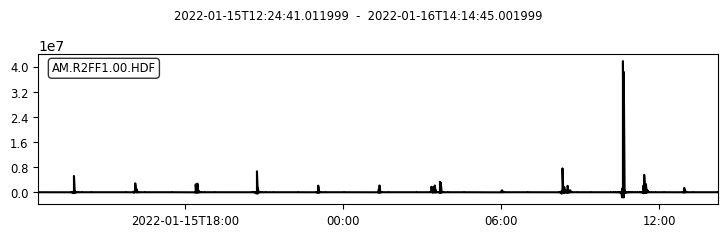

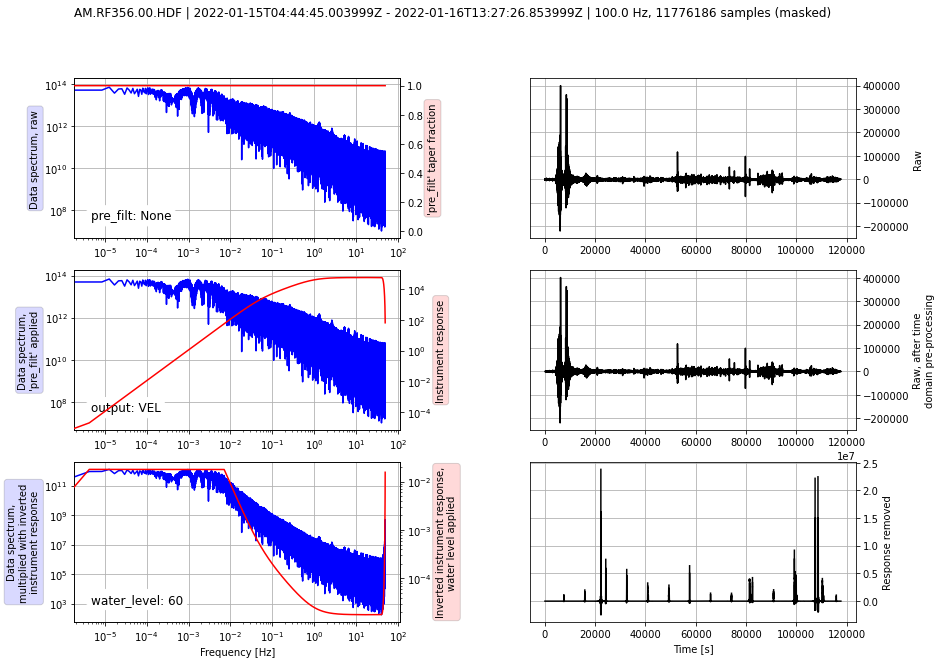

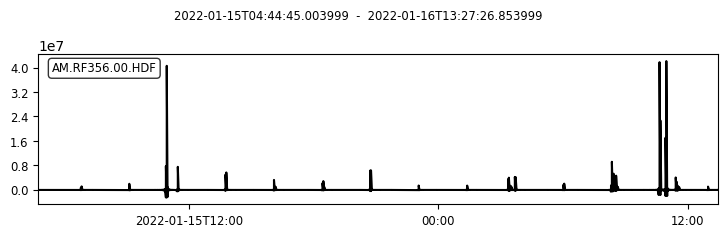

In [139]:
#st.select(station='MSVF').plot()
pre_filt = [0.001, 0.002, 0.25, 0.5]
inv = obspy.read_inventory(os.path.join(DATA_ROOT, 'rboom_HDF_within_180_degrees.xml'))
st_good2 = st_good.copy()
for tr in st_good2:
    #tr.remove_response(inventory=inv, pre_filt=pre_filt, plot=True, water_level=60)
    tr.remove_response(inventory=inv, pre_filt=pre_filt, plot=True, water_level=60)
    tr.plot();

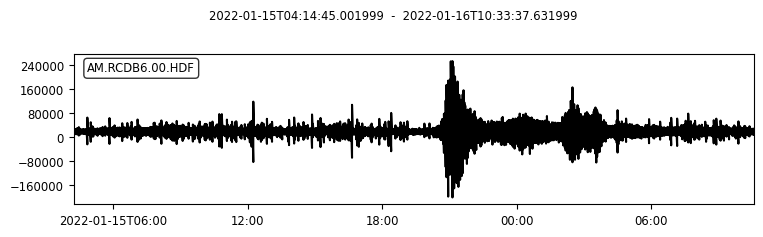

In [140]:
tr = good_st.copy()[0]
tr.plot();

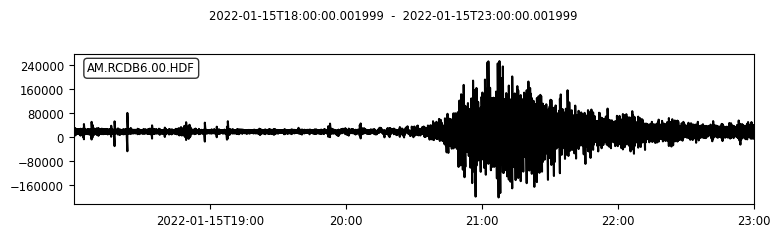

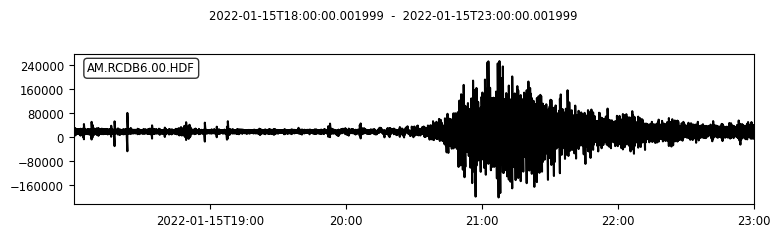

In [141]:
tr.trim(starttime=obspy.UTCDateTime(2022,1,15,18,0,0), endtime=obspy.UTCDateTime(2022,1,15,23,0,0))
tr.plot()

AM.RCDB6.00.HDF | 2022-01-15T18:00:00.001999Z - 2022-01-15T23:00:00.001999Z | 100.0 Hz, 1800001 samples

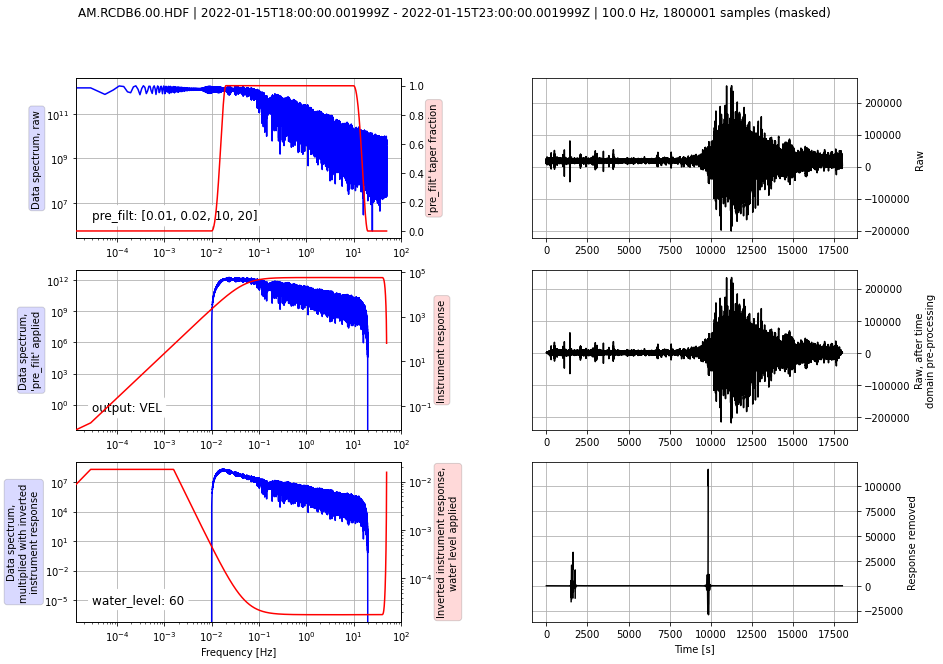

In [142]:
tr.remove_response(inventory=inv, pre_filt=[0.01, 0.02, 10, 20], plot=True, water_level=60)

In [174]:
inv_ldo3 = inv_ldo2.copy()
inv_ldo3.__add__(inv_ldf2)

Inventory created at 2022-02-08T21:08:43.001645Z
	Created by: ObsPy 1.2.2
		    https://www.obspy.org
	Sending institution: IRIS-DMC (IRIS-DMC)
	Contains:
		Networks (43):
			AE (2x), AK (2x), AV (2x), BK, C (2x), C0, CU, G, GS, II (2x), IU, 
			LD (2x), MM, MU (2x), N4, NC, NW, OH (2x), OK (2x), PB, PY, SB (2x)
			SC (2x), SG, UO (2x), WY (2x), XB, XX, YN (2x)
		Stations (368):
			AE.214A (Organ Pipe National Monument, Ajo, AZ, USA) (2x)
			AK.A19K (Wainwright, AK, USA) (2x)
			AK.A21K (Barrow, AK, USA) (2x)
			AK.A22K (Sinclair Lake, AK, USA)
			AK.C18K (Utukok River, AK, USA) (2x)
			AK.C23K (Itkillik River, AK, USA) (2x)
			AK.CAPN (Captain Cook Nikiski, AK, USA)
			AK.CHUM (Lake Minchumina, AK, USA) (2x)
			AK.COLD (Coldfoot Broadband, AK, USA) (2x)
			AK.CUT (Chulitna, AK, USA) (2x)
			AK.D17K (Noatak River, AK, USA) (2x)
			AK.D24K (Happy Valley, AK, USA) (2x)
			AK.D25K (Kavik River, AK, USA) (2x)
			AK.E21K (Killik River, AK, USA) (2x)
			AK.E25K (Arctic Village, AK, USA) (2x)

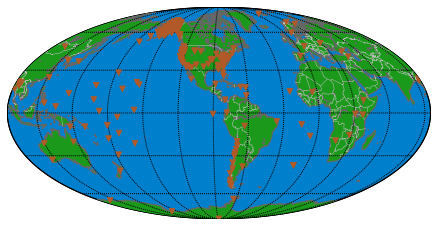

In [175]:
plot_inv(inv_ldo3)

In [176]:
msvf

1 Trace(s) in Stream:
II.MSVF.00.LDO | 2022-01-15T04:14:45.069538Z - 2022-01-16T14:14:44.069538Z | 1.0 Hz, 122400 samples

In [178]:
st_ldo.select(station='MSVF')[0].stats.distance_in_km

757.84181271450677

In [1]:
plot_inv(inv_ldo3)

NameError: name 'plot_inv' is not defined

/Users/thompsong/DATA/Tonga20220115/iris_HHZ_within_20_degrees.xml /Users/thompsong/DATA/Tonga20220115/iris_HHZ_within_20_degrees.mseed
Trying to load inventory from 2022/01/14 22:41 to 2022/01/15 16:48
inventory saved to /Users/thompsong/DATA/Tonga20220115/iris_HHZ_within_20_degrees.xml
['AU.NFK.HHZ', 'G.SANVU.HHZ', 'IU.AFI.HHZ', 'IU.AFI.HHZ', 'IU.FUNA.HHZ', 'IU.KNTN.HHZ', 'IU.RAO.HHZ', 'IU.RAR.HHZ', 'IU.RAR.HHZ', 'NZ.BKZ.HHZ', 'NZ.HIZ.HHZ', 'NZ.OUZ.HHZ', 'NZ.URZ.HHZ', 'VU.AMB1.HHZ', 'VU.PVM.HHZ']
failed to download waveform for  AU.NFK.HHZ
waveform downloaded for  G.SANVU.HHZ
waveform downloaded for  IU.AFI.HHZ
waveform downloaded for  IU.AFI.HHZ
failed to download waveform for  IU.FUNA.HHZ
failed to download waveform for  IU.KNTN.HHZ
failed to download waveform for  IU.RAO.HHZ
waveform downloaded for  IU.RAR.HHZ
More than 1 Trace
waveform downloaded for  IU.RAR.HHZ
More than 1 Trace
waveform downloaded for  NZ.BKZ.HHZ
waveform downloaded for  NZ.HIZ.HHZ
waveform downloaded for  NZ.O

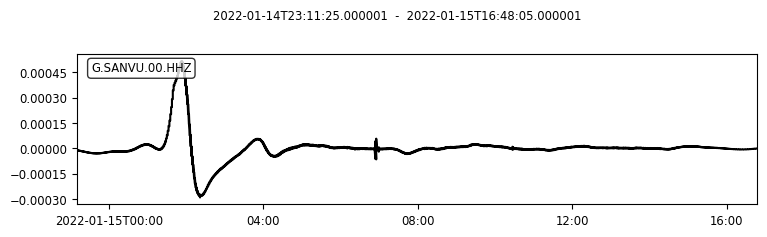

max =  0.000516960391406
keep this trace?  (y/n): y


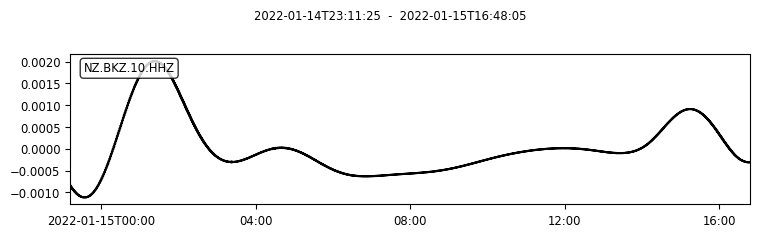

max =  0.0020126810496
keep this trace?  (y/n): y


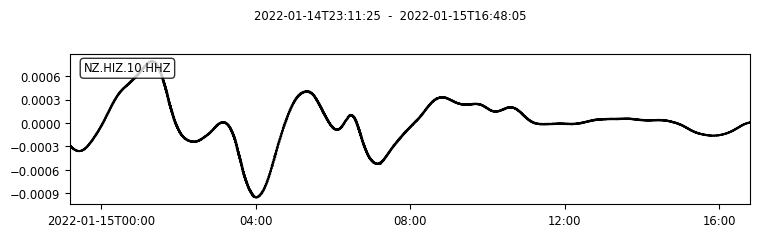

max =  0.000953963880556
keep this trace?  (y/n): y


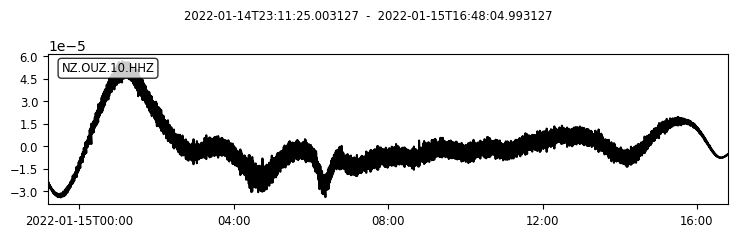

max =  5.66247385325e-05
keep this trace?  (y/n): y


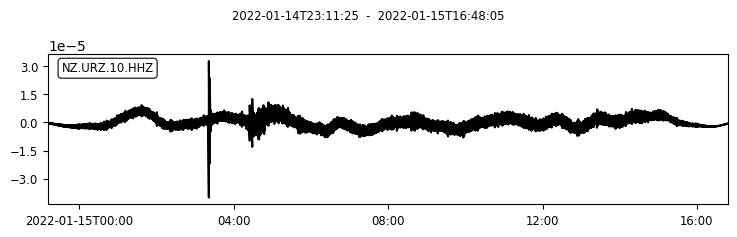

max =  3.99808082564e-05
keep this trace?  (y/n): y
['G.SANVU.00.HHZ', 'NZ.BKZ.10.HHZ', 'NZ.HIZ.10.HHZ', 'NZ.OUZ.10.HHZ', 'NZ.URZ.10.HHZ']
5


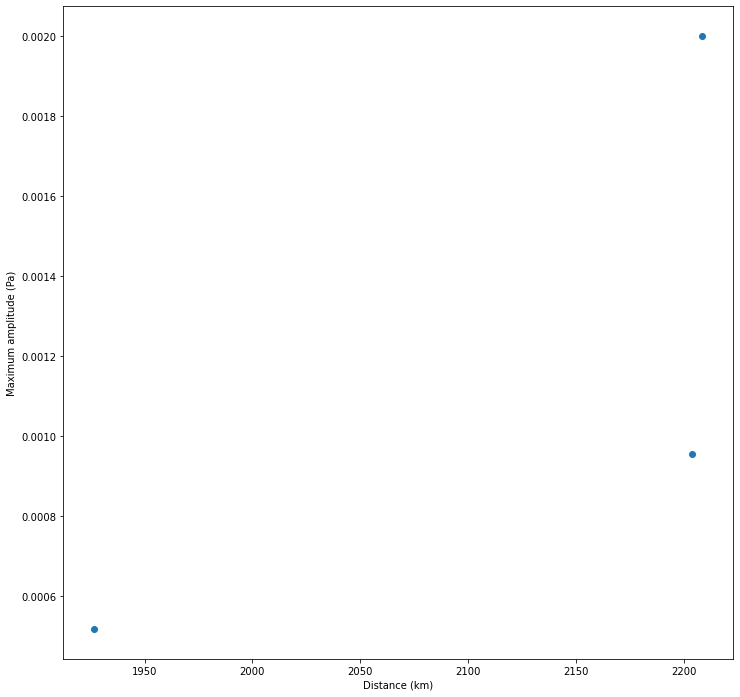

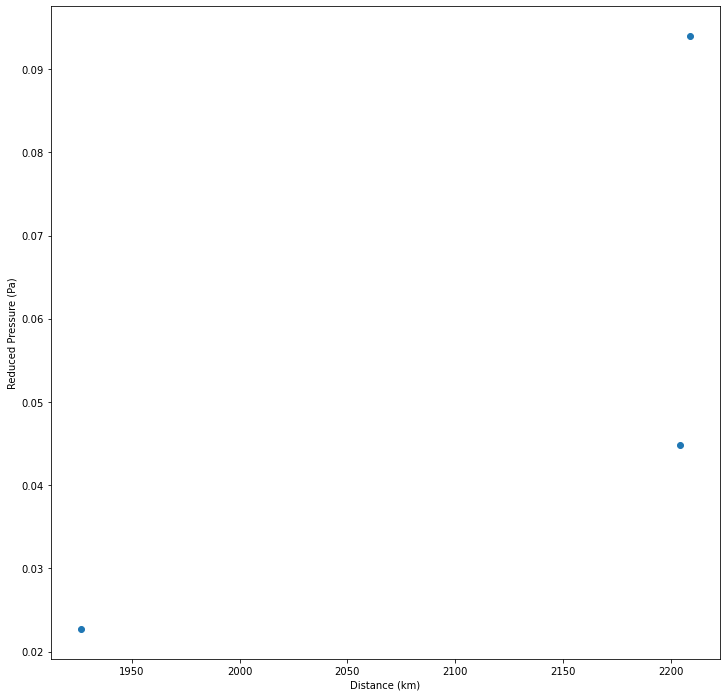

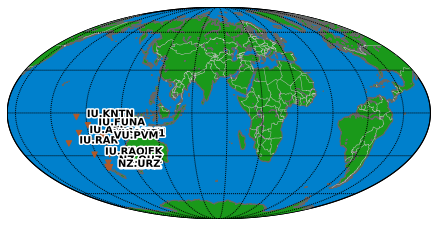

In [6]:
searchRadiusDeg = 20
fmin = 0.0001
T = 1.0/fmin

# location of Hunga-Tonga Hunga-Ha'apai
olat = -(20 + 34/60 + 12 /3600) 
olon = -(175 + 22/60 + 48/3600)
otime = obspy.core.UTCDateTime('2022-01-15T04:14:45.000000Z') # main eruption time - on day 2

startt = otime - T*2
endt = otime + 7 * 3600 + T*2 

fdsnURL = "http://service.iris.edu"
chanstring = 'HHZ'
st_hhz, inv_hhz = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)

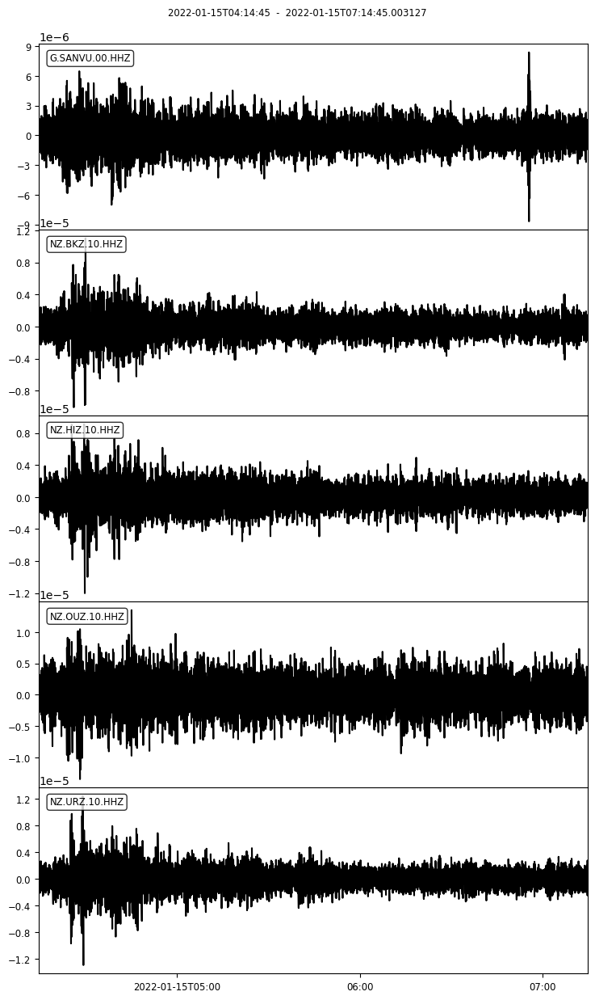

In [13]:
st=st_hhz.copy()
st.taper(0.1)
st.filter('bandpass', freqmin=0.01, freqmax=1.0, corners=2)
st.trim(starttime=obspy.UTCDateTime(2022,1,15,4,14,45),endtime=obspy.UTCDateTime(2022,1,15,7,14,45))
st.plot(equal_scale=False);

In [15]:
for tr in st_hhz:
    print(tr.stats.distance_in_km)

1926.43144713
2208.77805573
2204.08983876
1953.1073802
2095.11245236


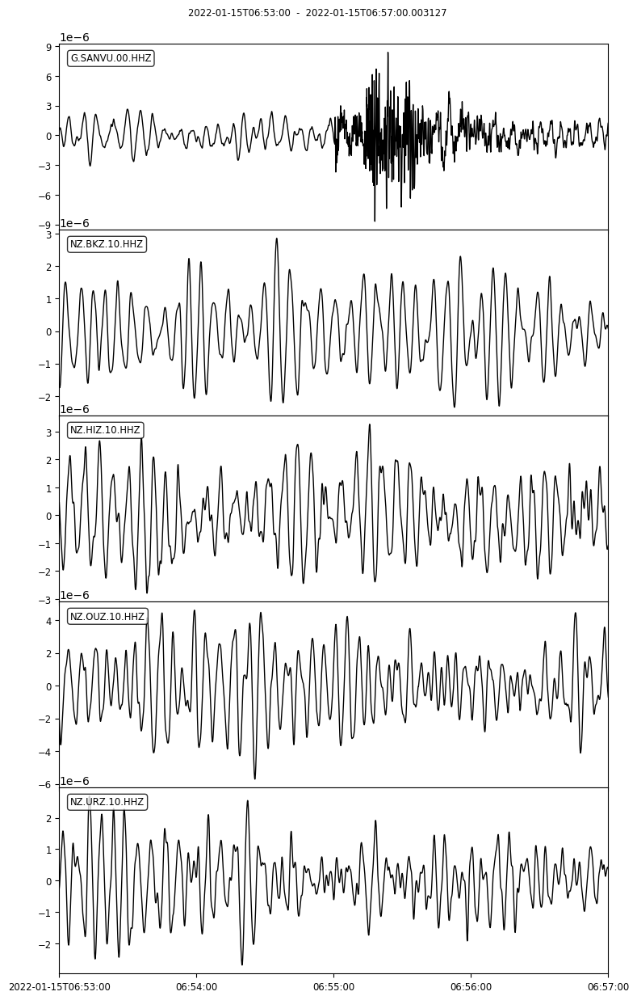

In [18]:
st.trim(starttime=obspy.UTCDateTime(2022,1,15,6,53,0),endtime=obspy.UTCDateTime(2022,1,15,6,57,0))
st.plot(equal_scale=False);

/Users/thompsong/DATA/Tonga20220115/iris_BHZ_within_20_degrees.xml /Users/thompsong/DATA/Tonga20220115/iris_BHZ_within_20_degrees.mseed
Trying to load inventory from 2022/01/14 22:41 to 2022/01/15 16:48
inventory saved to /Users/thompsong/DATA/Tonga20220115/iris_BHZ_within_20_degrees.xml
['AU.NFK.BHZ', 'AU.NIUE.BHZ', 'G.DZM.BHZ', 'G.FUTU.BHZ', 'G.NOUC.BHZ', 'G.SANVU.BHZ', 'II.MSVF.BHZ', 'II.MSVF.BHZ', 'IU.AFI.BHZ', 'IU.AFI.BHZ', 'IU.FUNA.BHZ', 'IU.KNTN.BHZ', 'IU.RAO.BHZ', 'IU.RAO.BHZ', 'IU.RAR.BHZ', 'IU.RAR.BHZ']
waveform downloaded for  AU.NFK.BHZ
failed to download waveform for  AU.NIUE.BHZ
waveform downloaded for  G.DZM.BHZ
More than 1 Trace
waveform downloaded for  G.FUTU.BHZ
waveform downloaded for  G.NOUC.BHZ
waveform downloaded for  G.SANVU.BHZ
waveform downloaded for  II.MSVF.BHZ
More than 1 Trace
waveform downloaded for  II.MSVF.BHZ
More than 1 Trace
waveform downloaded for  IU.AFI.BHZ
More than 1 Trace
waveform downloaded for  IU.AFI.BHZ
More than 1 Trace
waveform downloaded 

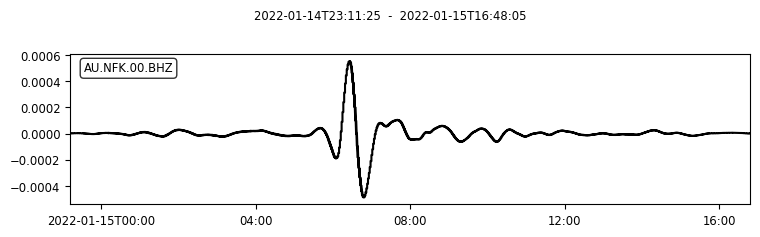

max =  0.000553990470075
keep this trace?  (y/n): y


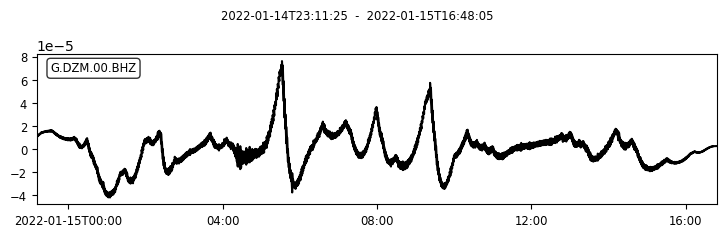

max =  7.62174290275e-05
keep this trace?  (y/n): y


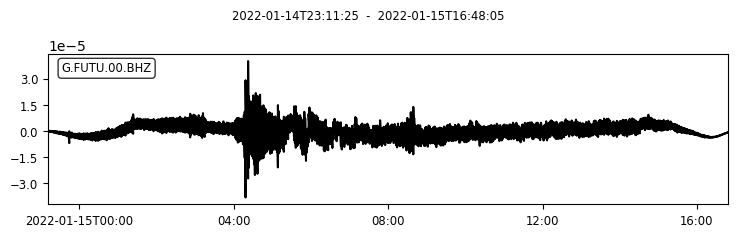

max =  4.01348273108e-05
keep this trace?  (y/n): y


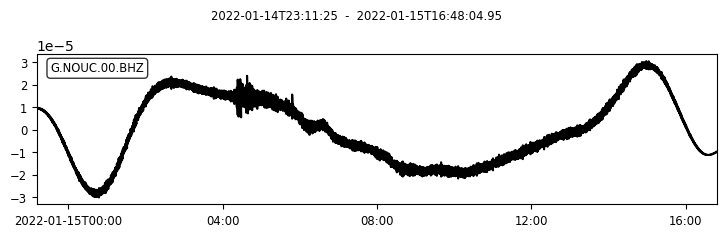

max =  3.05275670826e-05
keep this trace?  (y/n): y


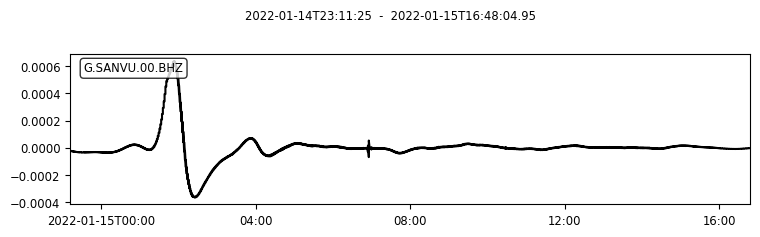

max =  0.000638177485349
keep this trace?  (y/n): y


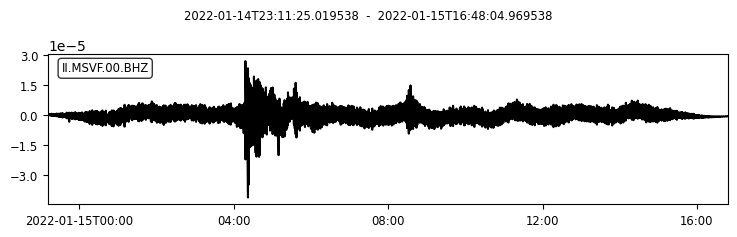

max =  4.11049315088e-05
keep this trace?  (y/n): y


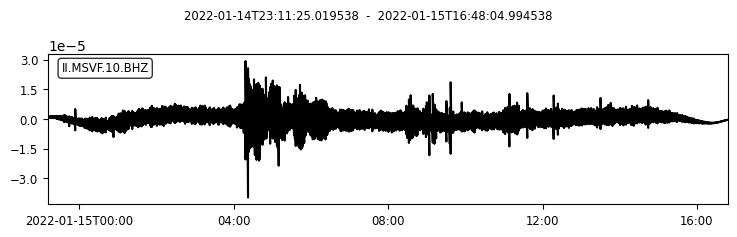

max =  3.9669657527e-05
keep this trace?  (y/n): y


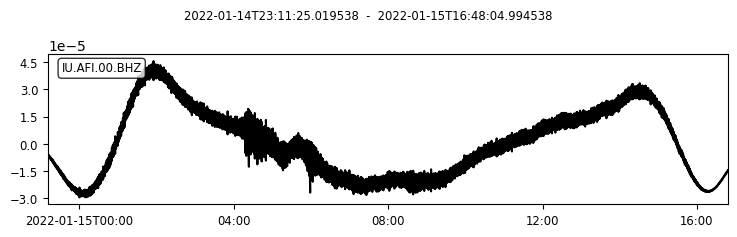

max =  4.55719934557e-05
keep this trace?  (y/n): y


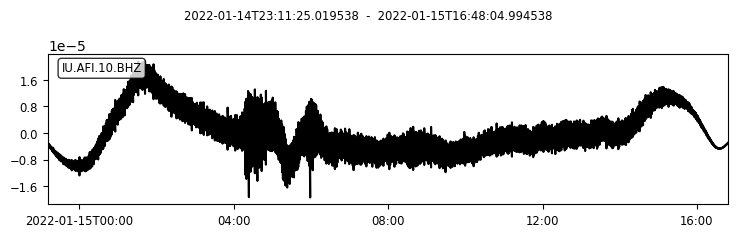

max =  2.16603166827e-05
keep this trace?  (y/n): y


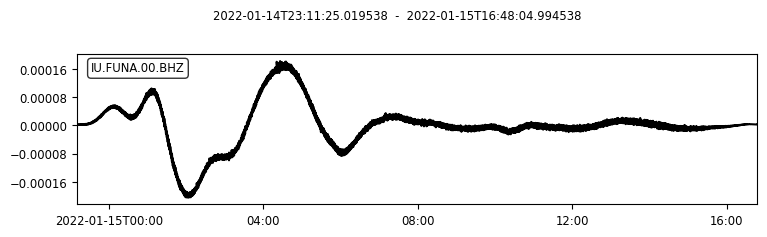

max =  0.00020404244092
keep this trace?  (y/n): y


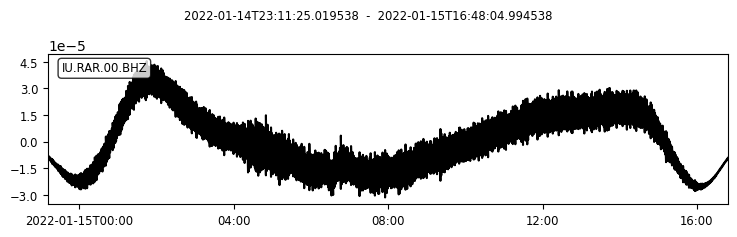

max =  4.54024355275e-05
keep this trace?  (y/n): y


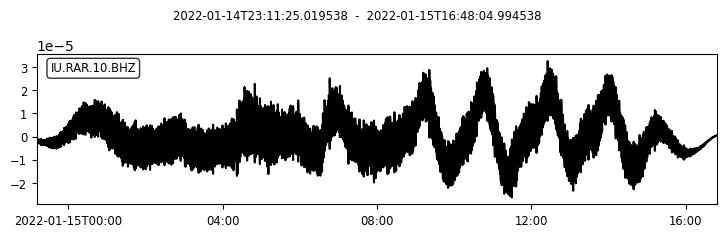

max =  3.25981228585e-05
keep this trace?  (y/n): y
['AU.NFK.00.BHZ', 'G.DZM.00.BHZ', 'G.FUTU.00.BHZ', 'G.NOUC.00.BHZ', 'G.SANVU.00.BHZ', 'II.MSVF.00.BHZ', 'II.MSVF.10.BHZ', 'IU.AFI.00.BHZ', 'IU.AFI.10.BHZ', 'IU.FUNA.00.BHZ', 'IU.RAR.00.BHZ', 'IU.RAR.10.BHZ']
12


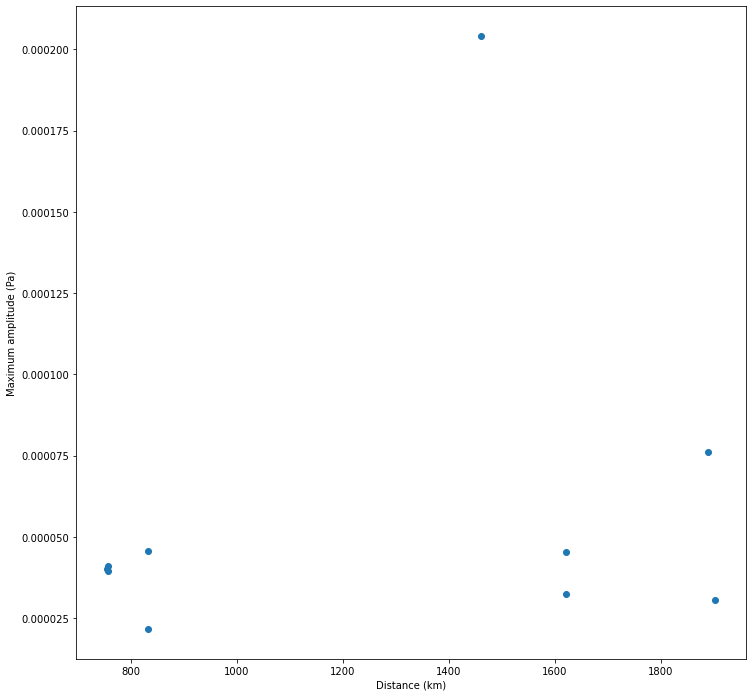

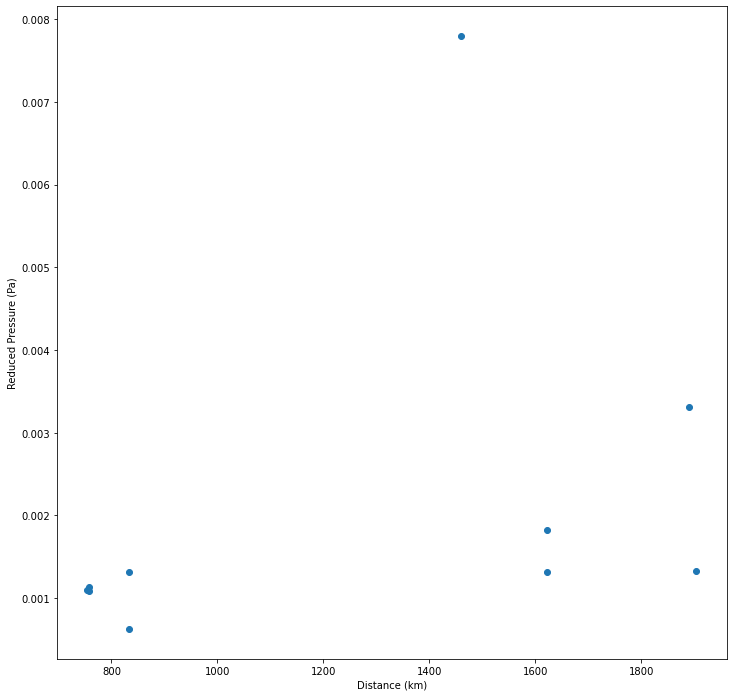

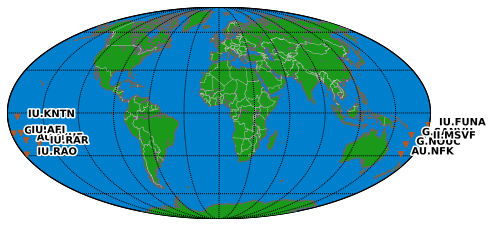

In [19]:
chanstring = 'BHZ'
st_bhz, inv_bhz = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)

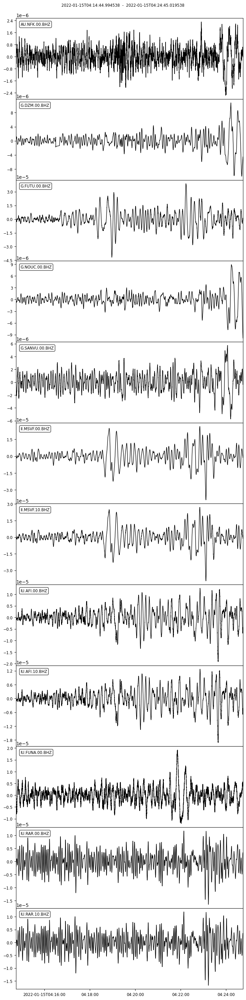

In [25]:
st=st_bhz.copy()
st.taper(0.1)
st.filter('bandpass', freqmin=0.01, freqmax=15.0, corners=2)
st.trim(starttime=obspy.UTCDateTime(2022,1,15,4,14,45),endtime=obspy.UTCDateTime(2022,1,15,4,24,45))
st.plot(equal_scale=False);

60 6671.695598673524 22238.985328911745 17557.093680719798
/home/thompsong/DATA/Tonga20220115/iris_LHZ_within_60_degrees.xml /home/thompsong/DATA/Tonga20220115/iris_LHZ_within_60_degrees.mseed
['G.CAN.LHZ', 'G.DRV.LHZ', 'G.FUTU.LHZ', 'G.KIP.LHZ', 'G.KIP.LHZ', 'G.NOUC.LHZ', 'G.PPTF.LHZ', 'G.SANVU.LHZ', 'G.SANVU.LHZ', 'G.SANVU.LHZ', 'GE.FAKI.LHZ', 'GE.PMG.LHZ', 'GE.PMG.LHZ', 'GE.SAUI.LHZ', 'GE.SOEI.LHZ', 'GE.TNTI.LHZ', 'II.KWJN.LHZ', 'II.KWJN.LHZ', 'II.MSVF.LHZ', 'II.MSVF.LHZ', 'II.TAU.LHZ', 'II.TAU.LHZ', 'II.WRAB.LHZ', 'II.WRAB.LHZ', 'IM.VNDA.LHZ', 'IU.AFI.LHZ', 'IU.AFI.LHZ', 'IU.CTAO.LHZ', 'IU.CTAO.LHZ', 'IU.FUNA.LHZ', 'IU.GUMO.LHZ', 'IU.GUMO.LHZ', 'IU.HNR.LHZ', 'IU.HNR.LHZ', 'IU.JOHN.LHZ', 'IU.JOHN.LHZ', 'IU.KIP.LHZ', 'IU.KIP.LHZ', 'IU.KNTN.LHZ', 'IU.MIDW.LHZ', 'IU.PMG.LHZ', 'IU.PMG.LHZ', 'IU.PMG.LHZ', 'IU.POHA.LHZ', 'IU.POHA.LHZ', 'IU.PTCN.LHZ', 'IU.PTCN.LHZ', 'IU.RAO.LHZ', 'IU.RAO.LHZ', 'IU.RAR.LHZ', 'IU.RAR.LHZ', 'IU.SBA.LHZ', 'IU.SBA.LHZ', 'IU.SNZO.LHZ', 'IU.SNZO.LHZ', 'IU.TARA.LH

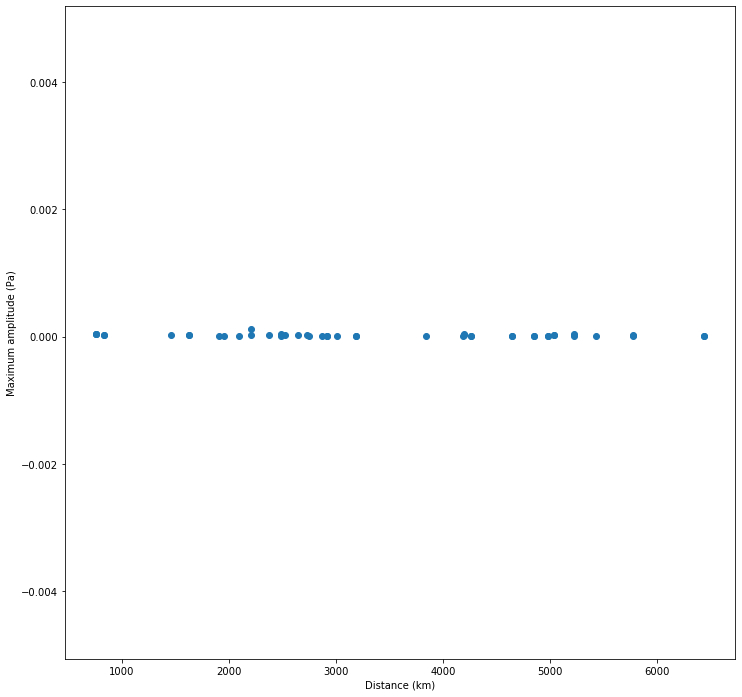

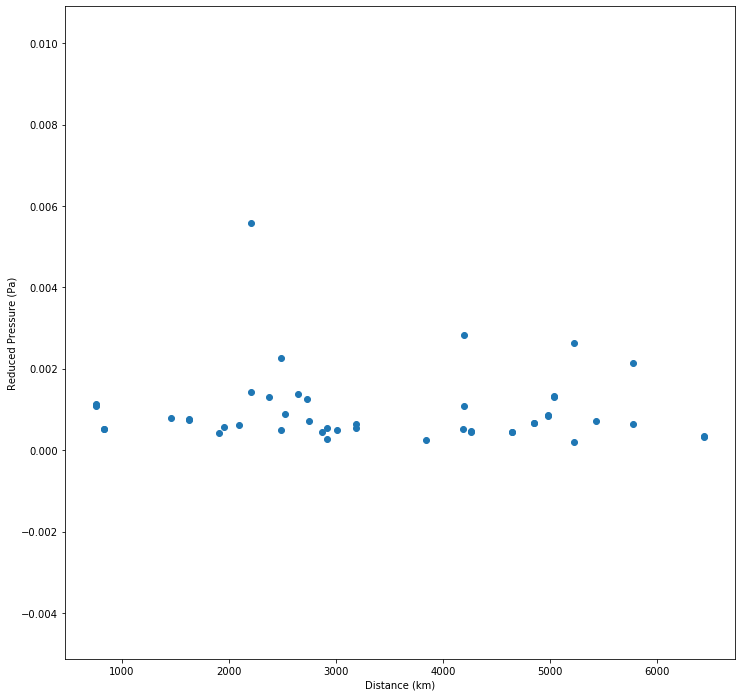

Failed to subset inventory. Returning unchanged


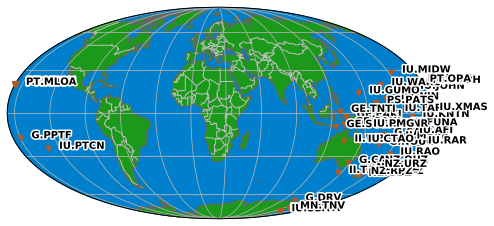

In [13]:
searchRadiusDeg = 60
fmin = 0.001
T = 1.0/fmin

# location of Hunga-Tonga Hunga-Ha'apai
olat = -(20 + 34/60 + 12 /3600) 
olon = -(175 + 22/60 + 48/3600)
otime = obspy.core.UTCDateTime('2022-01-15T04:14:45.000000Z') # main eruption time - on day 2

distkm = degrees2kilometers(searchRadiusDeg)
max_acoustic_speed = 380
min_acoustic_speed = 300
min_travel_time = distkm * 1000 / max_acoustic_speed 
max_travel_time = distkm * 1000 / min_acoustic_speed                   
print(searchRadiusDeg, distkm, max_travel_time, min_travel_time)

startt = otime - T*2
endt = otime + max_travel_time + T*2 

fdsnURL = "http://service.iris.edu"
chanstring = 'LHZ'
st_lhz, inv_lhz = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)

In [14]:
st_lhz

47 Trace(s) in Stream:

G.CAN.00.LHZ | 2022-01-14T22:41:25.000000Z - 2022-01-15T15:58:43.000000Z | 1.0 Hz, 62239 samples
...
(45 other traces)
...
PS.PATS..LHZ | 2022-01-14T22:41:25.511300Z - 2022-01-15T15:58:43.511300Z | 1.0 Hz, 62239 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]

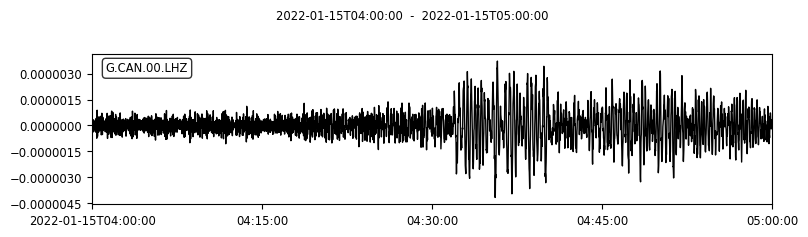

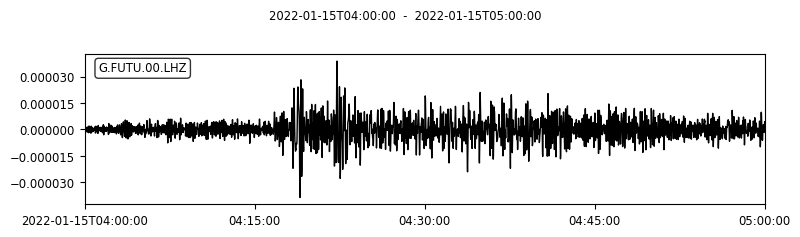

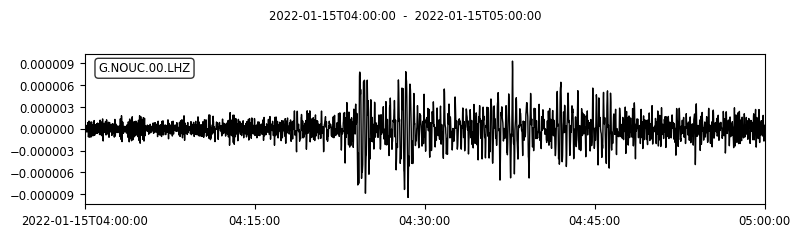

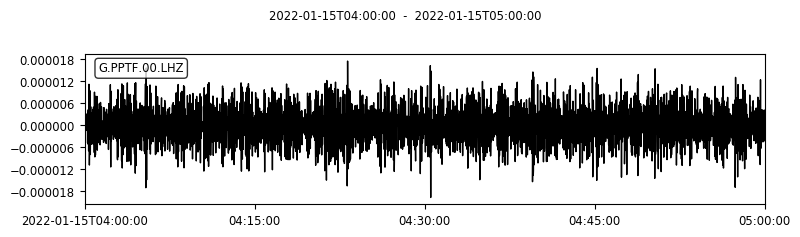

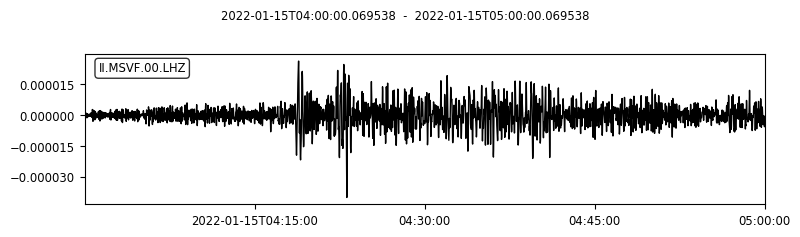

...

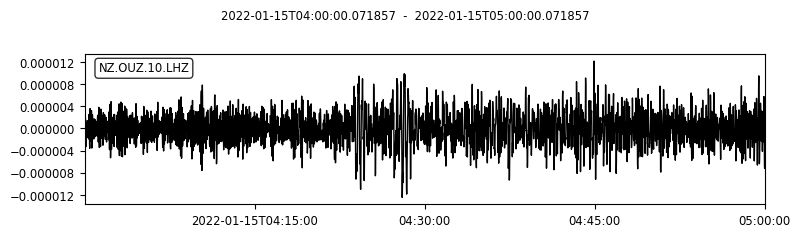

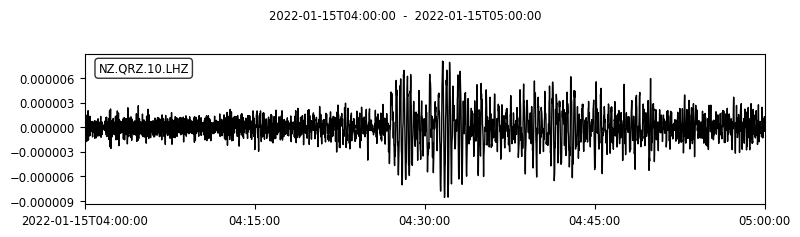

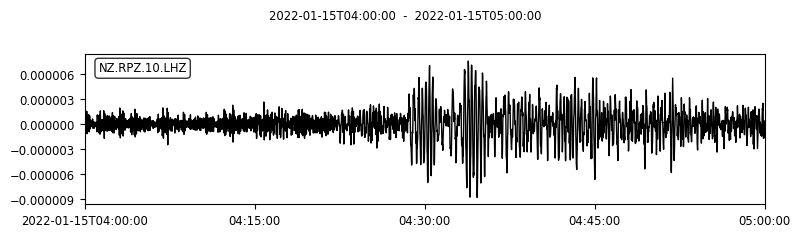

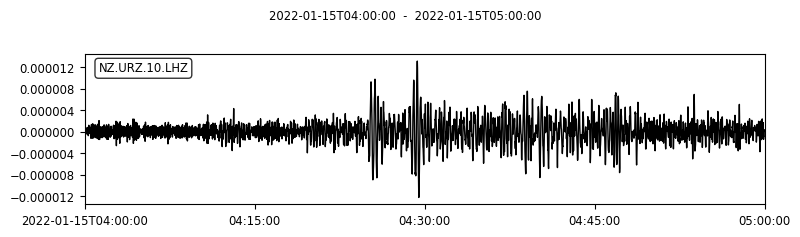

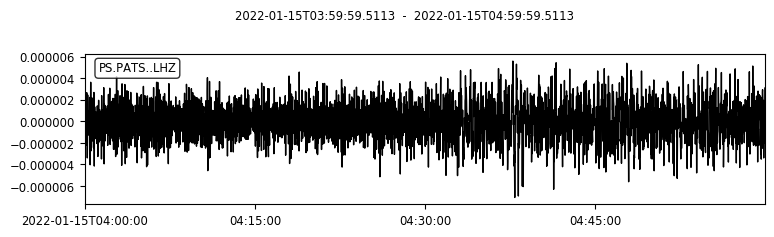

In [18]:
st = st_lhz.copy()
st.taper(0.1)
st.filter('bandpass', freqmin=0.003, freqmax=0.5, corners=2)
st.trim(starttime=obspy.UTCDateTime(2022,1,15,4,0,0),endtime=obspy.UTCDateTime(2022,1,15,5,0,0))
for tr in st:
    tr.plot()


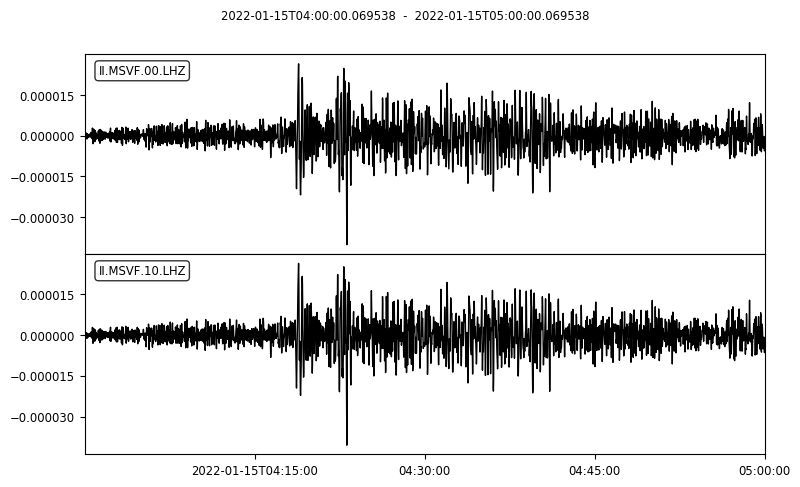

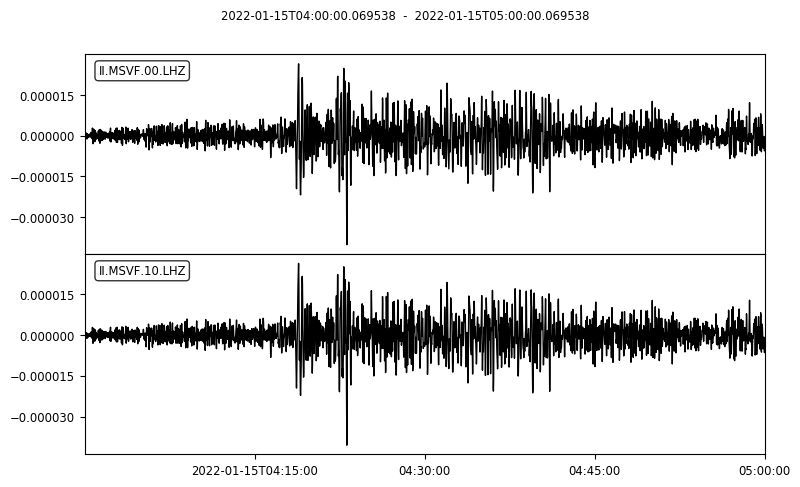

In [19]:
st.select(station='MSVF').plot();

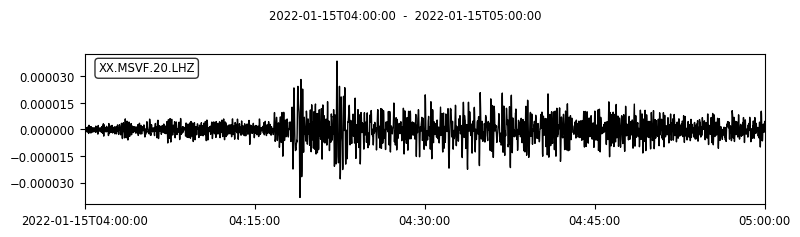

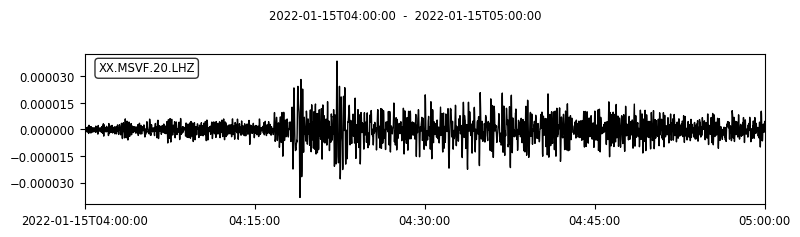

In [21]:
tr = obspy.core.Trace()
tr.data = st[0].data + st[1].data
tr.stats.starttime = st[0].stats.starttime
tr.stats.sampling_rate = st[0].stats.sampling_rate
tr.id = 'XX.MSVF.20.LHZ'
tr.plot()

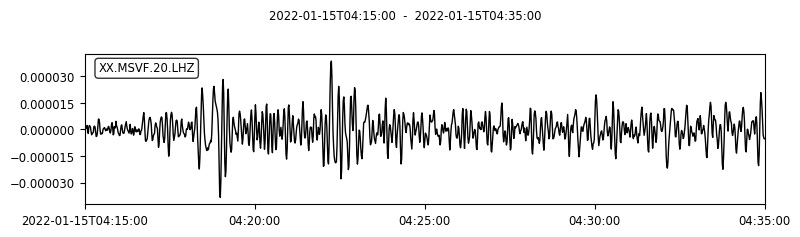

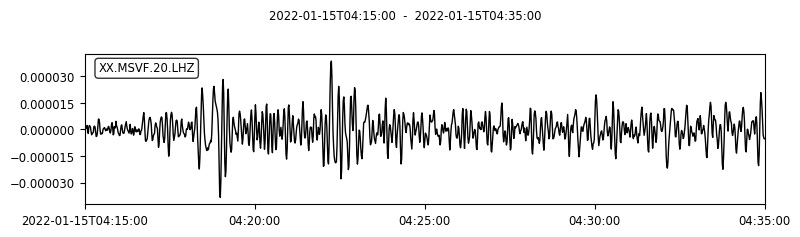

In [22]:
tr.trim(starttime=obspy.UTCDateTime(2022,1,15,4,15,0),endtime=obspy.UTCDateTime(2022,1,15,4,35,0))
tr.plot()

In [52]:
fdsnClient = Client(fdsnURL)  
startt = otime-10000
endt = obspy.UTCDateTime(2022,1,15,7,0,0)+10000

msvf = fdsnClient.get_waveforms('II', 'MSVF', '*', '*', startt, endt)

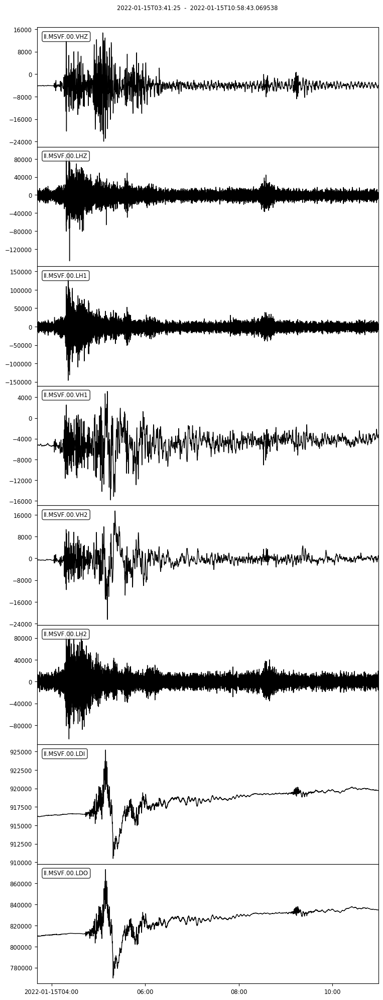

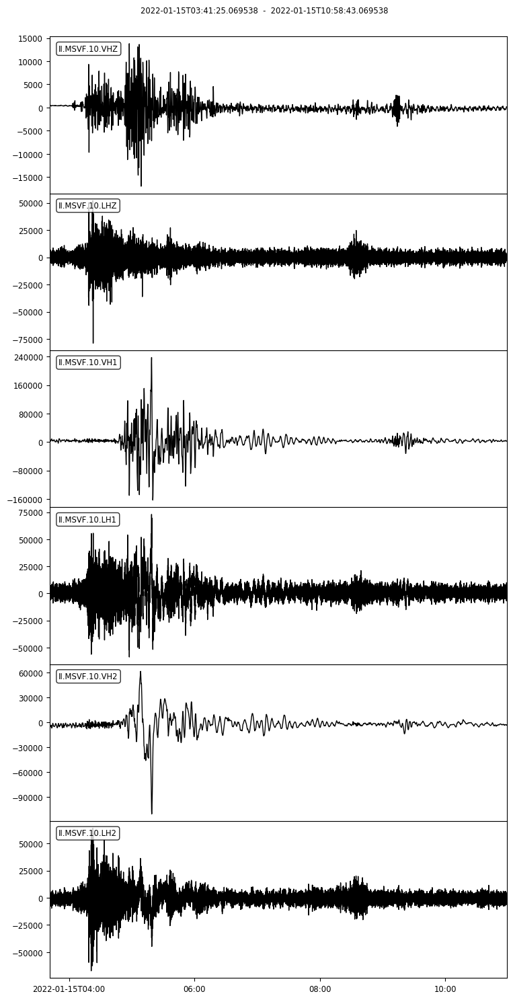

In [28]:
for loc in ['00', '10']:
    st = msvf.select(location=loc, channel='[LV][HD]?')
    st.plot(equal_scale=False);

In [30]:
for tr in msvf:
    print(tr.id, tr.stats.sampling_rate)

II.MSVF.00.BH1 20.0
II.MSVF.00.BH2 20.0
II.MSVF.00.BHZ 20.0
II.MSVF.00.LCE 1.0
II.MSVF.00.LCQ 1.0
II.MSVF.00.LDI 1.0
II.MSVF.00.LDO 1.0
II.MSVF.00.LH1 1.0
II.MSVF.00.LH2 1.0
II.MSVF.00.LHZ 1.0
II.MSVF.00.LN1 1.0
II.MSVF.00.LN2 1.0
II.MSVF.00.LNZ 1.0
II.MSVF.00.VH1 0.1
II.MSVF.00.VH2 0.1
II.MSVF.00.VHZ 0.1
II.MSVF.00.VM1 0.1
II.MSVF.00.VM2 0.1
II.MSVF.00.VMZ 0.1
II.MSVF.10.BH1 40.0
II.MSVF.10.BH2 40.0
II.MSVF.10.BHZ 40.0
II.MSVF.10.LCE 1.0
II.MSVF.10.LCQ 1.0
II.MSVF.10.LH1 1.0
II.MSVF.10.LH2 1.0
II.MSVF.10.LHZ 1.0
II.MSVF.10.VH1 0.1
II.MSVF.10.VH2 0.1
II.MSVF.10.VHZ 0.1
II.MSVF.10.VMU 0.1
II.MSVF.10.VMV 0.1
II.MSVF.10.VMW 0.1


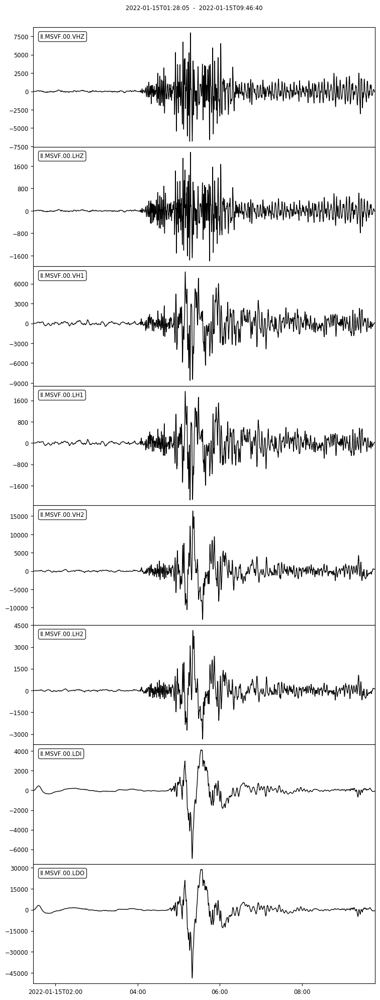

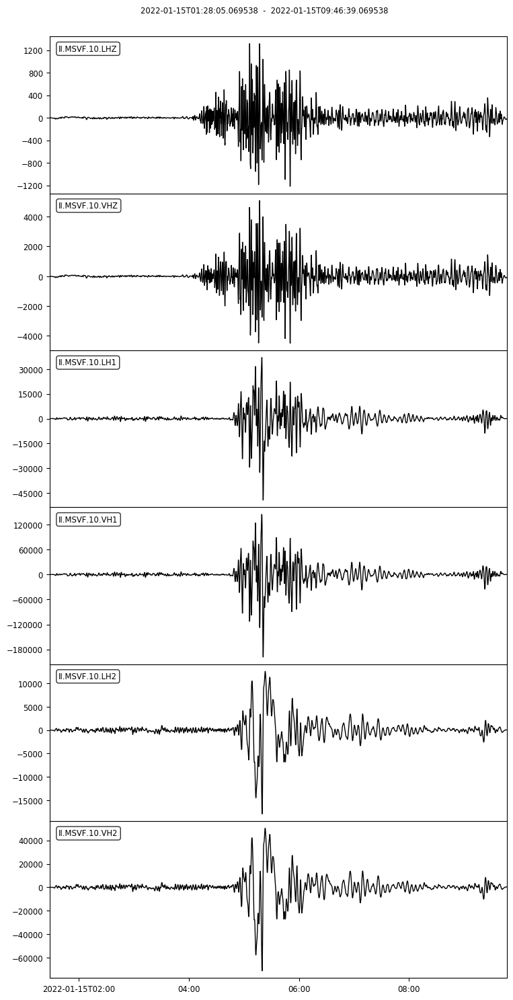

In [38]:
for loc in ['00', '10']:
    st = msvf.copy().select(location=loc, channel='[LV][HD]?')
    st.detrend('linear')
    st.taper(0.02)
    st.filter('bandpass',freqmin=0.0002,freqmax=0.01)
    st.plot(equal_scale=False);

In [53]:
print(msvf)

33 Trace(s) in Stream:

II.MSVF.00.BH1 | 2022-01-15T01:28:05.019539Z - 2022-01-15T09:46:39.969539Z | 20.0 Hz, 598300 samples
...
(31 other traces)
...
II.MSVF.10.VMW | 2022-01-15T01:28:10.000000Z - 2022-01-15T09:46:40.000000Z | 0.1 Hz, 2992 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]


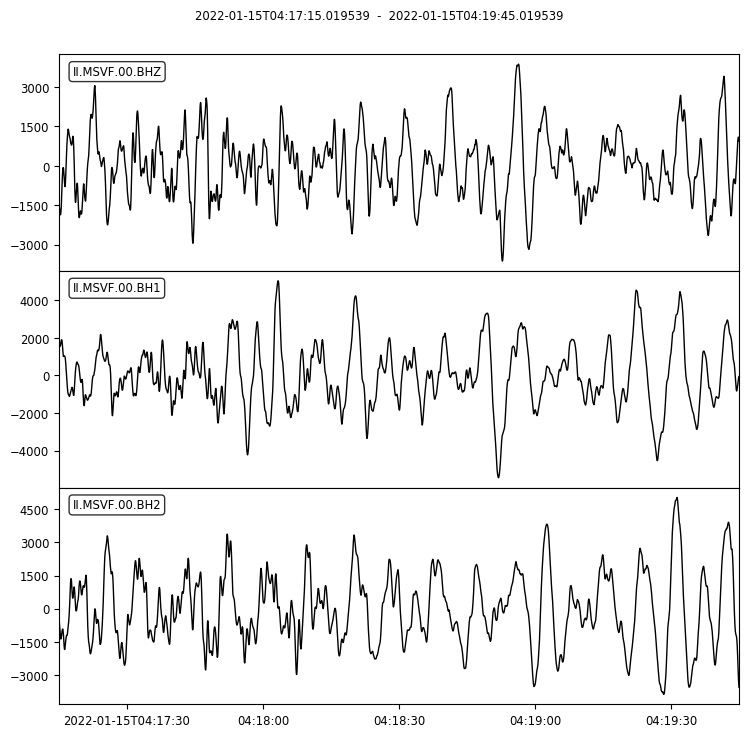

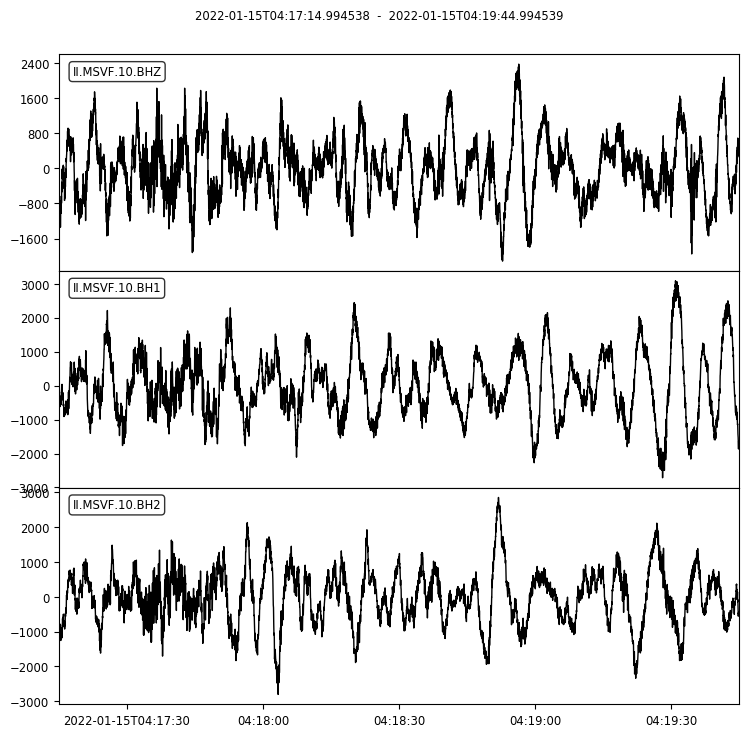

In [67]:
for loc in ['00', '10']:
    st = msvf.copy().select(location=loc, channel='B[HD]?')
    st.detrend('linear')
    st.taper(0.02)
    st.filter('highpass',freq=0.5,corners=2)
    st.trim(starttime=otime+150,endtime=otime+300)
    st.plot(equal_scale=False);

In [ ]:
searchRadiusDeg = 120
fmin = 0.001
T = 1.0/fmin

# location of Hunga-Tonga Hunga-Ha'apai
olat = -(20 + 34/60 + 12 /3600) 
olon = -(175 + 22/60 + 48/3600)
otime = obspy.core.UTCDateTime('2022-01-15T04:14:45.000000Z') # main eruption time - on day 2

distkm = degrees2kilometers(searchRadiusDeg)
max_acoustic_speed = 380
min_acoustic_speed = 300
min_travel_time = distkm * 1000 / max_acoustic_speed 
max_travel_time = distkm * 1000 / min_acoustic_speed                   
print(searchRadiusDeg, distkm, max_travel_time, min_travel_time)

startt = otime - T*2
endt = otime + max_travel_time + T*2 

fdsnURL = "http://service.iris.edu"
chanstring = 'LHZ'
st_lhz, inv_lhz = analyze_clientchan(fdsnURL, chanstring, fmin=fmin)